In [1]:
%reset -f

In [2]:
import sys
import os
import pandas as pd
import numpy as np
from datetime import datetime
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from scipy.stats import shapiro, zscore, probplot
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [3]:
#=============================================================================#
''' This section processes and investigates the data. '''
#=============================================================================#

' This section processes and investigates the data. '

In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

def load_data(train_path, test_path):
    """
    Load the CSV files into DataFrames.

    Parameters:
    train_path (str): The file path for the training data CSV file.
    test_path (str): The file path for the test data CSV file.

    Returns:
    DataFrame: Training data.
    DataFrame: Test data.

    Explanation:
    The function reads the CSV files into DataFrames using the read_csv function from the pandas library.
    """
    data_train = pd.read_csv(train_path)
    data_test = pd.read_csv(test_path)
    return data_train, data_test

def convert_height_to_inches(height):
    """
    Converts height from feet and inches to inches.

    Parameters:
    height (str): Height in the format "ft-in".

    Returns:
    int: Height in inches.

    Explanation: 
    The function converts the height from feet and inches to inches. 
    It first checks if the height is in the format "Jun-00" and returns 72 inches if it is.
    This is not always necessary, but in this case, since the data was gathered from a 
    website in an unstructured format and pasted into an .csv file, Excel automatically
    converted the height into a date format. This is a workaround to convert it back to inches.
    """
    if height == 'Jun-00':
        return 72
    
    formats = ['%d-%b', '%b-%d']
    for fmt in formats:
        try:
            date_obj = datetime.strptime(height, fmt)
            feet = date_obj.month
            inches = date_obj.day
            return feet * 12 + inches
        except (ValueError, TypeError):
            continue
    
    return np.nan

def preprocess_data(data_train, data_test):
    """
    Preprocess the data by selecting necessary columns, concatenating DataFrames,
    dropping unwanted rows, and resetting indices.

    Parameters:
    data_train (DataFrame): Training data.
    data_test (DataFrame): Test data.

    Returns:
    DataFrame: Preprocessed full dataset.

    Explanation:
    Preprocessing data is a crucial step in the analysis process. Real-world data is often
    messy and requires cleaning and transformation to make it suitable for analysis. This function
    preprocesses the data by selecting only the necessary columns, concatenating the training and
    test datasets, dropping unwanted rows, and resetting the indices. The function also converts
    the height from feet and inches to inches and drops special teams positions. Finally, it combines
    similar positions and resets the index to start from 1.

    While this is only an experiment to display what is capable, a production model would also
    implement these steps, albeit in a more automated fashion.
    """
    # Convert height to inches for both datasets
    data_test['Ht'] = data_test['Ht'].apply(convert_height_to_inches)
    
    # Keep only necessary columns
    columns_to_keep = ['Pos', 'Ht', 'Wt', 'Forty', 'Vertical', 'BenchReps', 'BroadJump', 'Cone', 'Shuttle']
    data_train = data_train[columns_to_keep]
    data_test = data_test[columns_to_keep]
    
    # Concatenate the dataframes
    full_dataset = pd.concat([data_train, data_test], ignore_index=True)
    
    # Drop special teams positions
    positions_to_drop = ['P', 'K', 'LS']
    full_dataset = full_dataset[~full_dataset['Pos'].isin(positions_to_drop)]
    
    # Drop rows with NaN values in specified columns
    columns_to_check = ['Forty', 'Vertical', 'BenchReps', 'BroadJump', 'Cone', 'Shuttle']
    full_dataset = full_dataset.dropna(subset=columns_to_check)
    
    # Combine similar positions
    position_mapping = {
        'OLB': 'LB', 'ILB': 'LB', 'LB': 'LB', 'EDGE': 'LB',
        'FS': 'S', 'SS': 'S', 'S': 'S',
        'CB': 'DB', 'DB': 'DB',
        'DE': 'DL', 'DT': 'DL', 'DL': 'DL',
        'OT': 'OL', 'OG': 'OL', 'OL': 'OL', 'C': 'OL', 'G': 'OL',
        'RB': 'RB', 'FB': 'RB'
        }
    full_dataset['Pos'] = full_dataset['Pos'].replace(position_mapping)
    
    # Reset the index to start from 1
    full_dataset = full_dataset.reset_index(drop=True)
    full_dataset.index = full_dataset.index + 1
    
    return full_dataset

def encode_labels(full_dataset):
    """
    Encode categorical position labels into numerical values.

    Parameters:
    full_dataset (DataFrame): The preprocessed full dataset.

    Returns:
    DataFrame: Dataset with encoded position labels.

    Explanation:
    The function encodes the categorical position labels into numerical values using the
    LabelEncoder class from the Scikit Learn library. This is necessary because machine learning
    algorithms require numerical input data. The function creates a new column 'Pos_Label' with
    the encoded values and returns the dataset.
    """
    label_encoder = LabelEncoder()
    full_dataset['Pos_Label'] = label_encoder.fit_transform(full_dataset['Pos'])
    return full_dataset

def split_data(full_dataset, test_size=0.1, random_state=42):
    """
    Split the dataset into training and test sets.

    Parameters:
    full_dataset (DataFrame): The preprocessed full dataset.
    test_size (float): Proportion of the dataset to include in the test split.
    random_state (int): Seed for the random number generator.

    Returns:
    DataFrame: Training set.
    DataFrame: Test set.

    Explanation:
    The function splits the dataset into training and test sets using the train_test_split function
    from the Scikit Learn library. The test_size parameter determines the proportion of the dataset
    to include in the test split, and the random_state parameter sets the seed for the random number
    generator to ensure reproducibility. The function resets the index for both training and test sets
    to start from 1 and returns the resulting dataframes.

    This is a common practice in machine learning to evaluate the performance of a model on unseen data.
    """
    df_train, df_test = train_test_split(full_dataset, test_size=test_size, random_state=random_state)
    
    # Reset the index for both training and test sets to start from 1
    df_train = df_train.reset_index(drop=True)
    df_train.index = df_train.index + 1

    df_test = df_test.reset_index(drop=True)
    df_test.index = df_test.index + 1
    
    return df_train, df_test


# File paths for the datasets
file_path_train = r"C:\Users\docsp\Desktop\AI_ML_Folder\Python_Practice_Folder\Datasets\NFL_Combine_Data\nfl_combine_00_to_18_original_data.csv"
file_path_test = r"C:\Users\docsp\Desktop\AI_ML_Folder\Python_Practice_Folder\Datasets\NFL_Combine_Data\nfl_combine_test_data.csv"

# Load the data
data_train, data_test = load_data(file_path_train, file_path_test)

# Preprocess the data
full_dataset = preprocess_data(data_train, data_test)

# Encode the position labels
full_dataset = encode_labels(full_dataset)

# Split the dataset into training and test sets
df_train, df_test = split_data(full_dataset)

# Display the shapes of the resulting dataframes
print("Training set shape:", df_train.shape)
print("Test set shape:", df_test.shape)

Training set shape: (2942, 10)
Test set shape: (327, 10)


In [5]:
#=============================================================================#
''' This section processes and investigates the data. '''
#=============================================================================#

' This section processes and investigates the data. '

Positions in training set: dict_keys(['DB', 'DL', 'LB', 'OL', 'QB', 'RB', 'S', 'TE', 'WR'])

Position: DB
  Column: Ht, Statistic: 0.9564, P-value: 0.0000
  Column: Wt, Statistic: 0.9940, P-value: 0.1940
  Column: Forty, Statistic: 0.9949, P-value: 0.3070
  Column: Vertical, Statistic: 0.9899, P-value: 0.0174
  Column: BenchReps, Statistic: 0.9885, P-value: 0.0078
  Column: BroadJump, Statistic: 0.9880, P-value: 0.0061
  Column: Cone, Statistic: 0.9952, P-value: 0.3640
  Column: Shuttle, Statistic: 0.9954, P-value: 0.4052

Position: DL
  Column: Ht, Statistic: 0.9636, P-value: 0.0000
  Column: Wt, Statistic: 0.9854, P-value: 0.0000
  Column: Forty, Statistic: 0.9951, P-value: 0.0972
  Column: Vertical, Statistic: 0.9951, P-value: 0.0989
  Column: BenchReps, Statistic: 0.9870, P-value: 0.0001
  Column: BroadJump, Statistic: 0.9961, P-value: 0.2224
  Column: Cone, Statistic: 0.9888, P-value: 0.0005
  Column: Shuttle, Statistic: 0.9943, P-value: 0.0478

Position: LB
  Column: Ht, Statisti

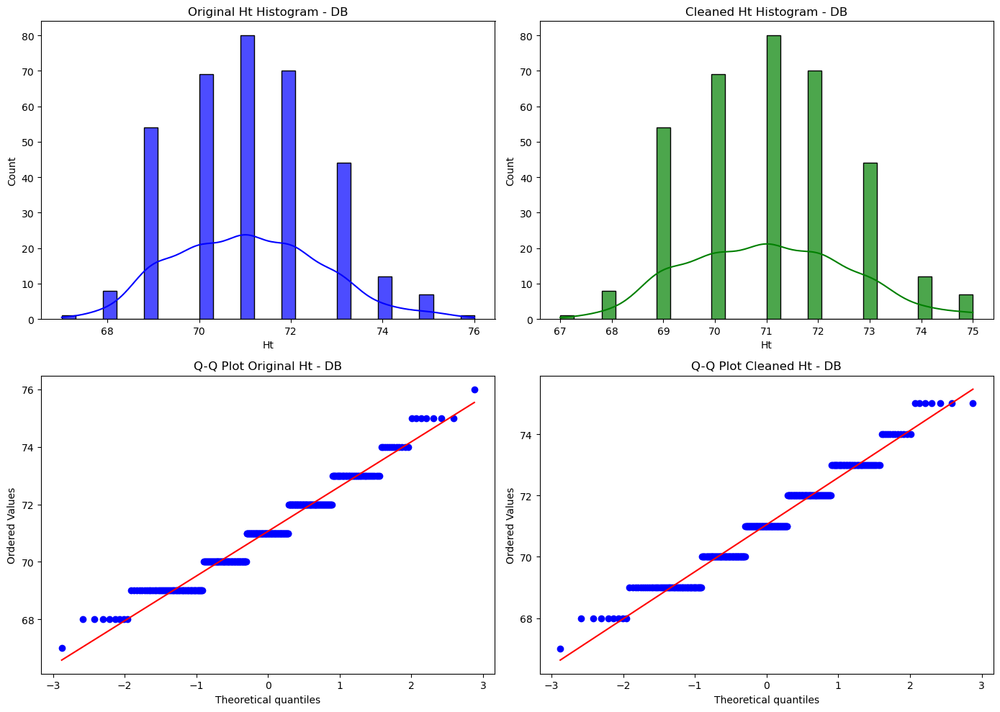

Ht - DB (Original): Mean=71.0636, Std Dev=1.5812
Ht - DB (Cleaned): Mean=71.0493, Std Dev=1.5609


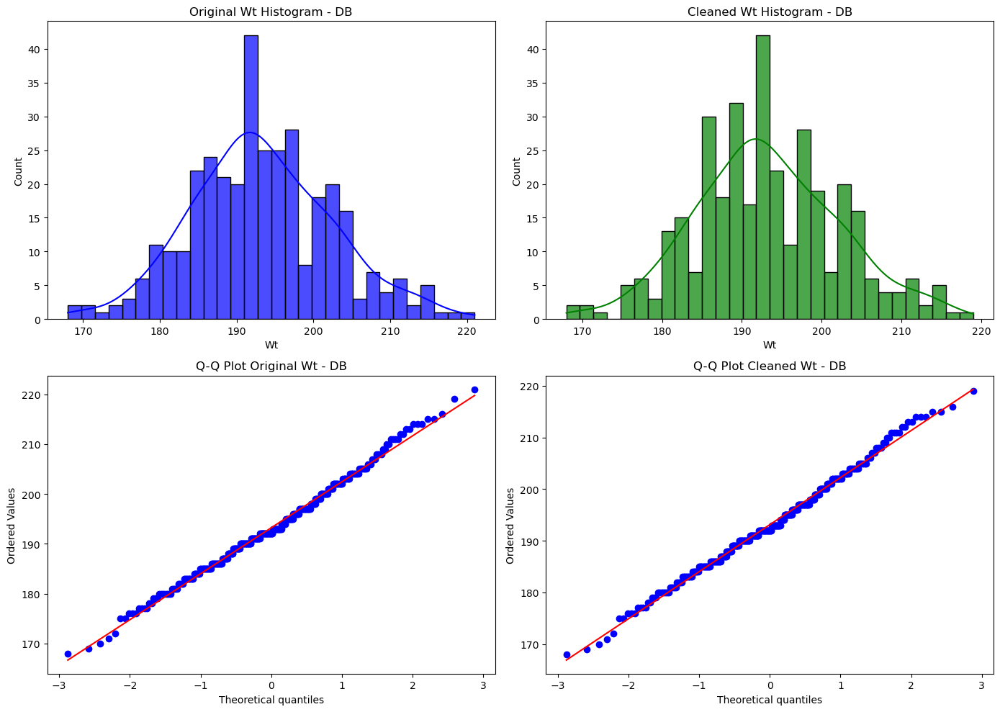

Wt - DB (Original): Mean=193.2052, Std Dev=9.1968
Wt - DB (Cleaned): Mean=193.1246, Std Dev=9.0871


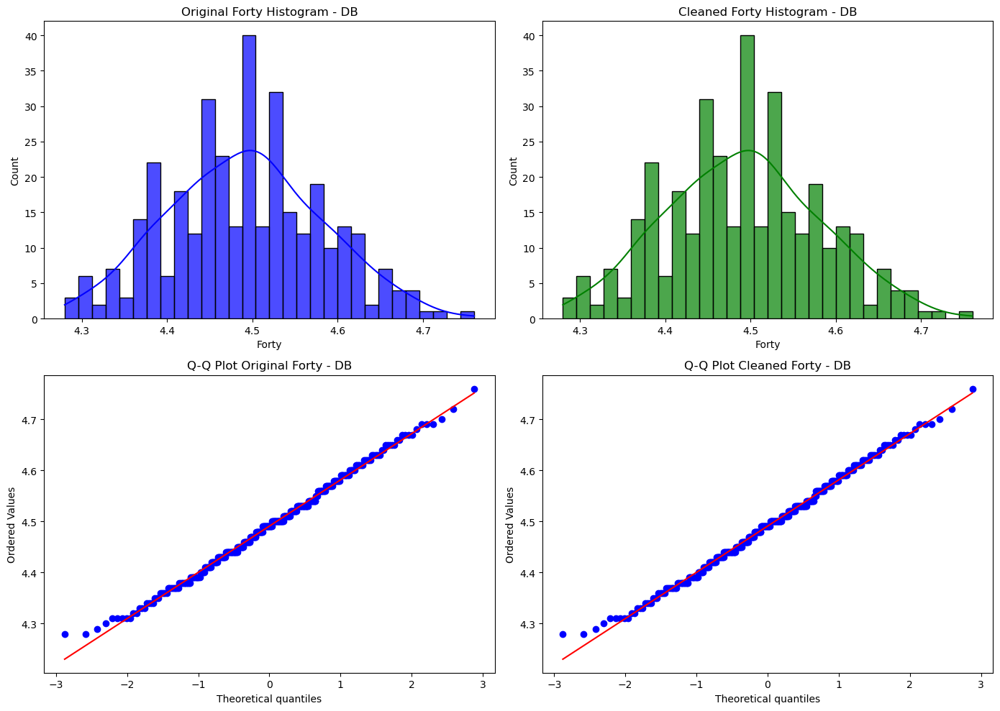

Forty - DB (Original): Mean=4.4909, Std Dev=0.0902
Forty - DB (Cleaned): Mean=4.4909, Std Dev=0.0902


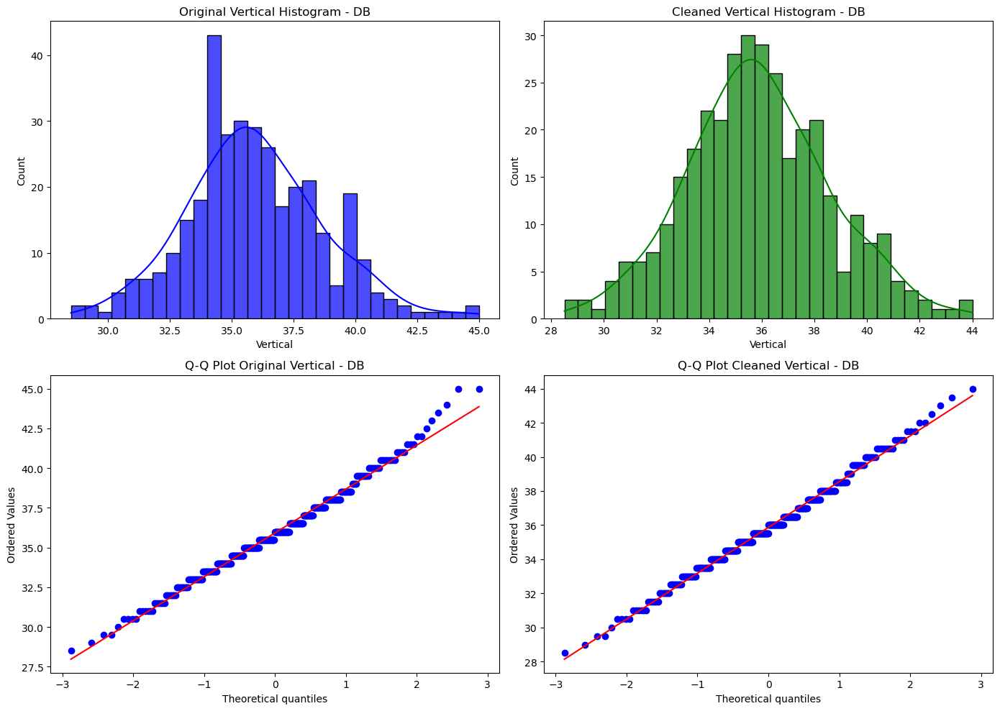

Vertical - DB (Original): Mean=35.9191, Std Dev=2.7603
Vertical - DB (Cleaned): Mean=35.8663, Std Dev=2.6796


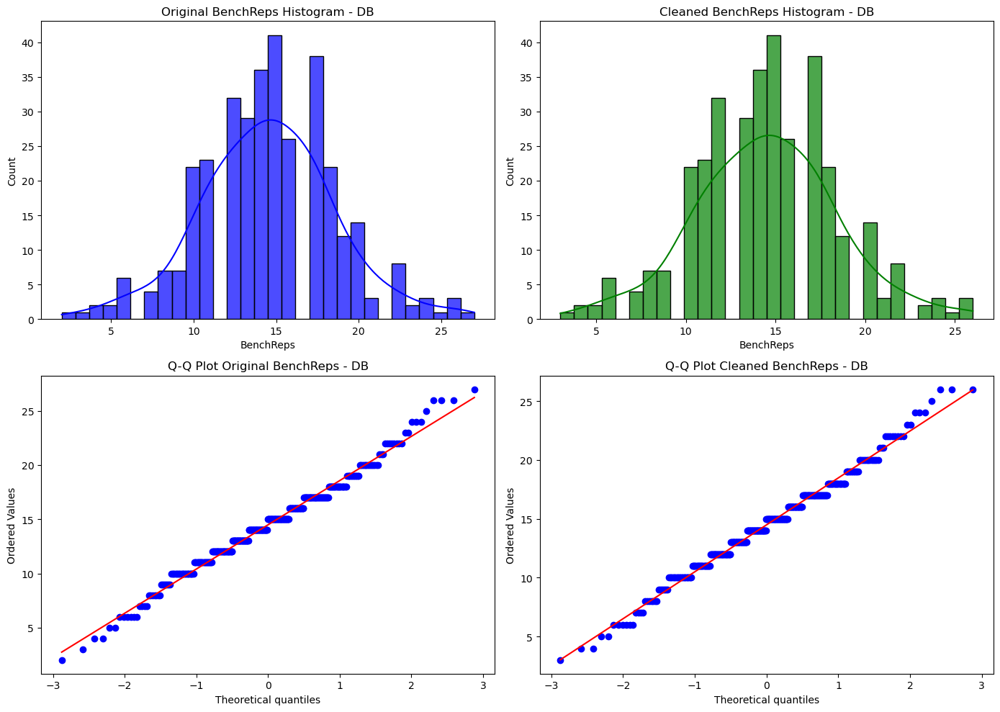

BenchReps - DB (Original): Mean=14.4855, Std Dev=4.0841
BenchReps - DB (Cleaned): Mean=14.4855, Std Dev=3.9832


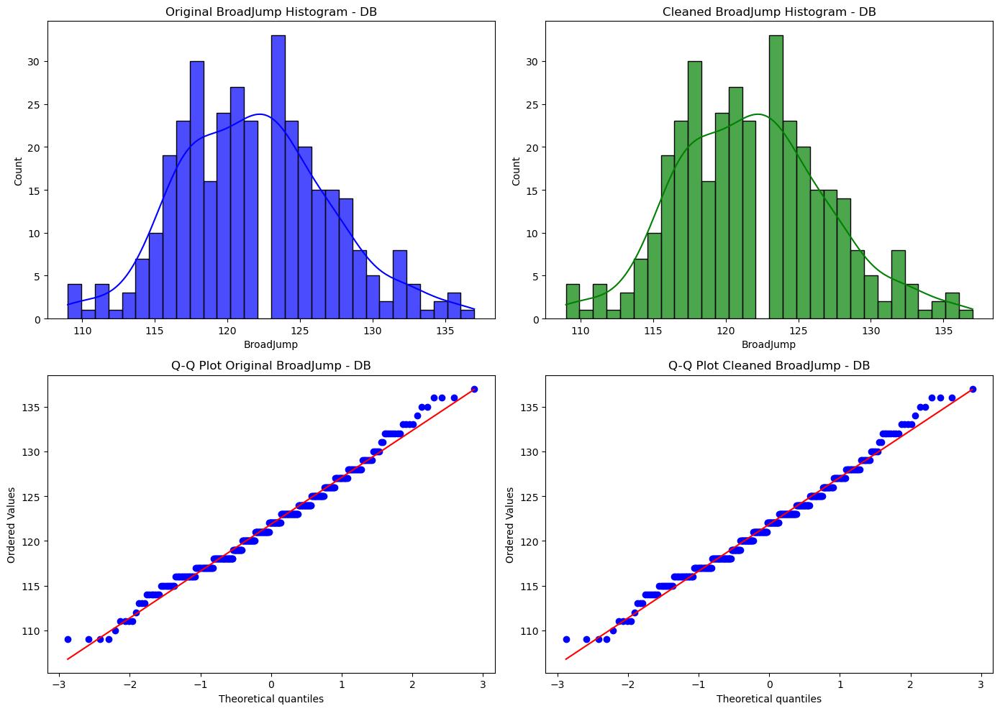

BroadJump - DB (Original): Mean=121.8497, Std Dev=5.2365
BroadJump - DB (Cleaned): Mean=121.8497, Std Dev=5.2365


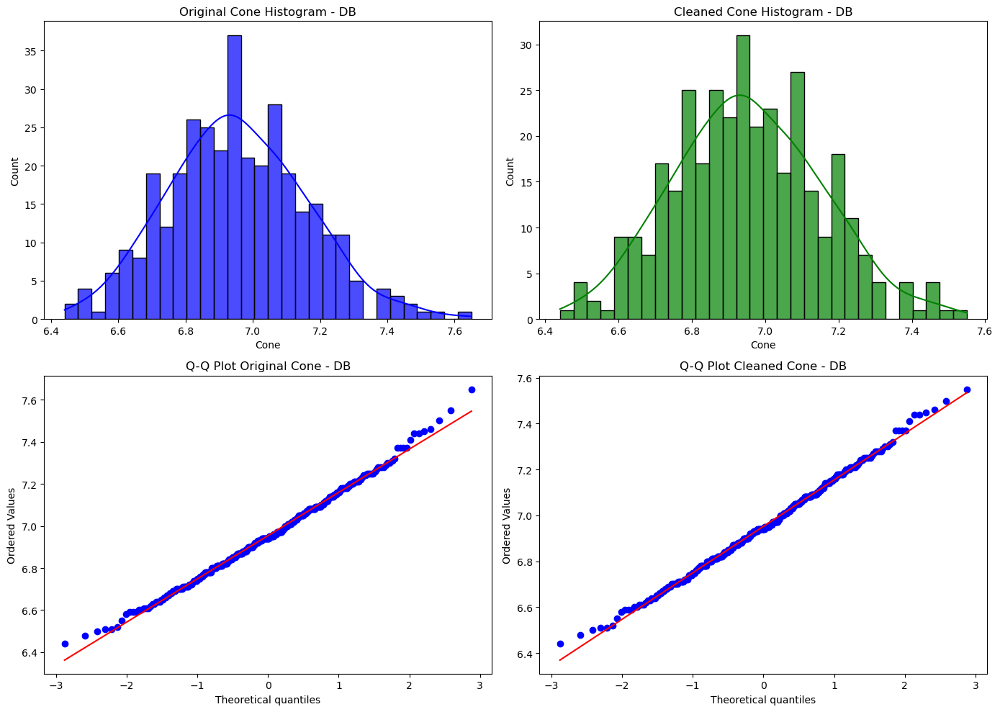

Cone - DB (Original): Mean=6.9541, Std Dev=0.2049
Cone - DB (Cleaned): Mean=6.9521, Std Dev=0.2018


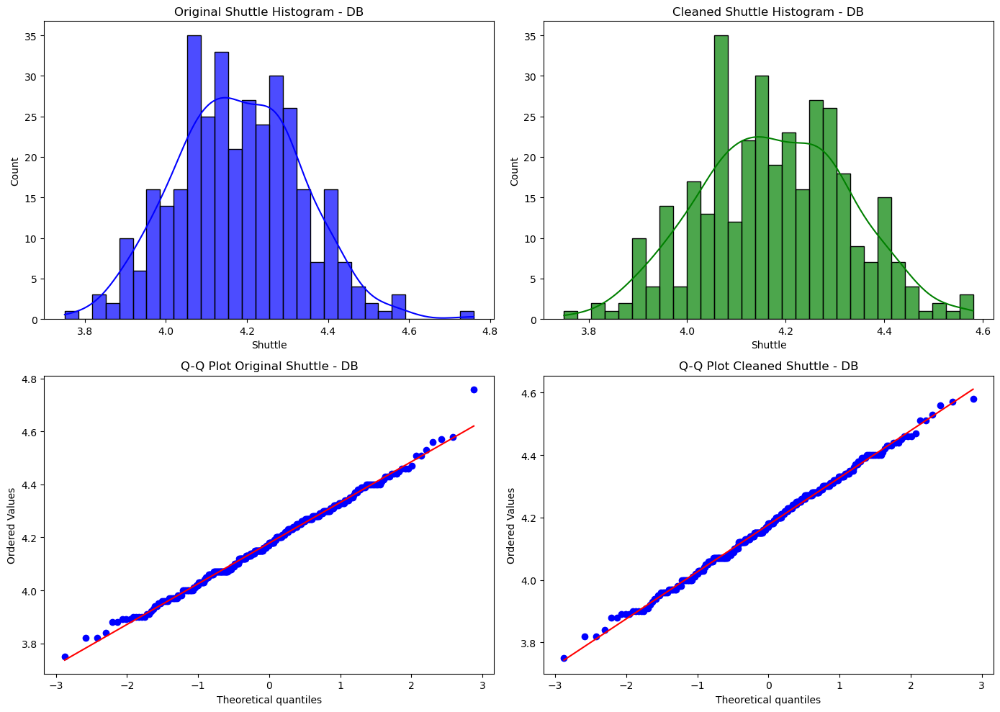

Shuttle - DB (Original): Mean=4.1787, Std Dev=0.1532
Shuttle - DB (Cleaned): Mean=4.1770, Std Dev=0.1502


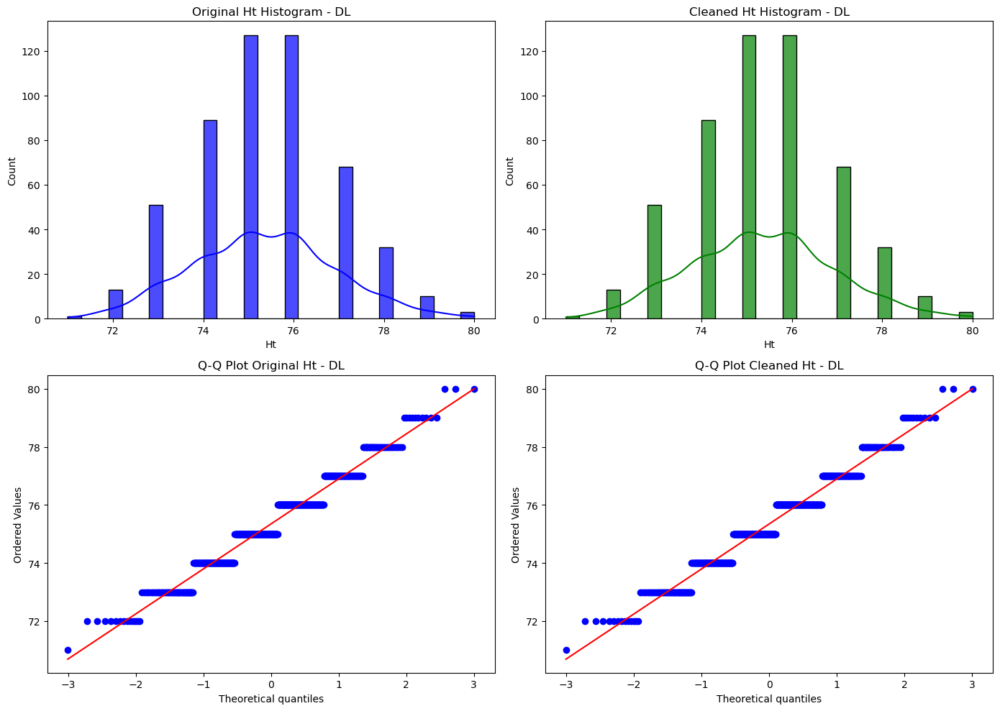

Ht - DL (Original): Mean=75.3455, Std Dev=1.5725
Ht - DL (Cleaned): Mean=75.3455, Std Dev=1.5725


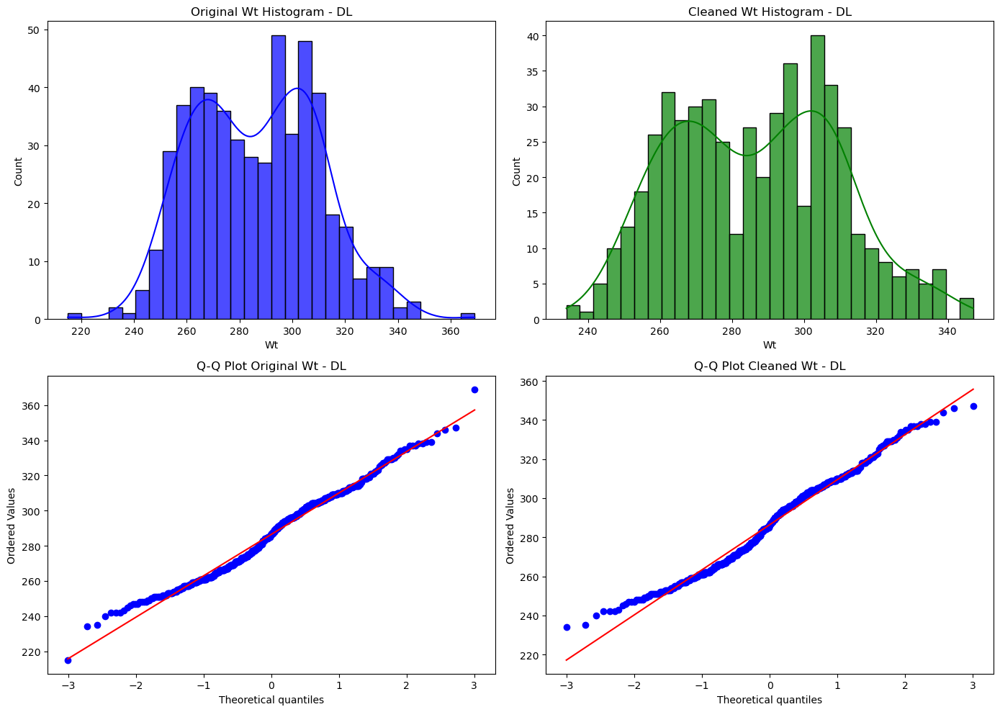

Wt - DL (Original): Mean=286.4491, Std Dev=23.6278
Wt - DL (Cleaned): Mean=286.4277, Std Dev=23.1822


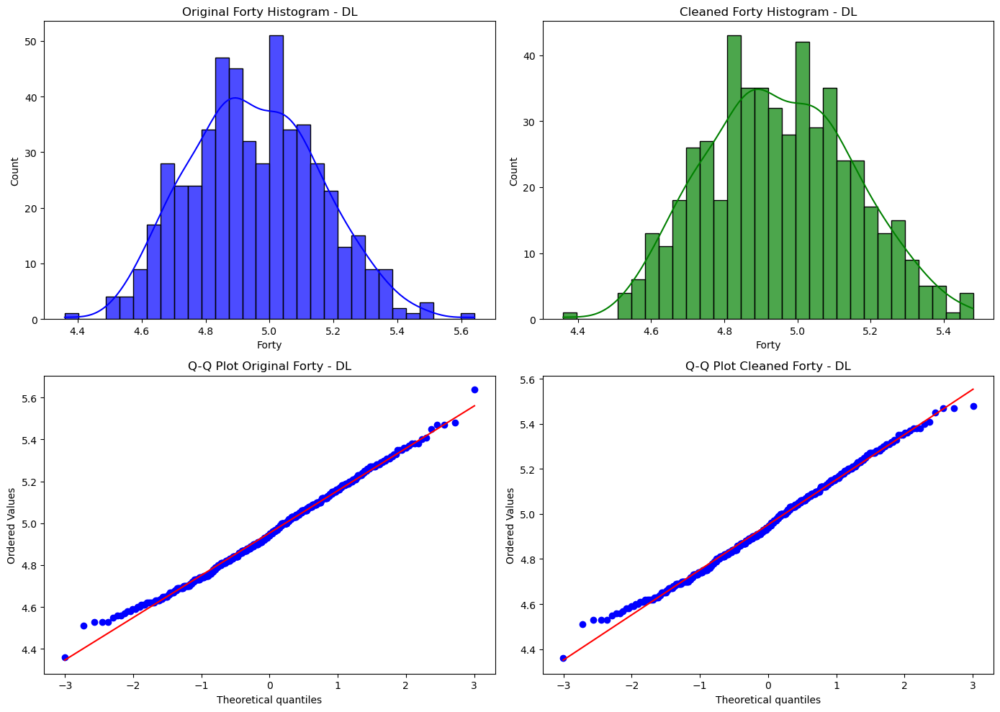

Forty - DL (Original): Mean=4.9537, Std Dev=0.2018
Forty - DL (Cleaned): Mean=4.9524, Std Dev=0.1997


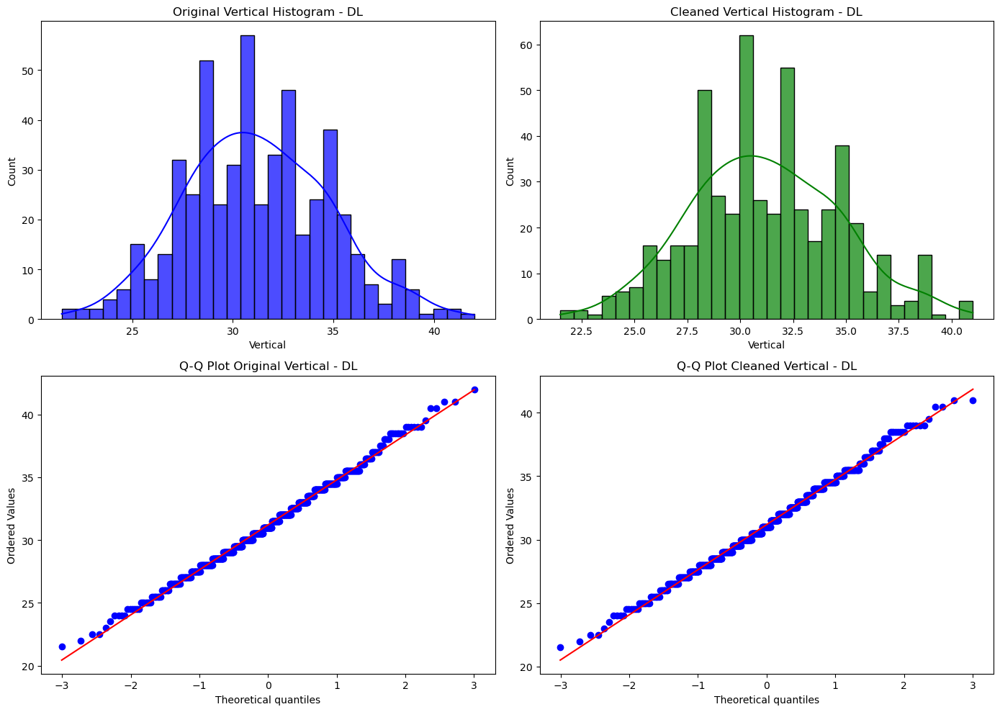

Vertical - DL (Original): Mean=31.1996, Std Dev=3.5755
Vertical - DL (Cleaned): Mean=31.1788, Std Dev=3.5473


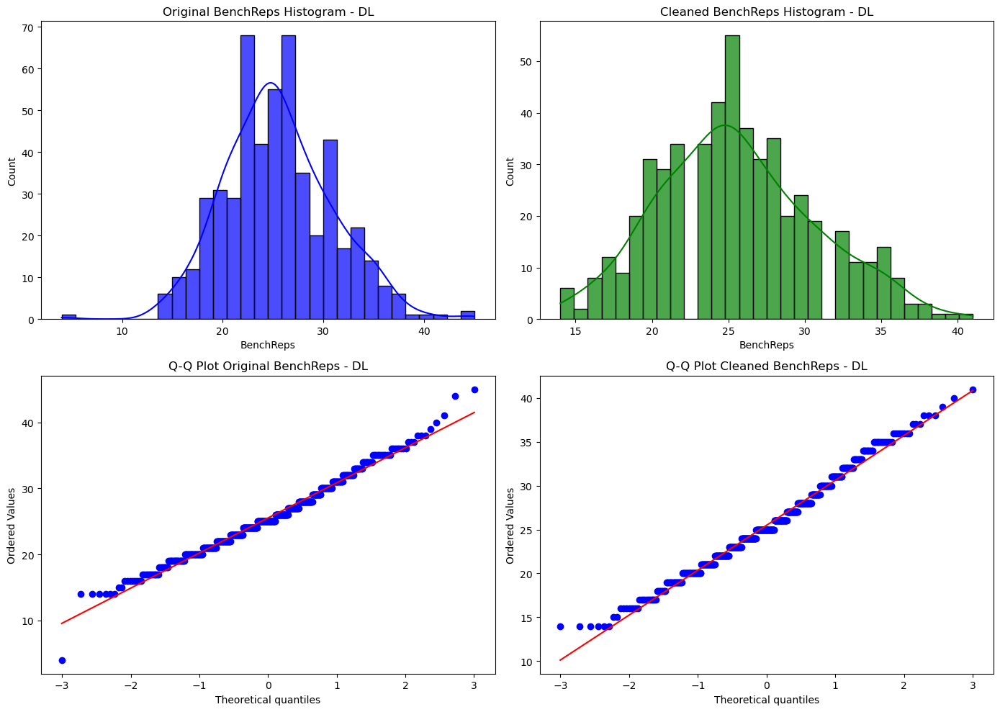

BenchReps - DL (Original): Mean=25.5182, Std Dev=5.3313
BenchReps - DL (Cleaned): Mean=25.4865, Std Dev=5.1280


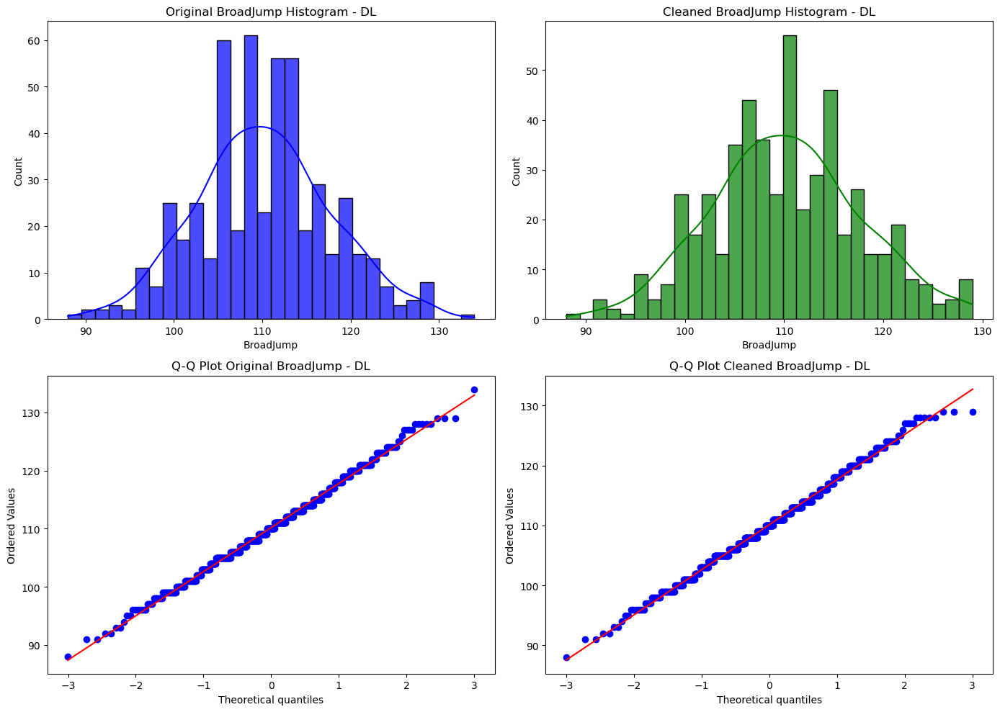

BroadJump - DL (Original): Mean=110.1843, Std Dev=7.5712
BroadJump - DL (Cleaned): Mean=110.1385, Std Dev=7.5059


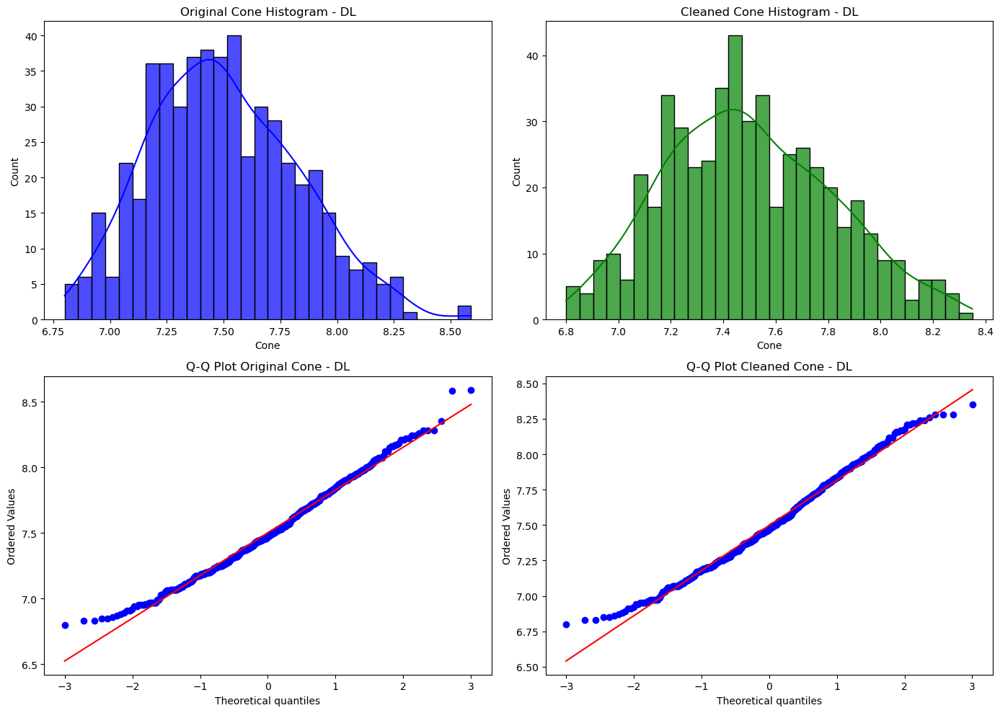

Cone - DL (Original): Mean=7.5018, Std Dev=0.3255
Cone - DL (Cleaned): Mean=7.4976, Std Dev=0.3191


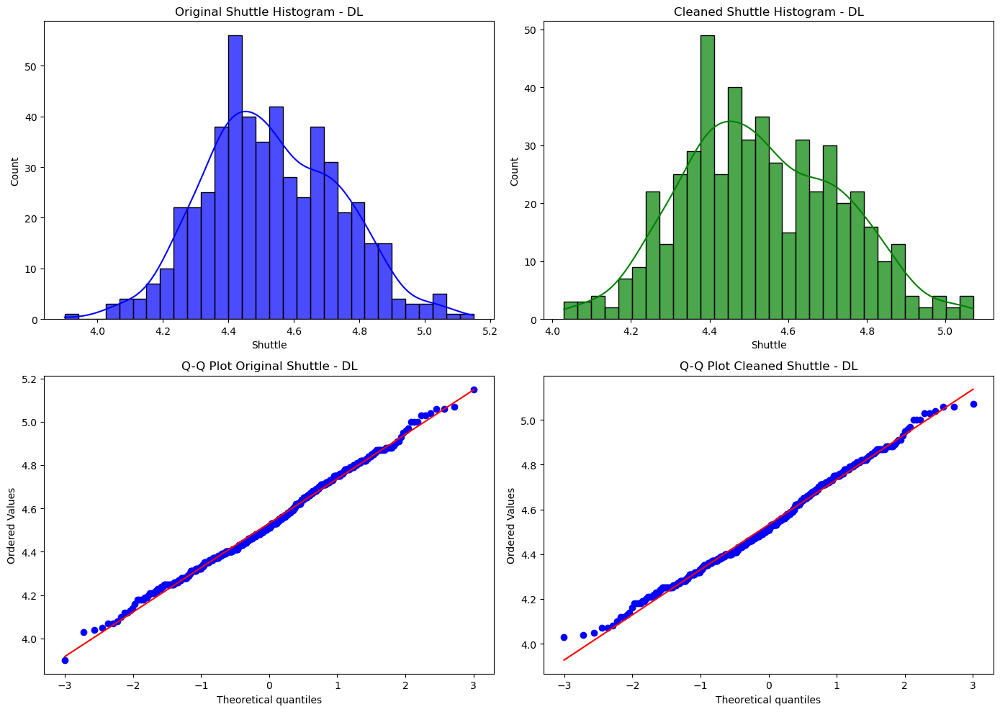

Shuttle - DL (Original): Mean=4.5317, Std Dev=0.2047
Shuttle - DL (Cleaned): Mean=4.5317, Std Dev=0.2013


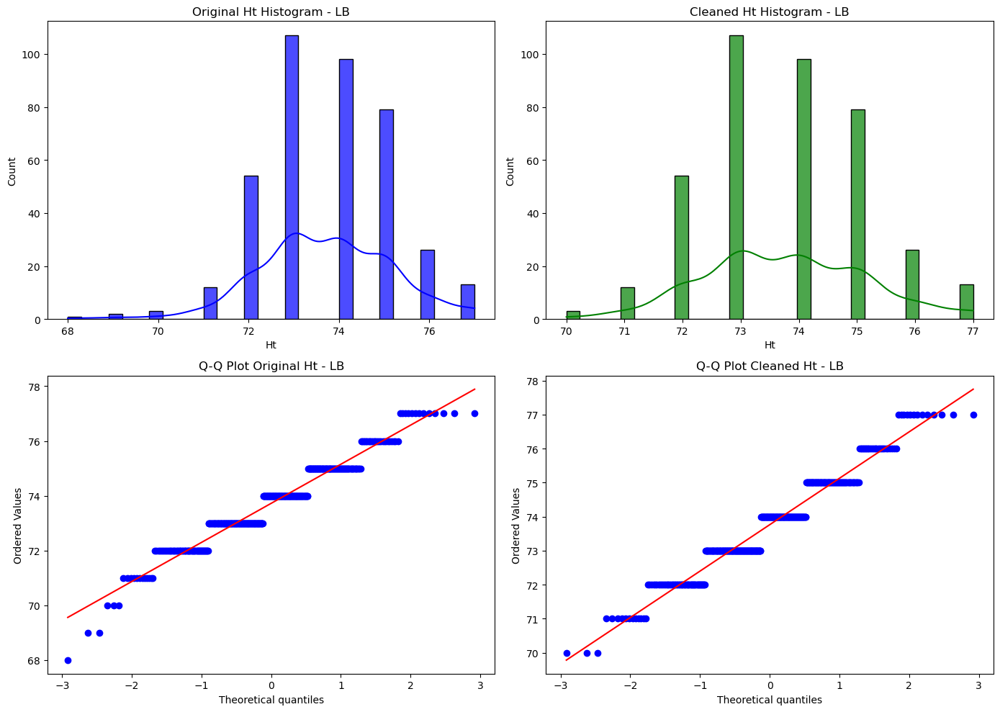

Ht - LB (Original): Mean=73.7241, Std Dev=1.4557
Ht - LB (Cleaned): Mean=73.7628, Std Dev=1.3914


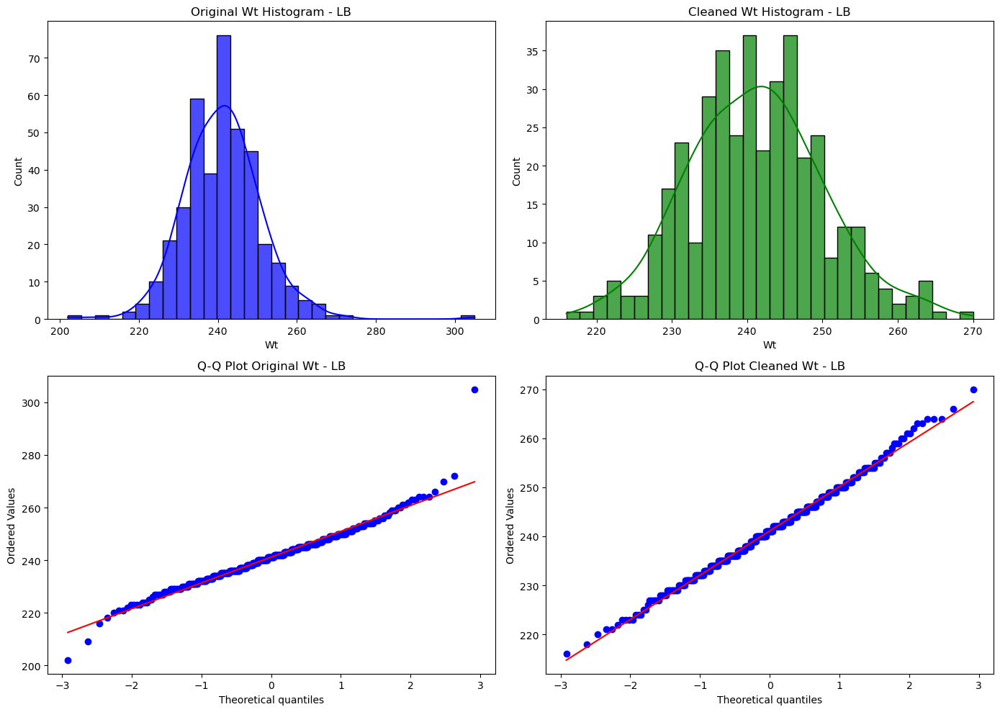

Wt - LB (Original): Mean=241.1671, Std Dev=9.9795
Wt - LB (Cleaned): Mean=241.1074, Std Dev=9.0076


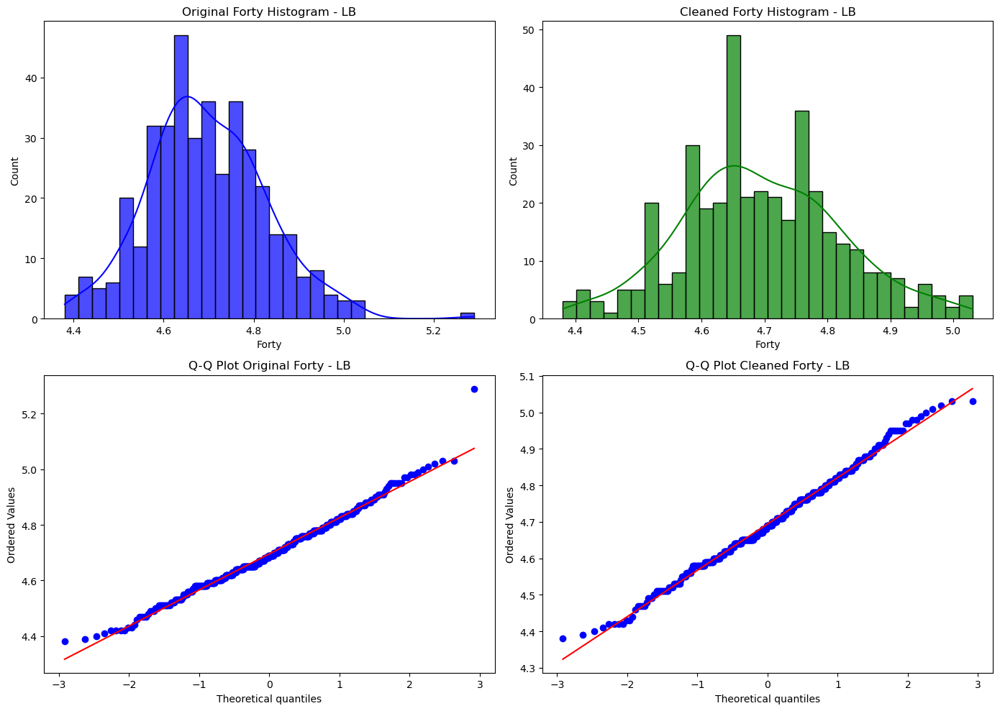

Forty - LB (Original): Mean=4.6959, Std Dev=0.1300
Forty - LB (Cleaned): Mean=4.6944, Std Dev=0.1267


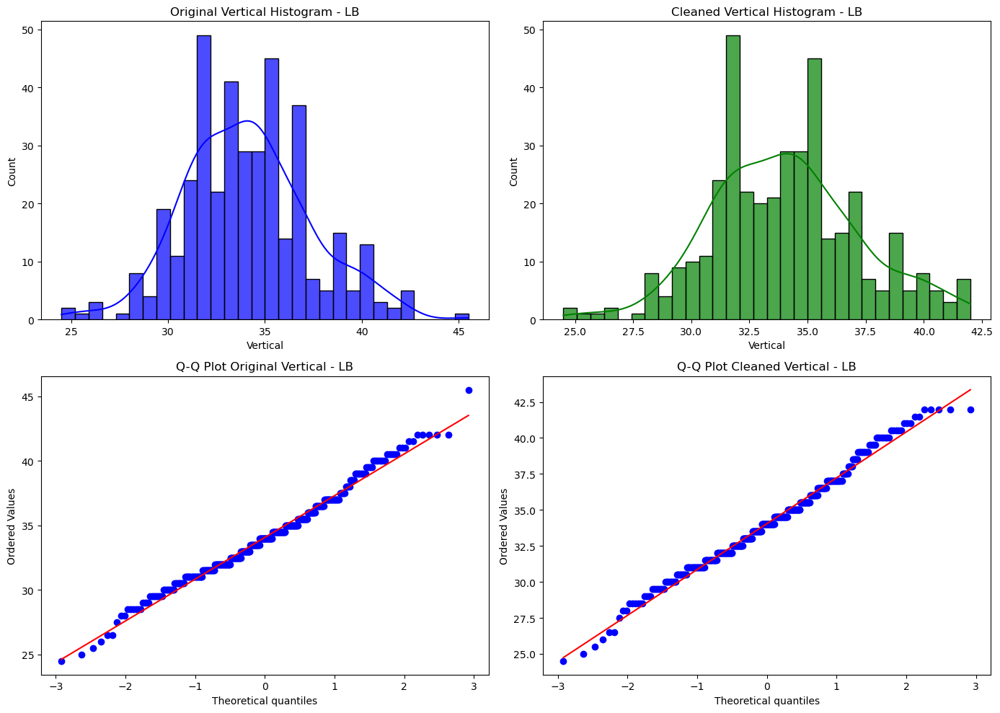

Vertical - LB (Original): Mean=34.0734, Std Dev=3.2358
Vertical - LB (Cleaned): Mean=34.0444, Std Dev=3.1881


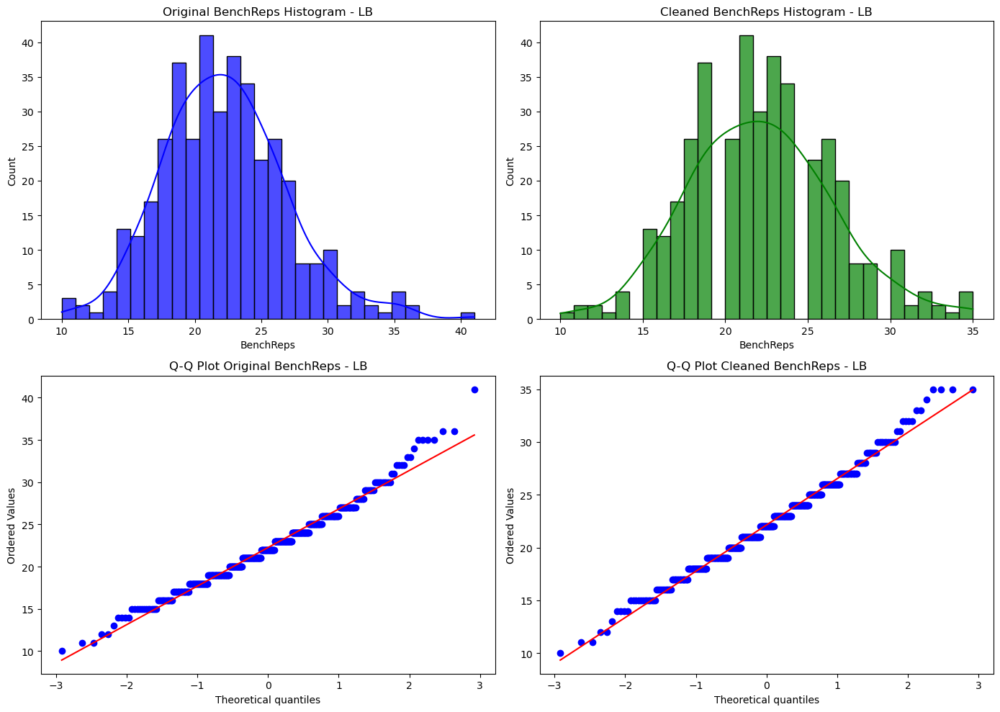

BenchReps - LB (Original): Mean=22.2608, Std Dev=4.5837
BenchReps - LB (Cleaned): Mean=22.1429, Std Dev=4.3925


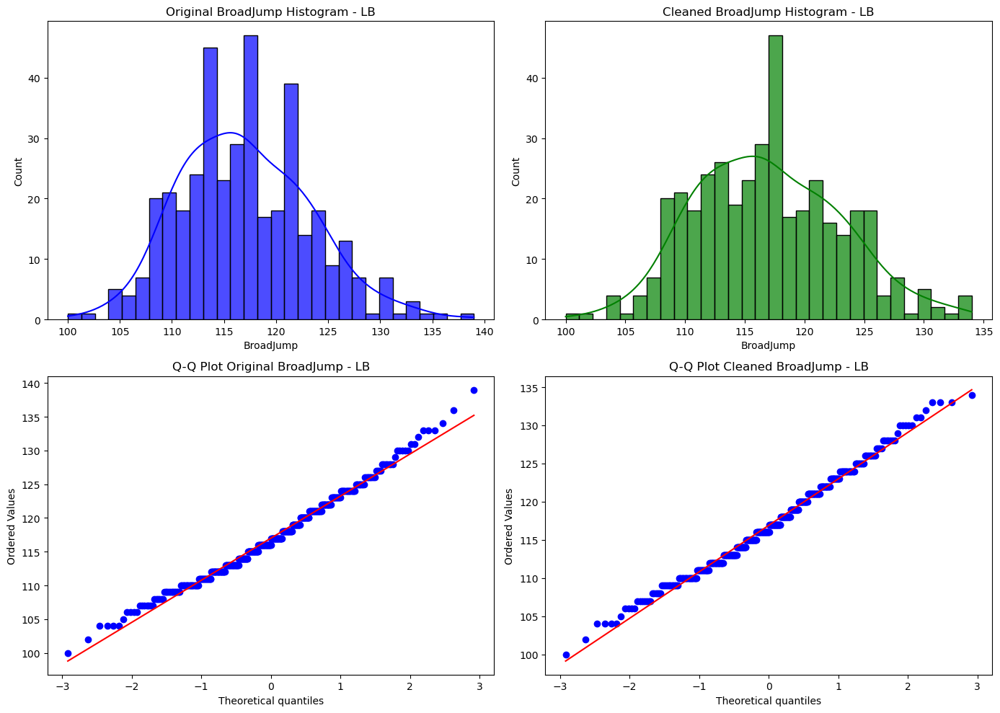

BroadJump - LB (Original): Mean=117.0025, Std Dev=6.2419
BroadJump - LB (Cleaned): Mean=116.8982, Std Dev=6.0823


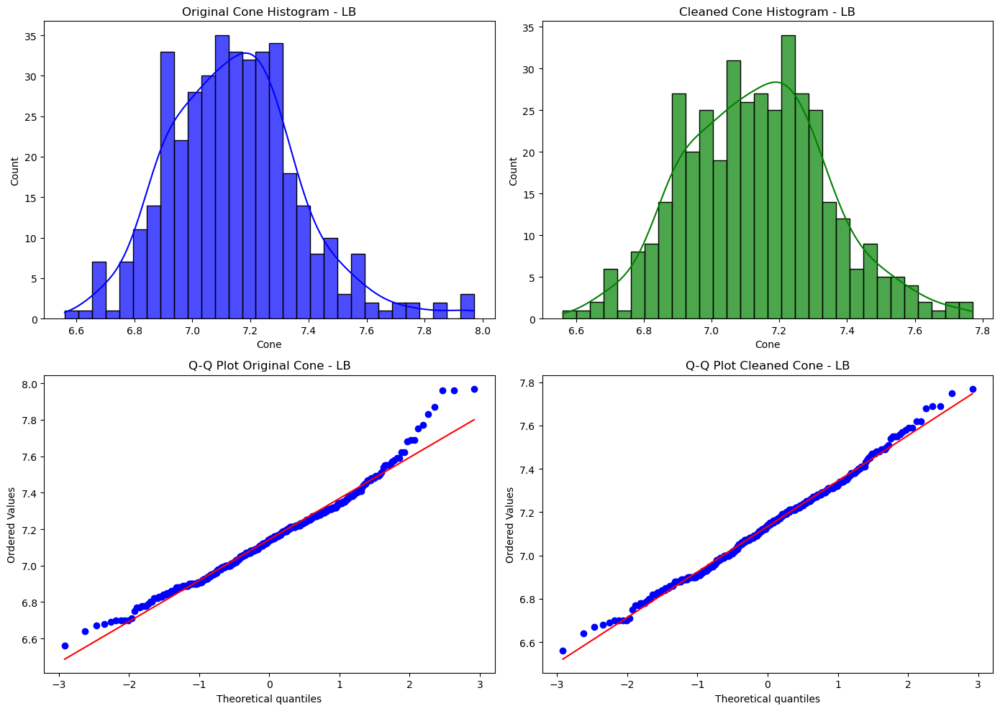

Cone - LB (Original): Mean=7.1435, Std Dev=0.2262
Cone - LB (Cleaned): Mean=7.1336, Std Dev=0.2097


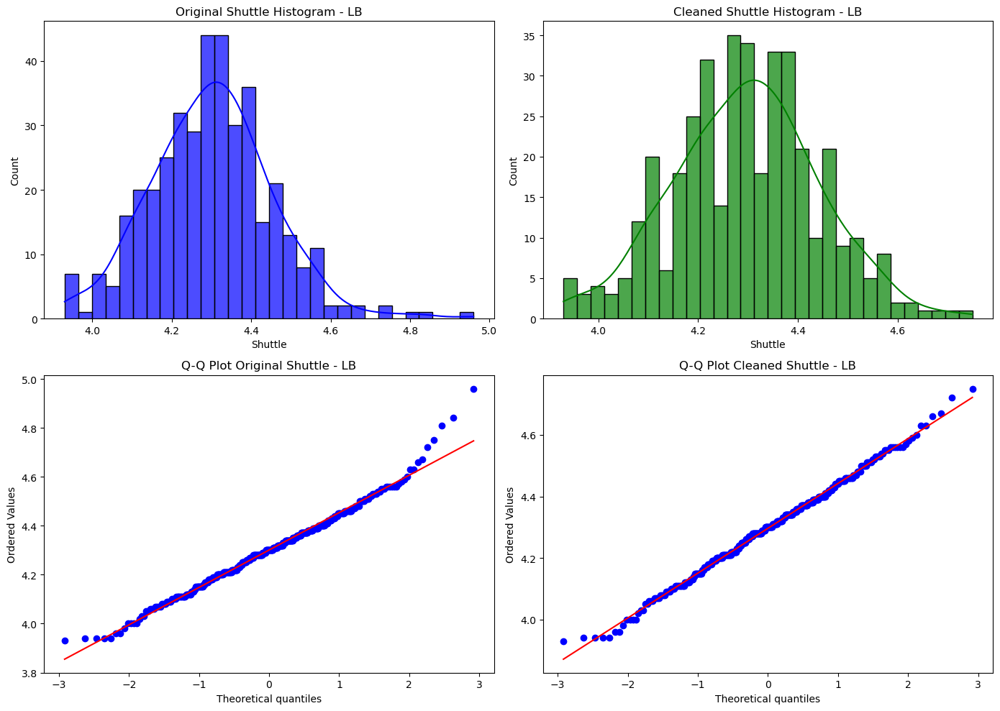

Shuttle - LB (Original): Mean=4.3007, Std Dev=0.1531
Shuttle - LB (Cleaned): Mean=4.2964, Std Dev=0.1452


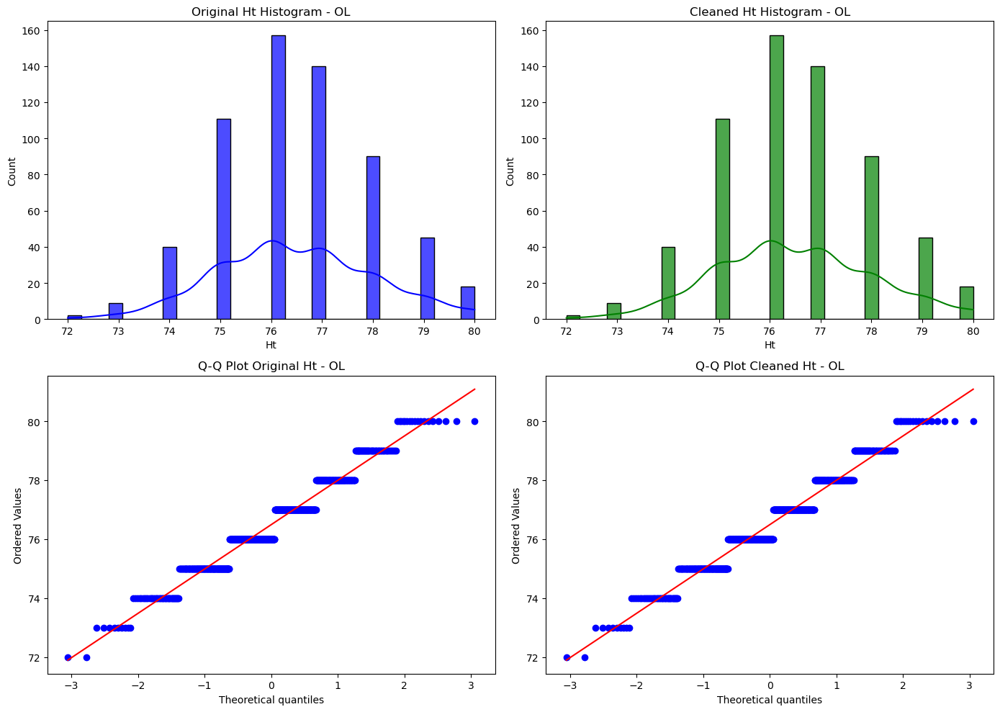

Ht - OL (Original): Mean=76.4918, Std Dev=1.5293
Ht - OL (Cleaned): Mean=76.4918, Std Dev=1.5293


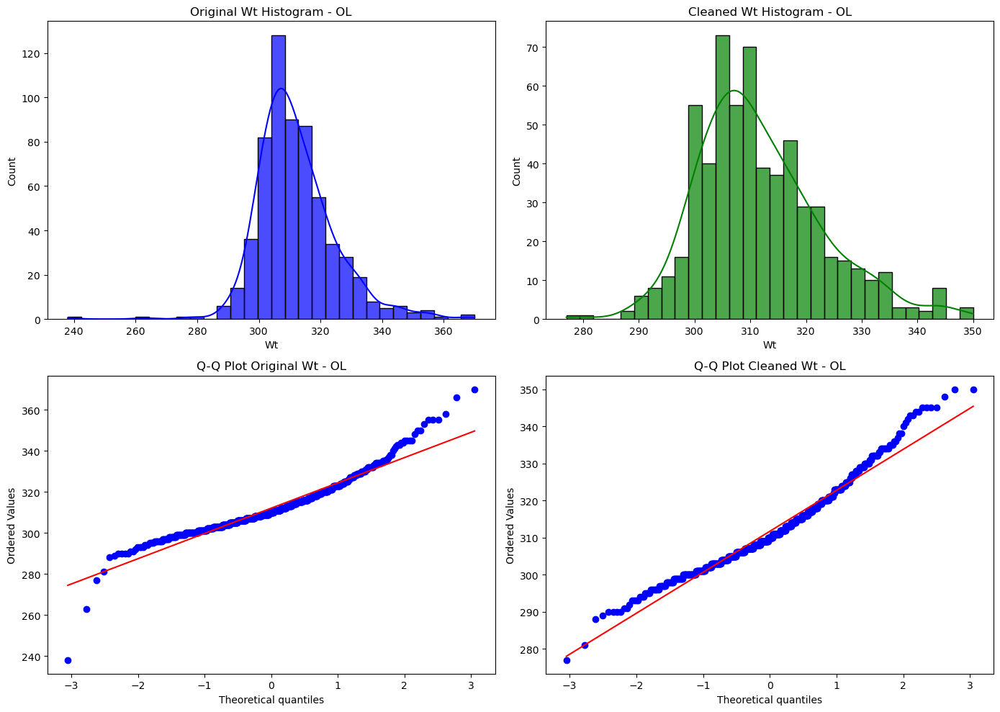

Wt - OL (Original): Mean=312.0507, Std Dev=12.7290
Wt - OL (Cleaned): Mean=311.7114, Std Dev=11.1952


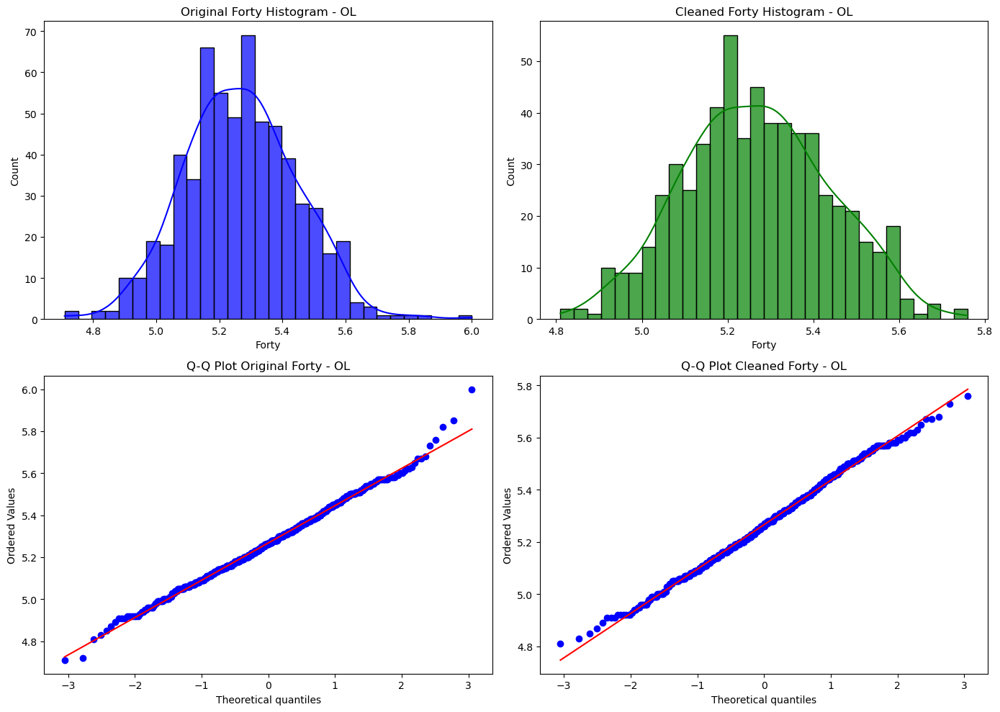

Forty - OL (Original): Mean=5.2677, Std Dev=0.1775
Forty - OL (Cleaned): Mean=5.2664, Std Dev=0.1697


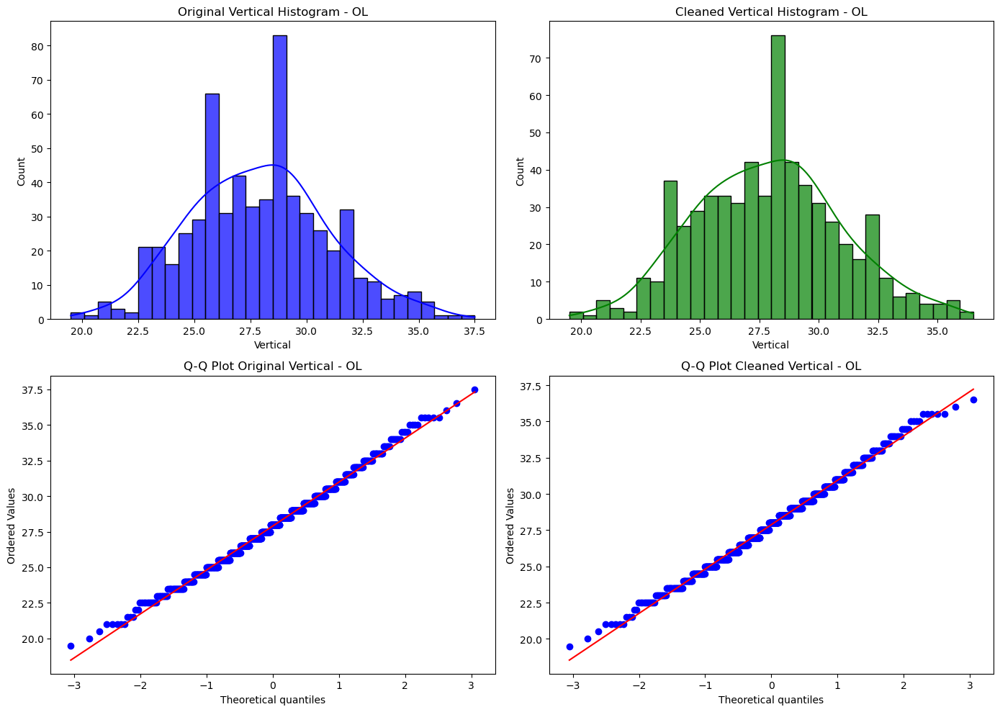

Vertical - OL (Original): Mean=27.8979, Std Dev=3.0798
Vertical - OL (Cleaned): Mean=27.8822, Std Dev=3.0576


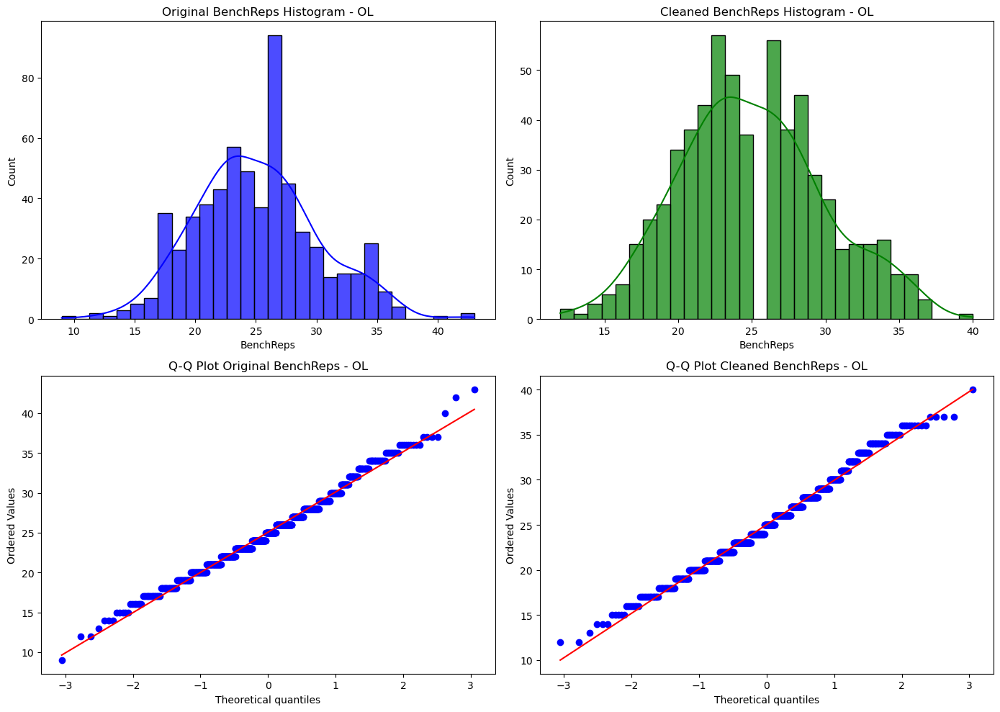

BenchReps - OL (Original): Mean=25.0507, Std Dev=5.0580
BenchReps - OL (Cleaned): Mean=25.0197, Std Dev=4.9277


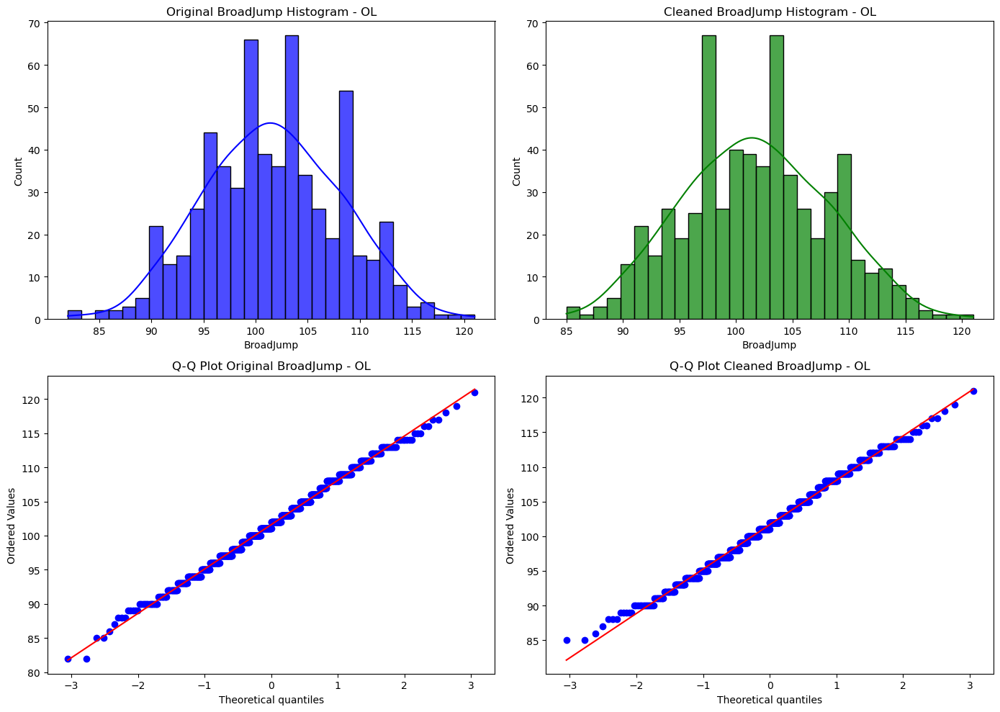

BroadJump - OL (Original): Mean=101.6013, Std Dev=6.4806
BroadJump - OL (Cleaned): Mean=101.6656, Std Dev=6.3930


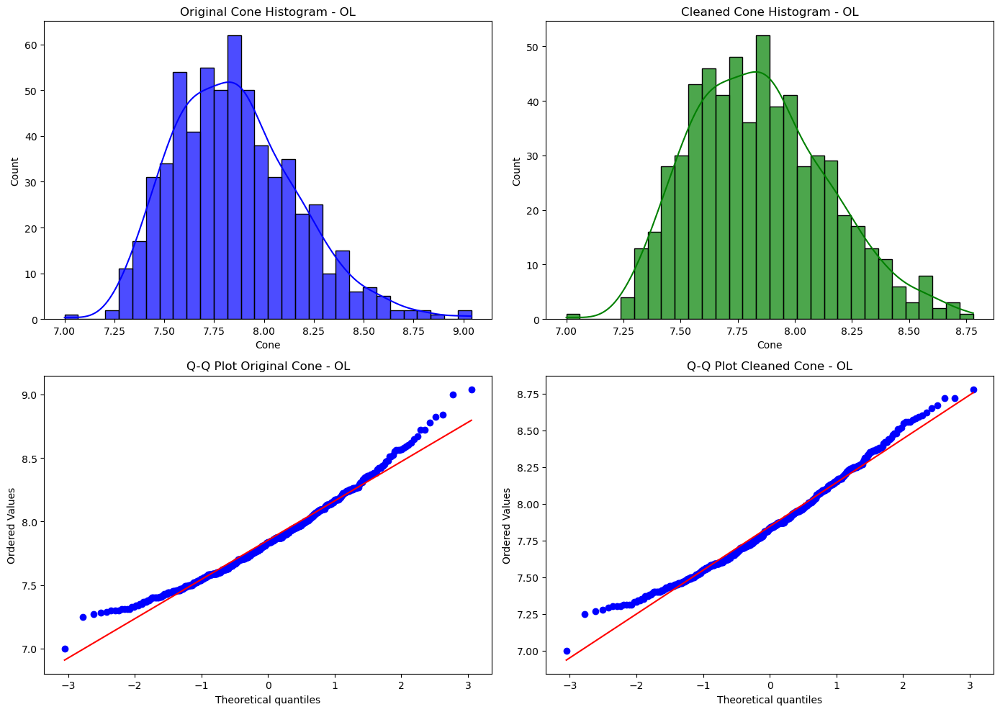

Cone - OL (Original): Mean=7.8526, Std Dev=0.3112
Cone - OL (Cleaned): Mean=7.8455, Std Dev=0.2997


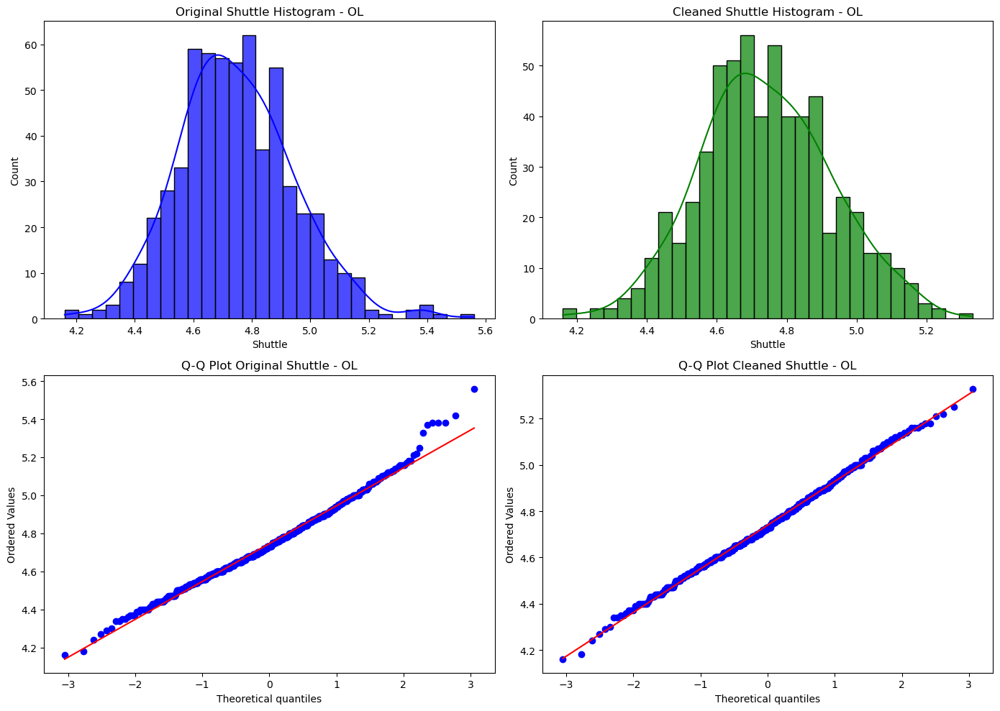

Shuttle - OL (Original): Mean=4.7463, Std Dev=0.1992
Shuttle - OL (Cleaned): Mean=4.7397, Std Dev=0.1885


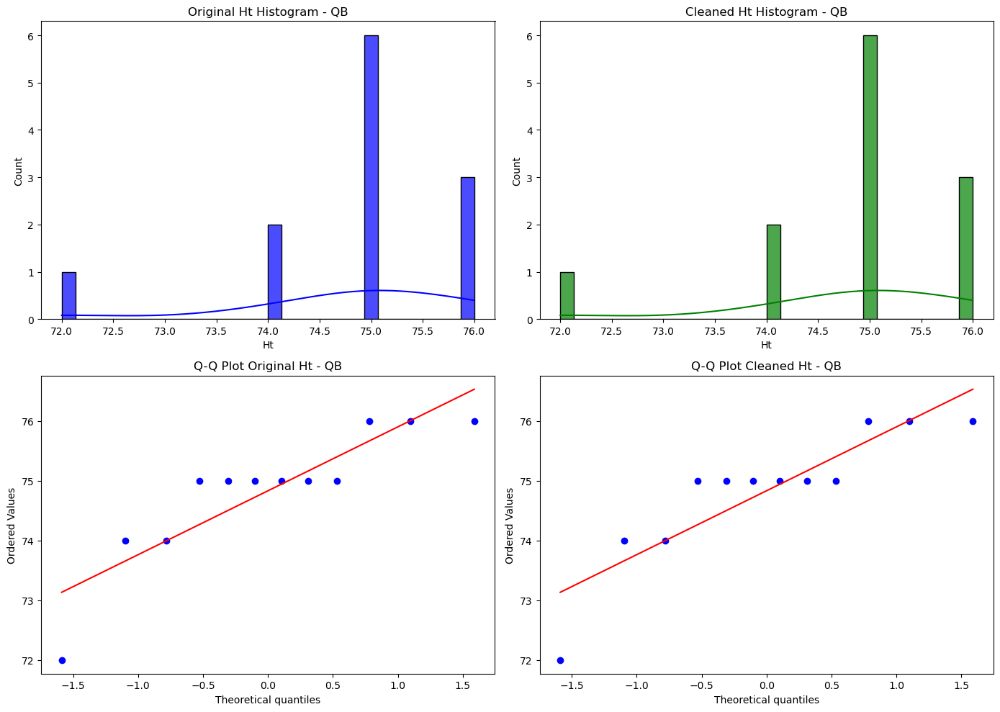

Ht - QB (Original): Mean=74.8333, Std Dev=1.1146
Ht - QB (Cleaned): Mean=74.8333, Std Dev=1.1146


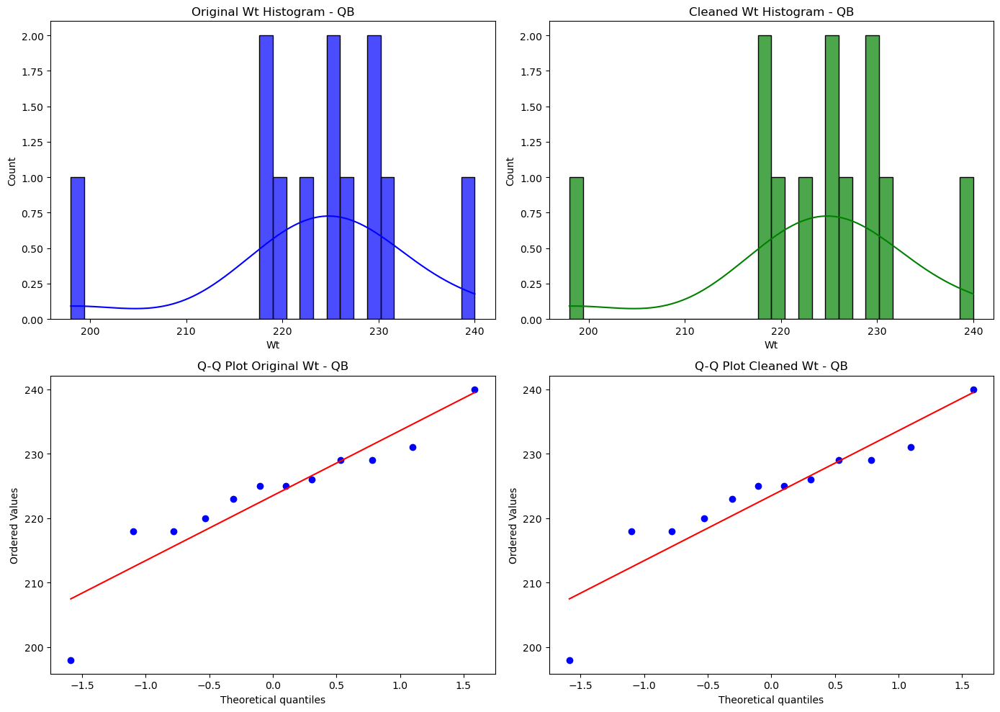

Wt - QB (Original): Mean=223.5000, Std Dev=10.1040
Wt - QB (Cleaned): Mean=223.5000, Std Dev=10.1040


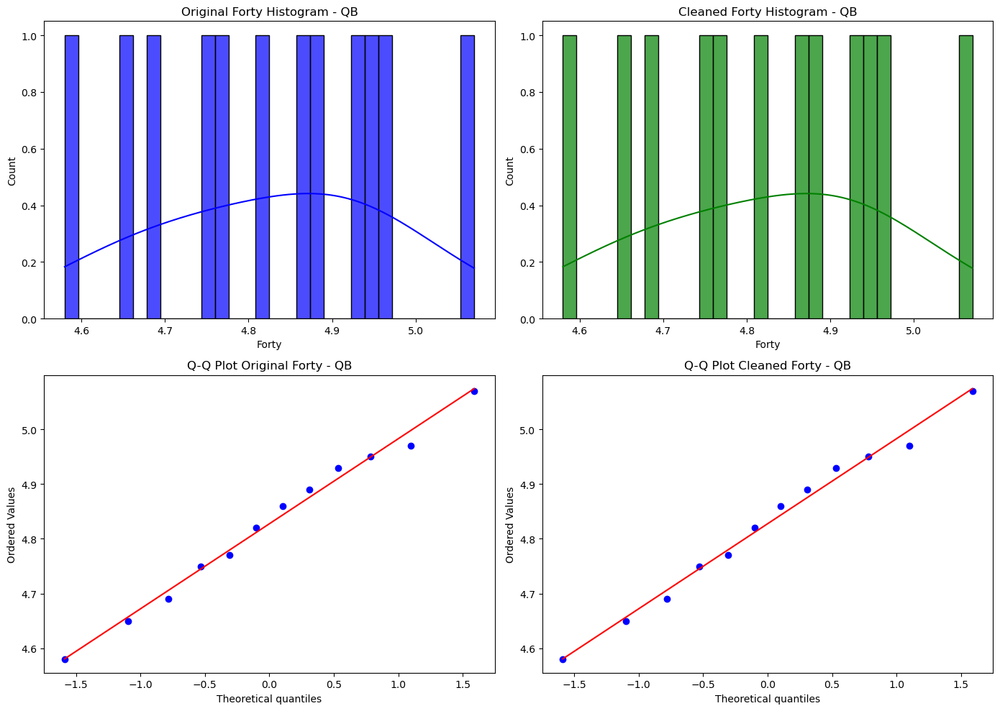

Forty - QB (Original): Mean=4.8275, Std Dev=0.1448
Forty - QB (Cleaned): Mean=4.8275, Std Dev=0.1448


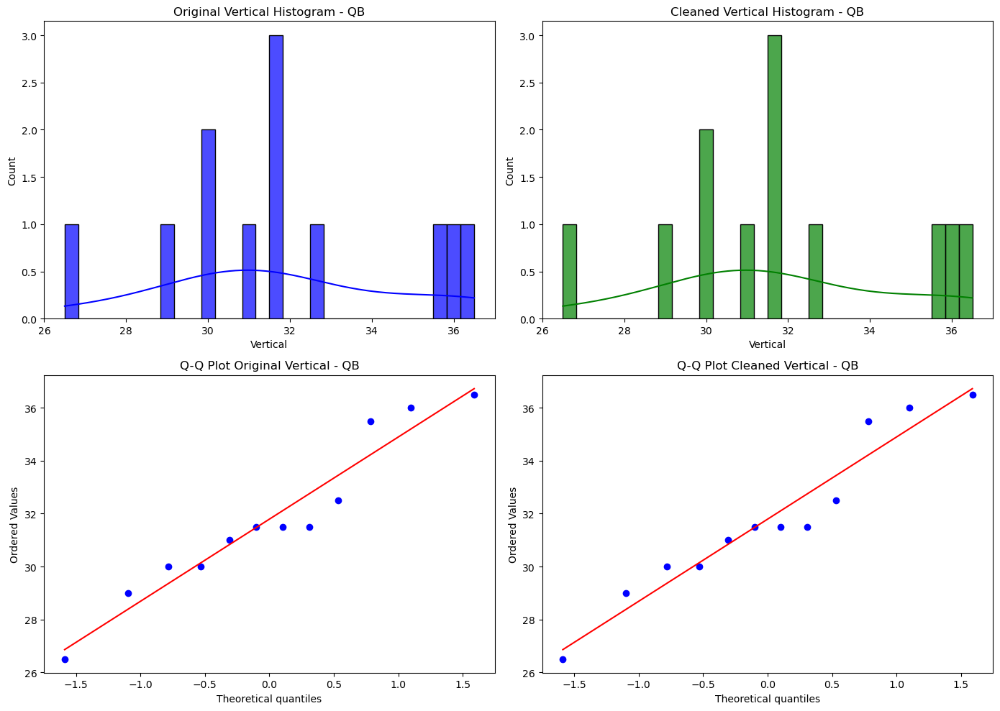

Vertical - QB (Original): Mean=31.7917, Std Dev=2.9730
Vertical - QB (Cleaned): Mean=31.7917, Std Dev=2.9730


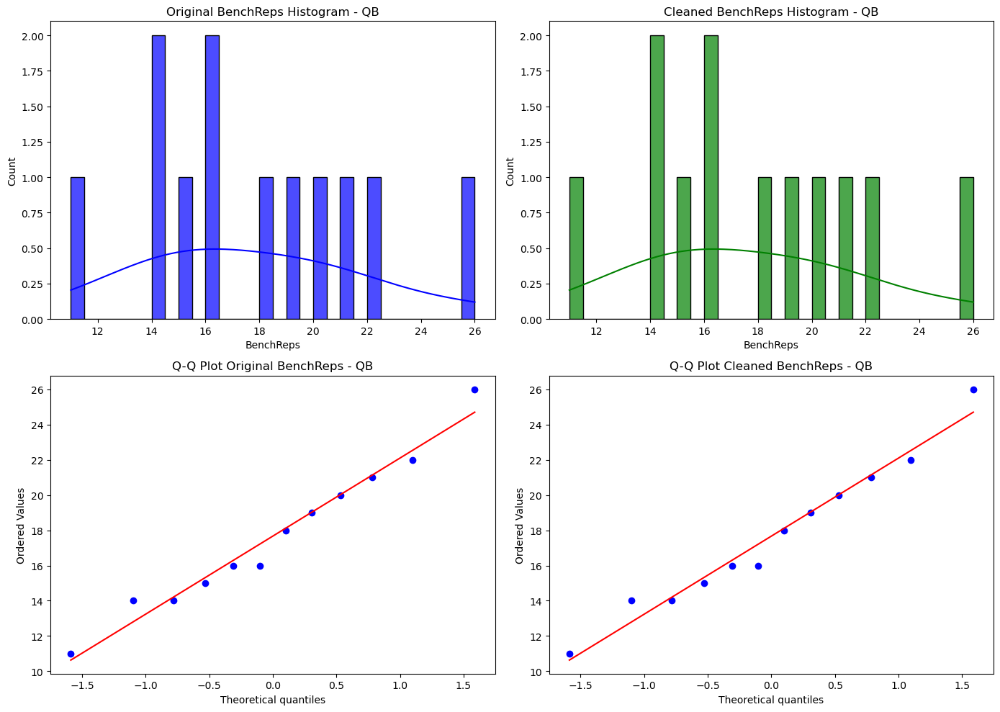

BenchReps - QB (Original): Mean=17.6667, Std Dev=4.1633
BenchReps - QB (Cleaned): Mean=17.6667, Std Dev=4.1633


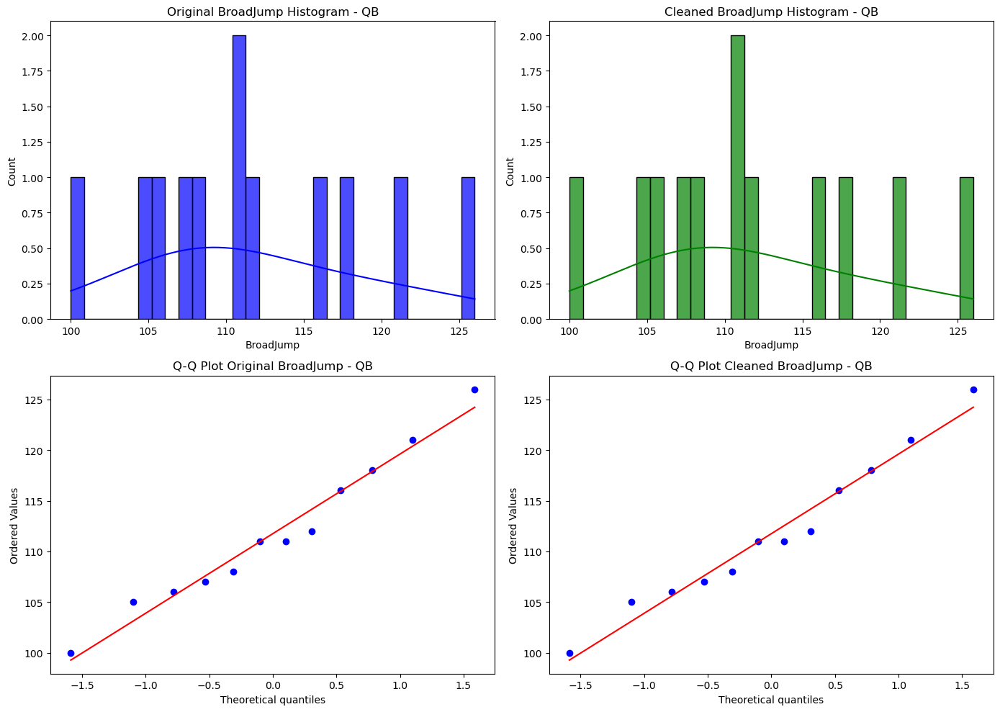

BroadJump - QB (Original): Mean=111.7500, Std Dev=7.3870
BroadJump - QB (Cleaned): Mean=111.7500, Std Dev=7.3870


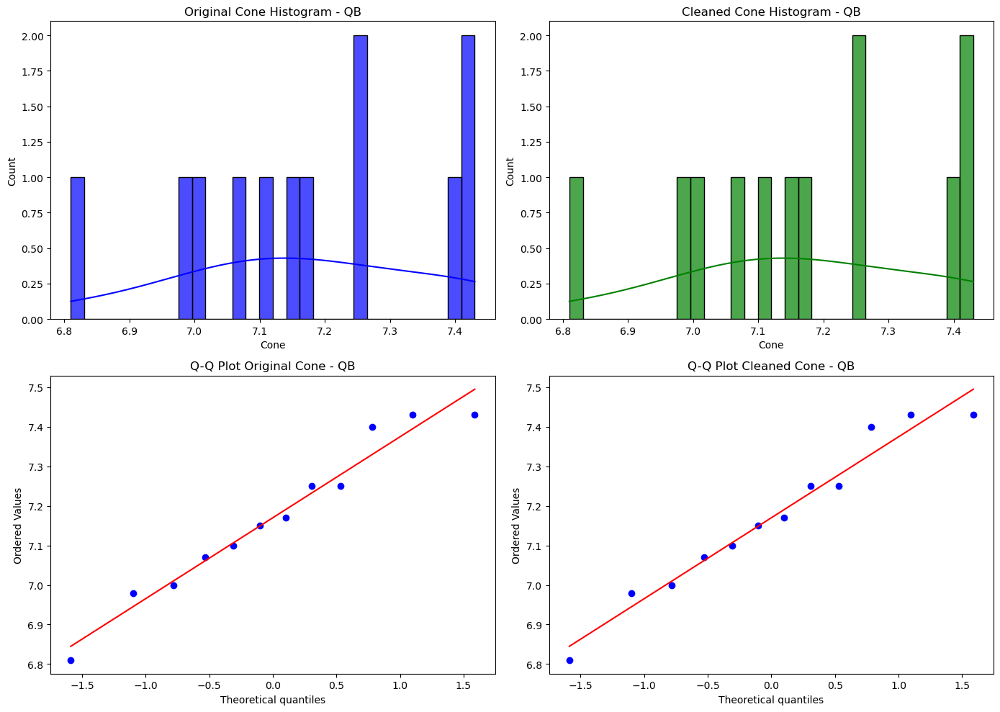

Cone - QB (Original): Mean=7.1700, Std Dev=0.1932
Cone - QB (Cleaned): Mean=7.1700, Std Dev=0.1932


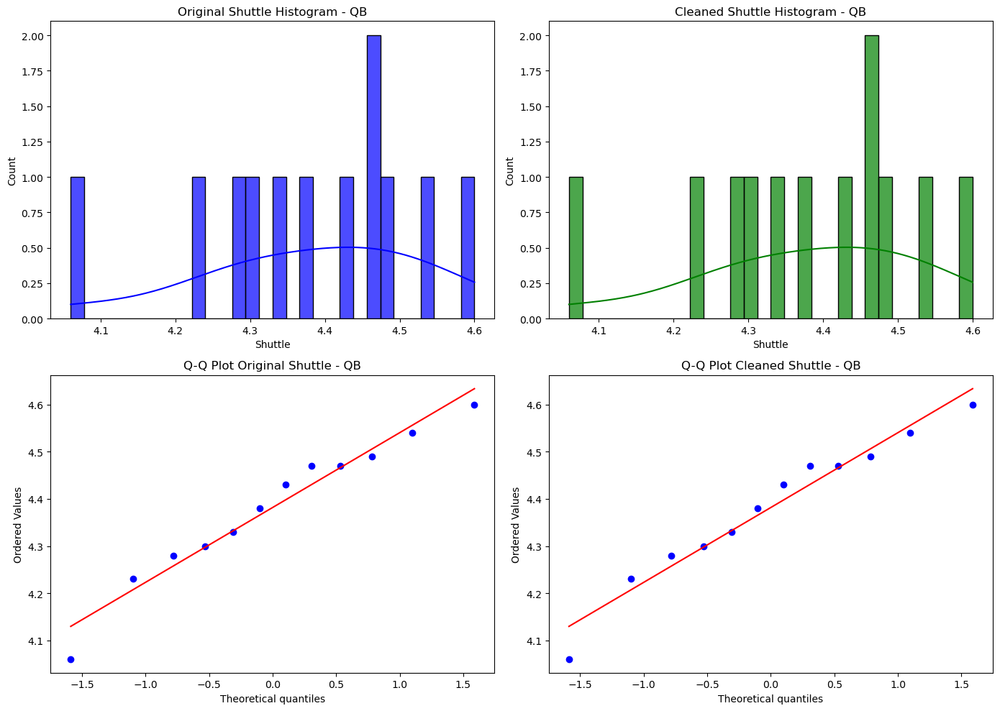

Shuttle - QB (Original): Mean=4.3817, Std Dev=0.1503
Shuttle - QB (Cleaned): Mean=4.3817, Std Dev=0.1503


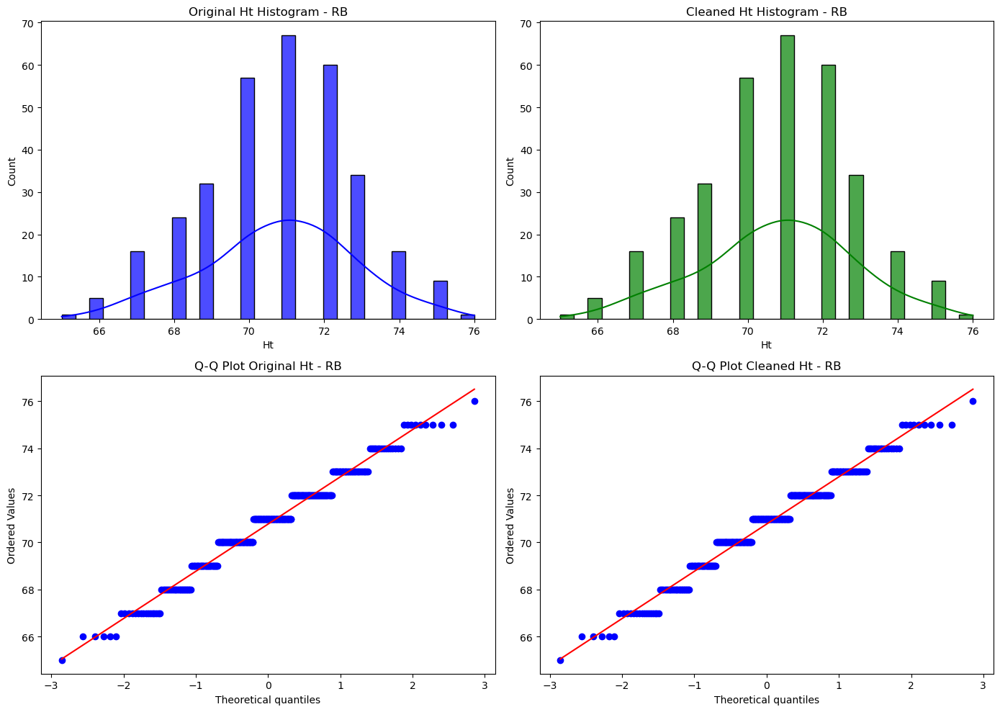

Ht - RB (Original): Mean=70.7795, Std Dev=2.0212
Ht - RB (Cleaned): Mean=70.7795, Std Dev=2.0212


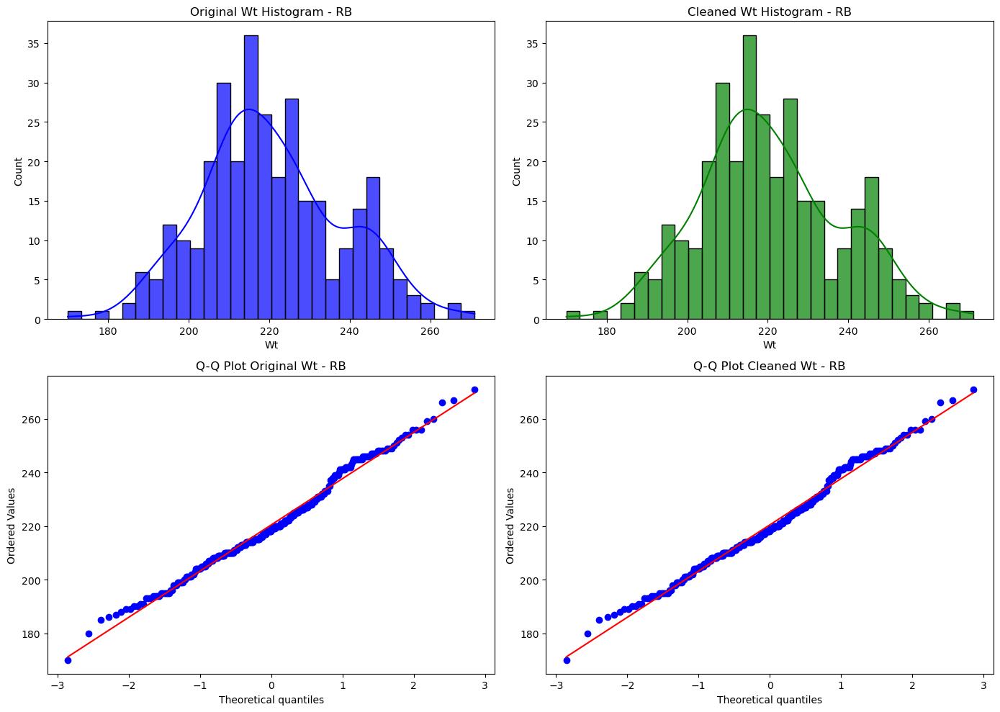

Wt - RB (Original): Mean=220.4193, Std Dev=17.2318
Wt - RB (Cleaned): Mean=220.4193, Std Dev=17.2318


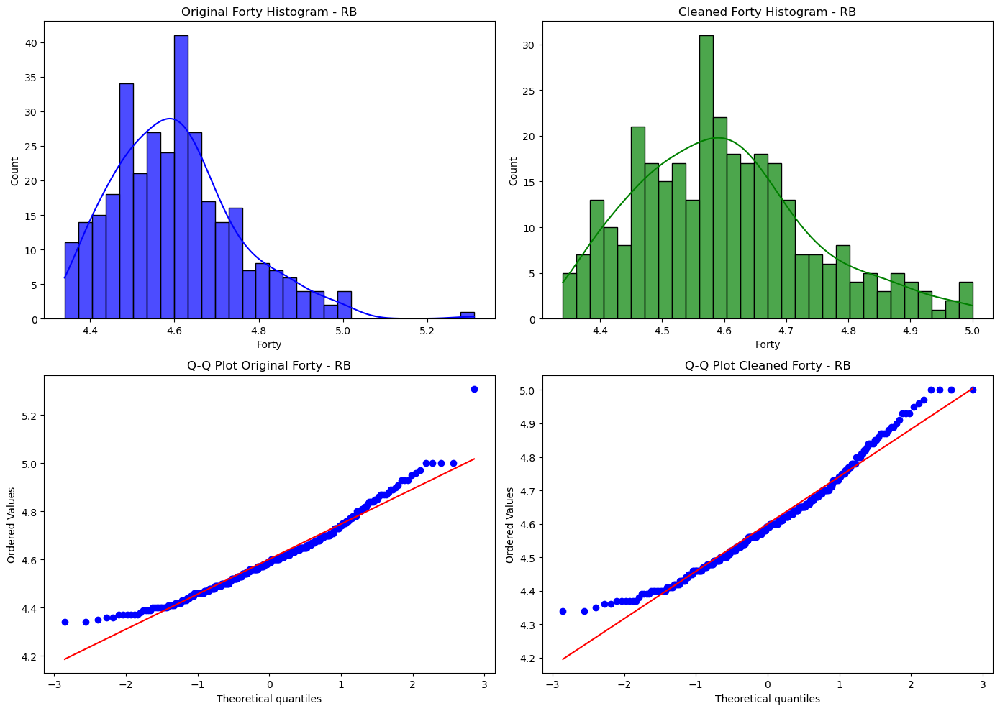

Forty - RB (Original): Mean=4.6020, Std Dev=0.1478
Forty - RB (Cleaned): Mean=4.5998, Std Dev=0.1426


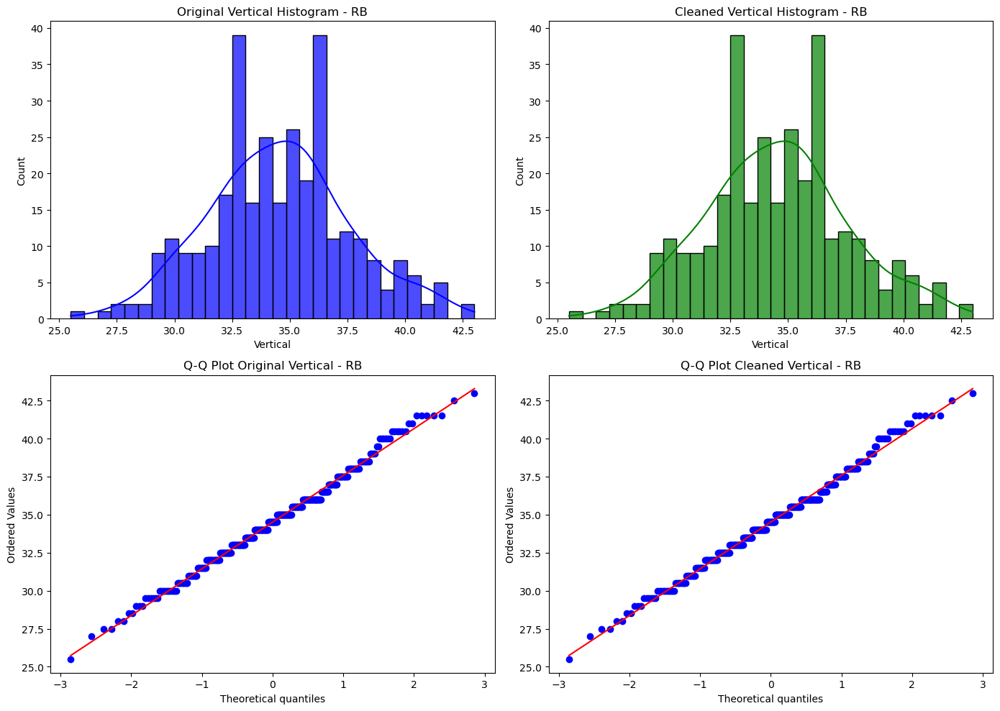

Vertical - RB (Original): Mean=34.5124, Std Dev=3.0622
Vertical - RB (Cleaned): Mean=34.5124, Std Dev=3.0622


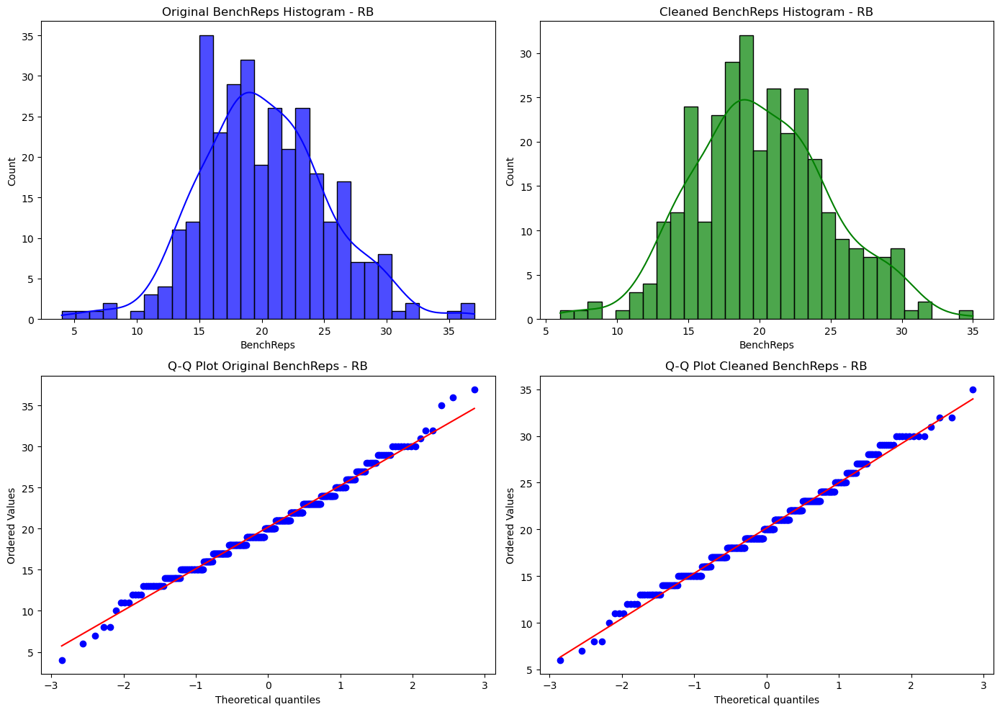

BenchReps - RB (Original): Mean=20.1925, Std Dev=5.0666
BenchReps - RB (Cleaned): Mean=20.1411, Std Dev=4.8385


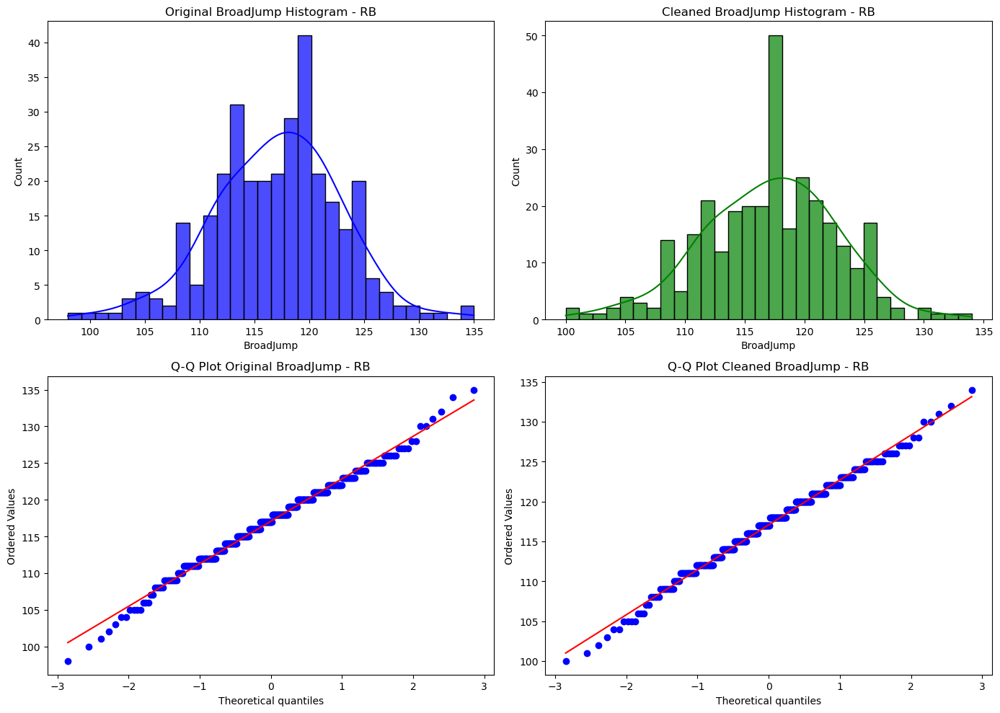

BroadJump - RB (Original): Mean=117.0621, Std Dev=5.7866
BroadJump - RB (Cleaned): Mean=117.0656, Std Dev=5.6167


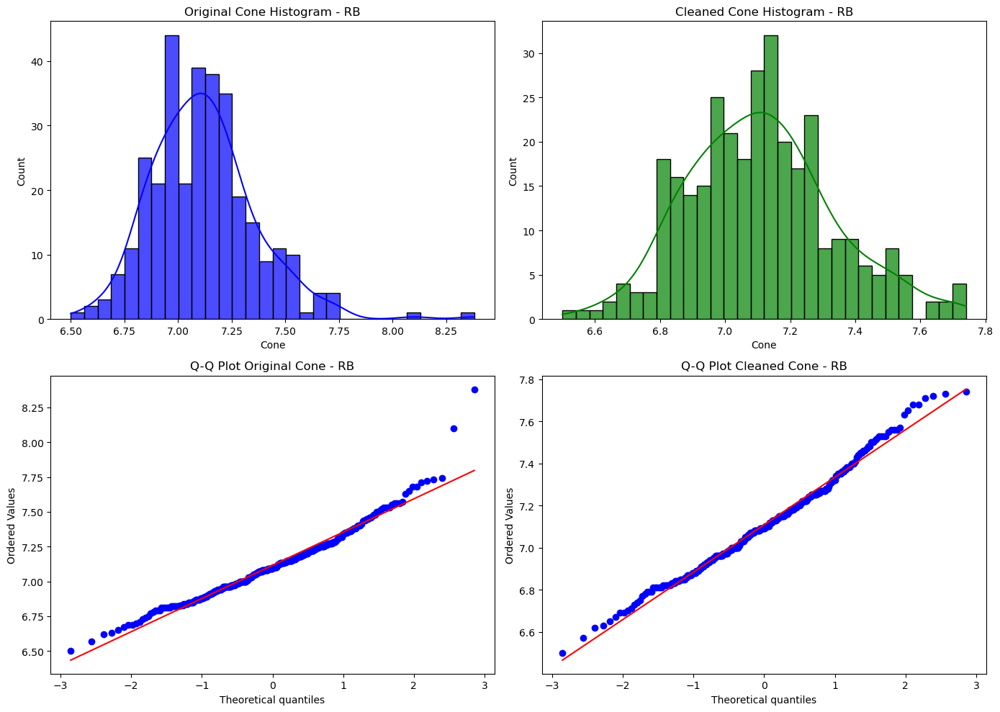

Cone - RB (Original): Mean=7.1159, Std Dev=0.2418
Cone - RB (Cleaned): Mean=7.1089, Std Dev=0.2252


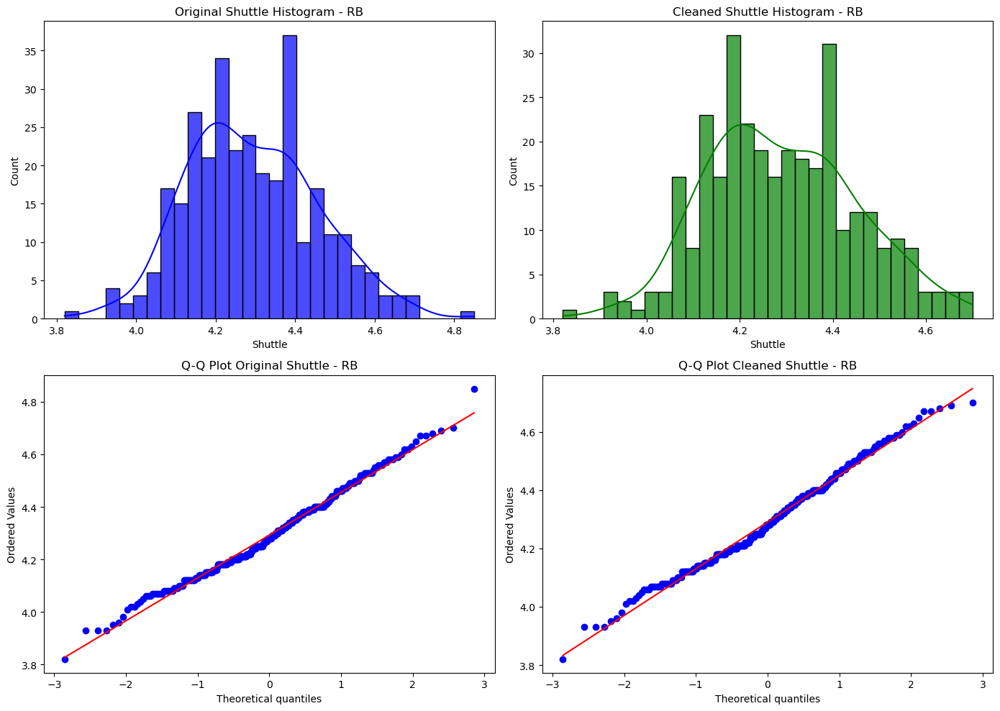

Shuttle - RB (Original): Mean=4.2925, Std Dev=0.1629
Shuttle - RB (Cleaned): Mean=4.2907, Std Dev=0.1601


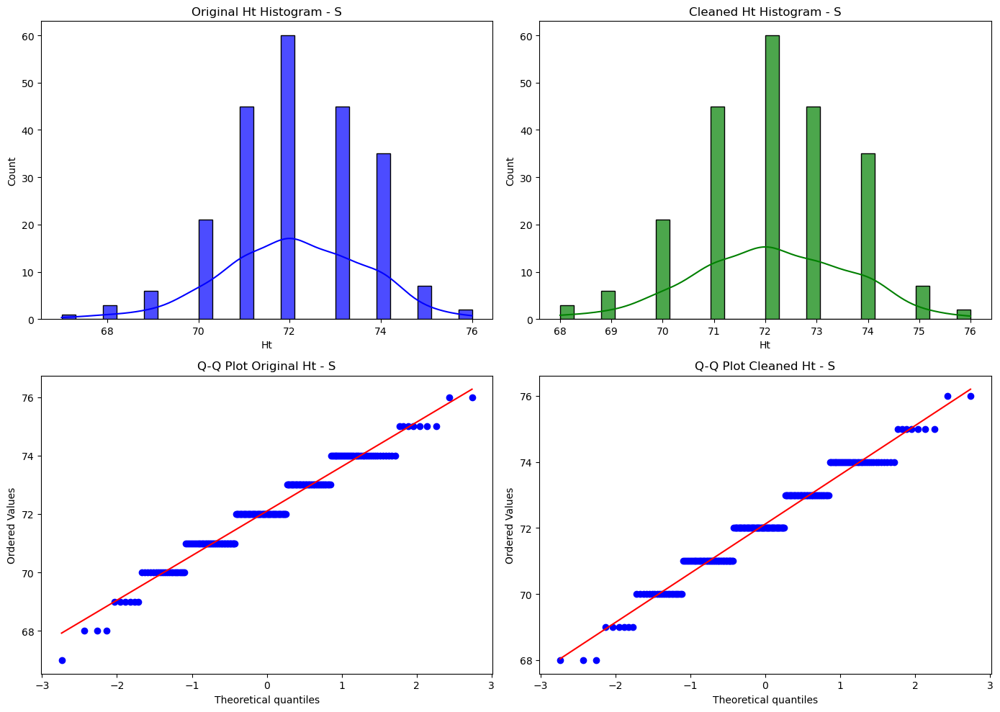

Ht - S (Original): Mean=72.0978, Std Dev=1.5438
Ht - S (Cleaned): Mean=72.1205, Std Dev=1.5089


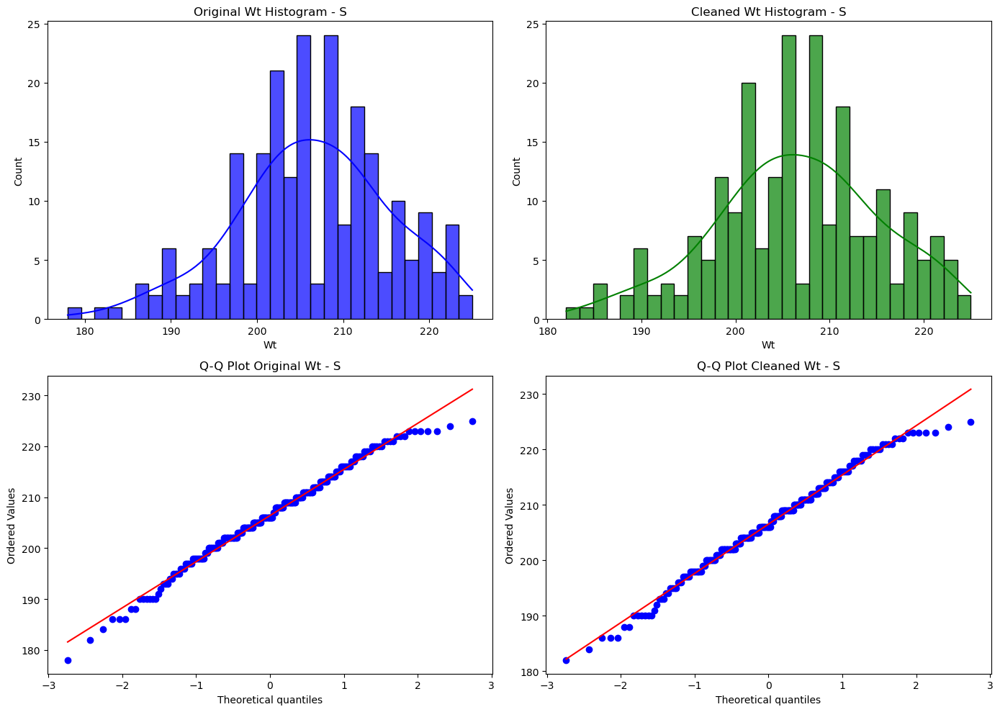

Wt - S (Original): Mean=206.3956, Std Dev=9.0381
Wt - S (Cleaned): Mean=206.5223, Std Dev=8.8556


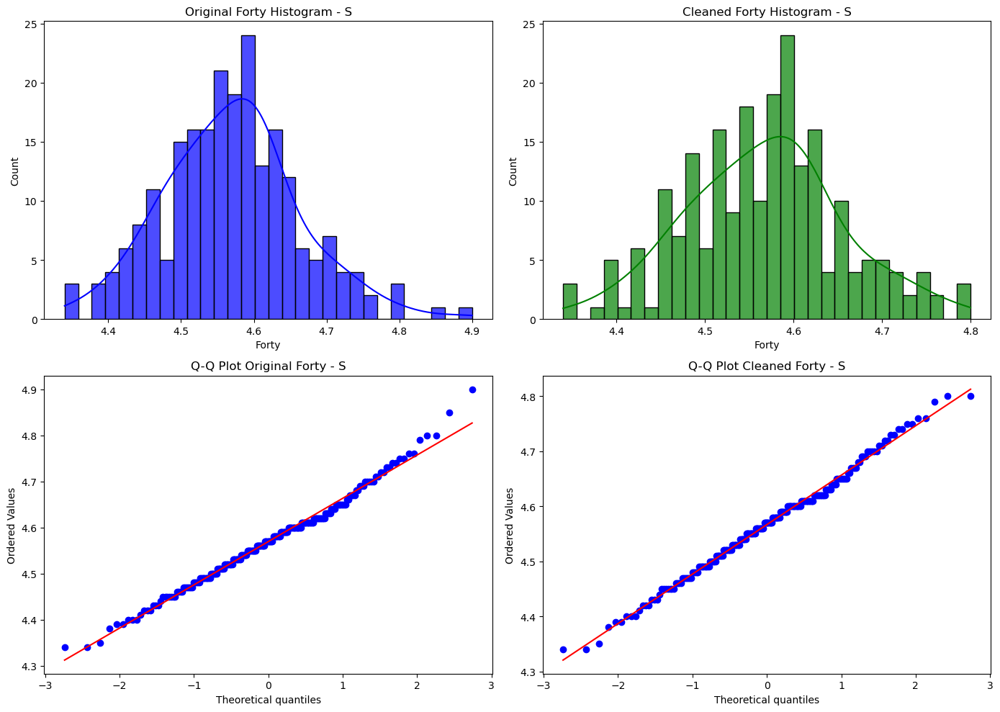

Forty - S (Original): Mean=4.5694, Std Dev=0.0937
Forty - S (Cleaned): Mean=4.5666, Std Dev=0.0894


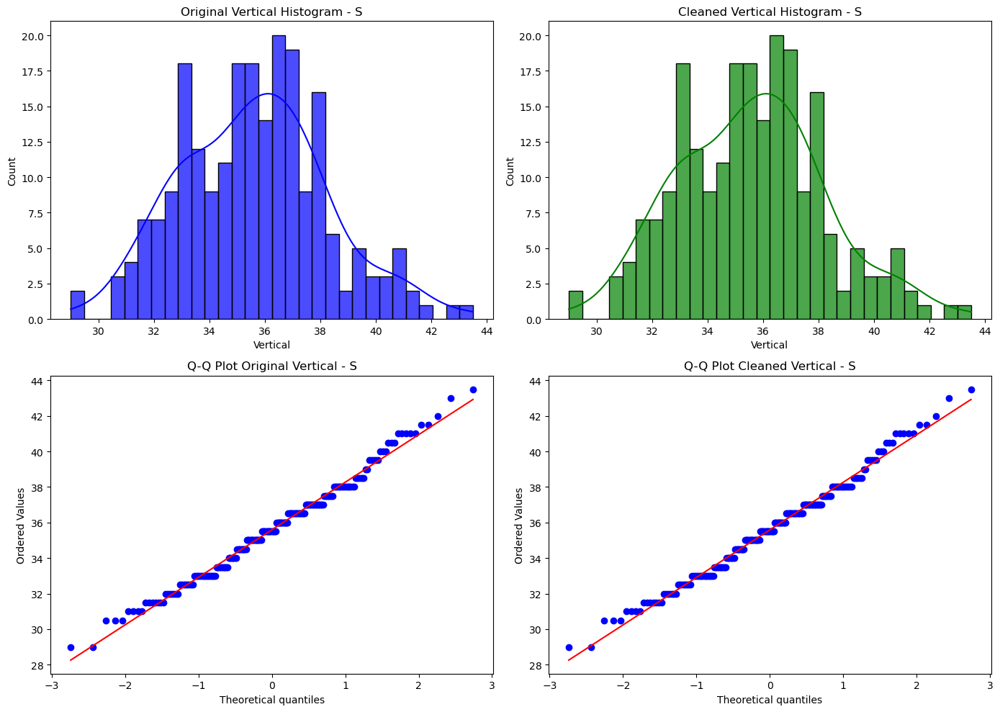

Vertical - S (Original): Mean=35.5911, Std Dev=2.6692
Vertical - S (Cleaned): Mean=35.5911, Std Dev=2.6692


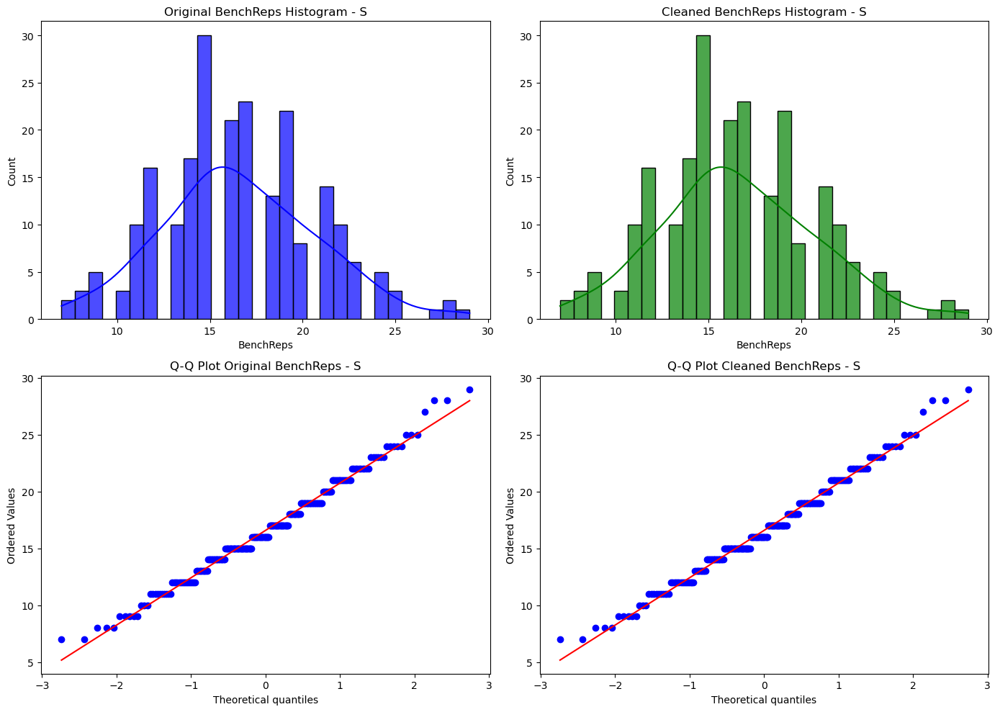

BenchReps - S (Original): Mean=16.5822, Std Dev=4.1569
BenchReps - S (Cleaned): Mean=16.5822, Std Dev=4.1569


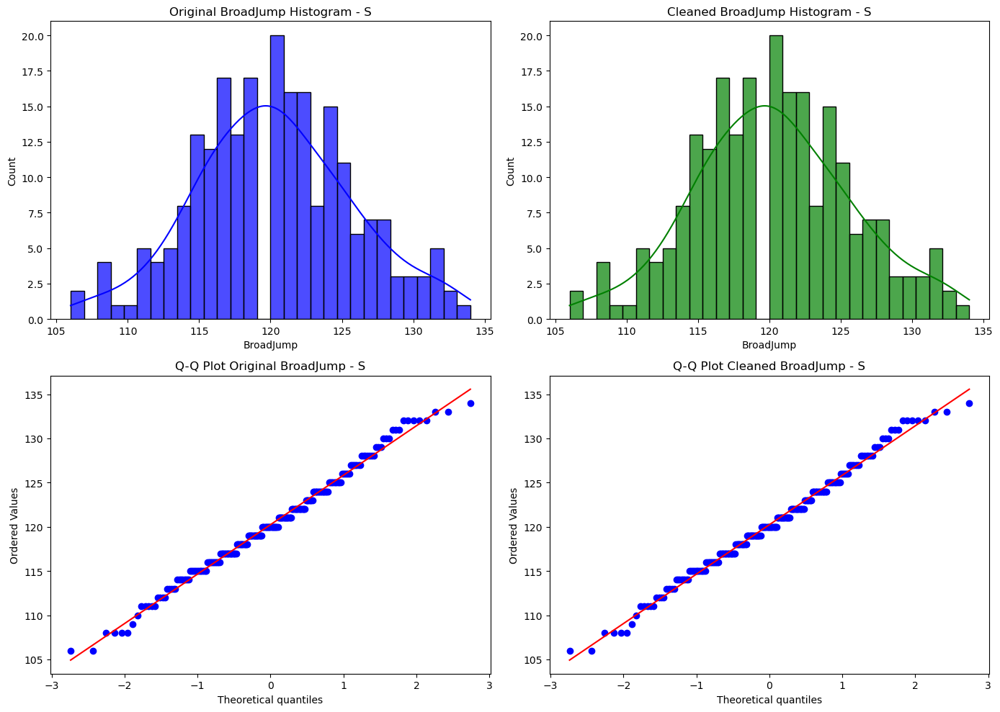

BroadJump - S (Original): Mean=120.2400, Std Dev=5.5674
BroadJump - S (Cleaned): Mean=120.2400, Std Dev=5.5674


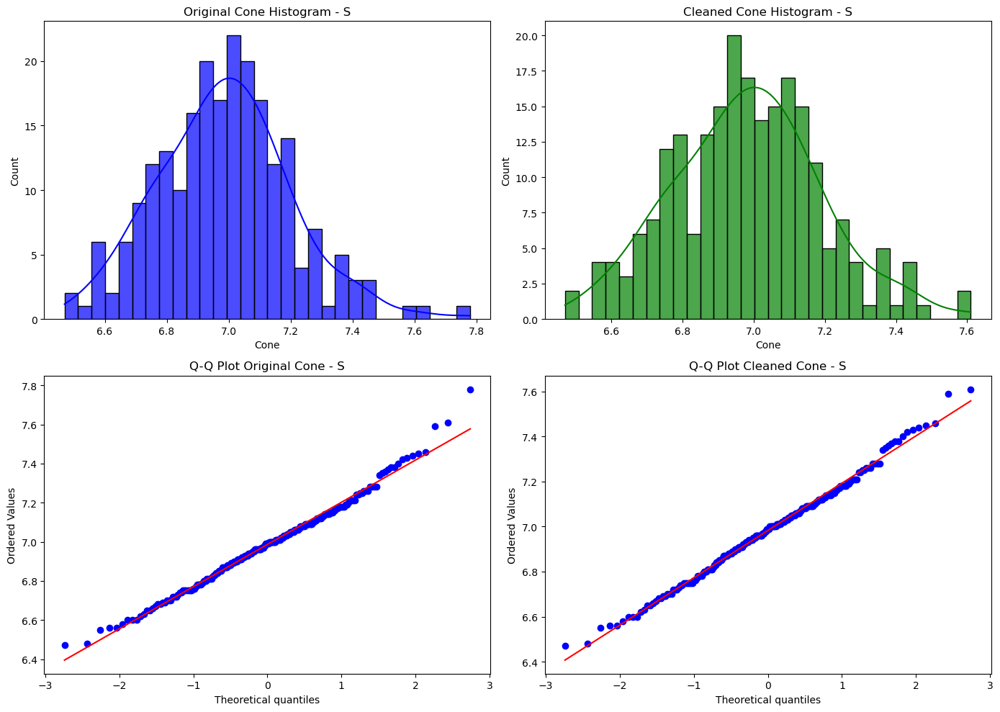

Cone - S (Original): Mean=6.9861, Std Dev=0.2153
Cone - S (Cleaned): Mean=6.9825, Std Dev=0.2091


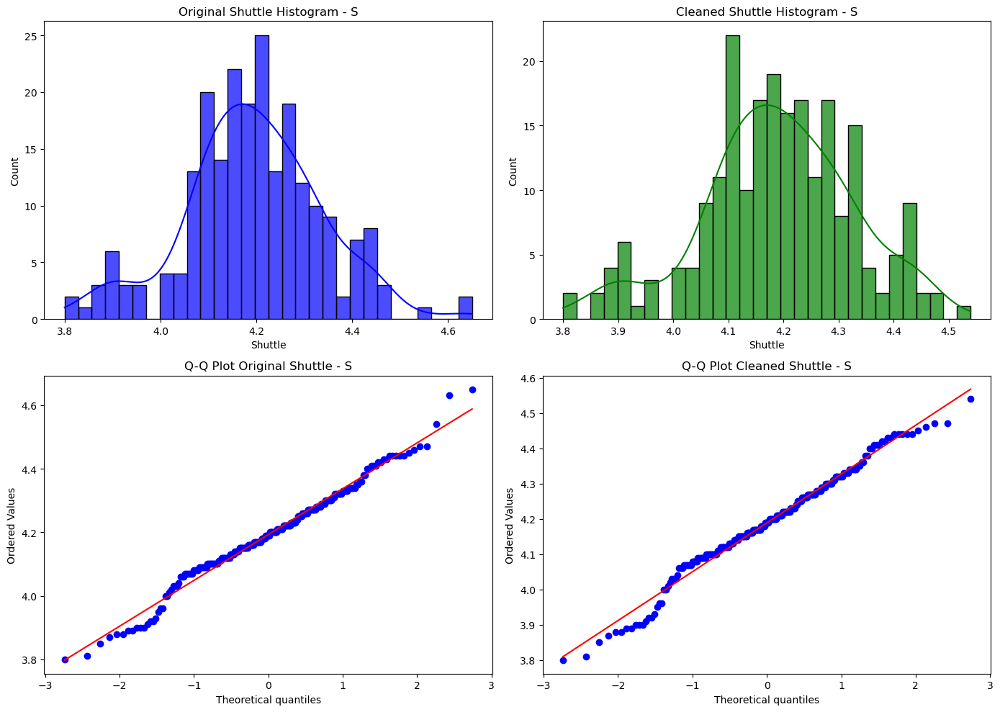

Shuttle - S (Original): Mean=4.1928, Std Dev=0.1441
Shuttle - S (Cleaned): Mean=4.1887, Std Dev=0.1384


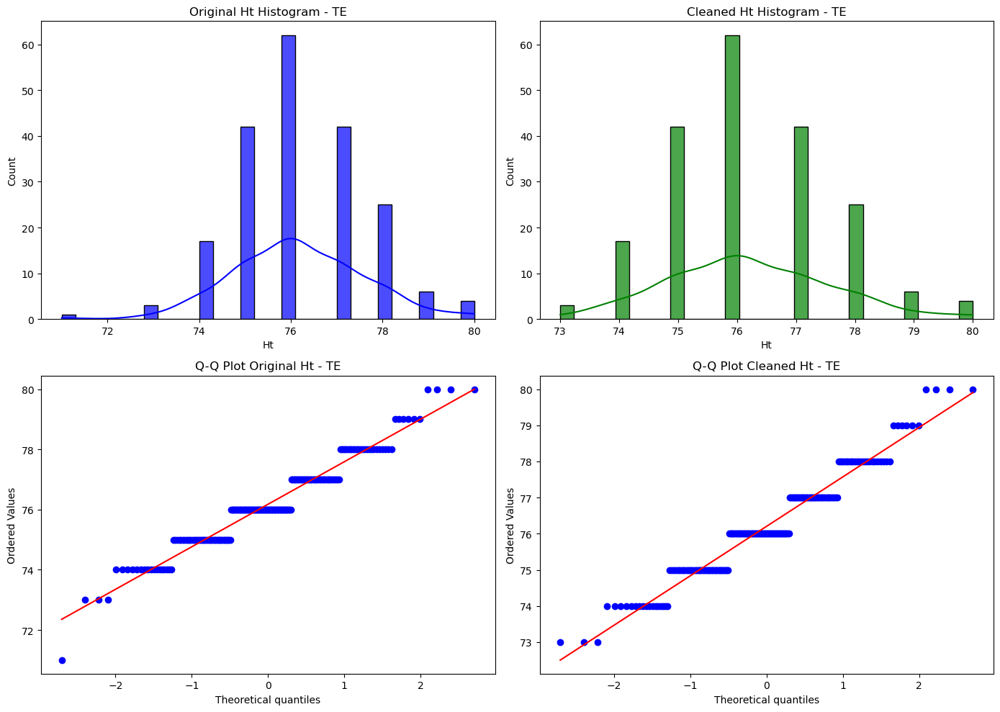

Ht - TE (Original): Mean=76.1782, Std Dev=1.4379
Ht - TE (Cleaned): Mean=76.2040, Std Dev=1.3940


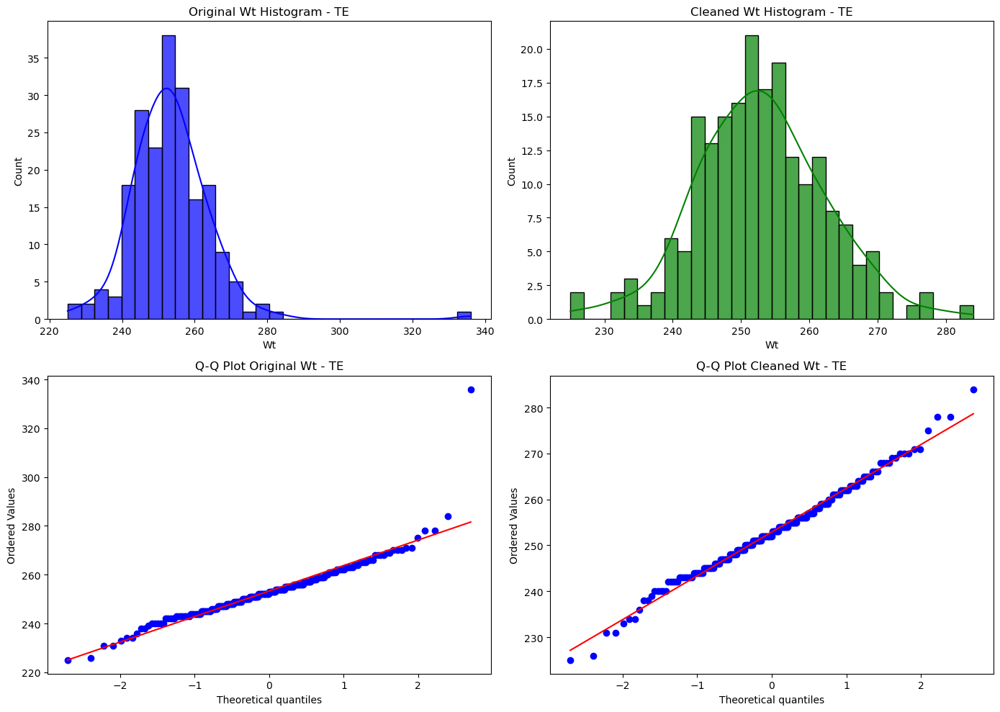

Wt - TE (Original): Mean=253.3069, Std Dev=11.1308
Wt - TE (Cleaned): Mean=252.8955, Std Dev=9.4949


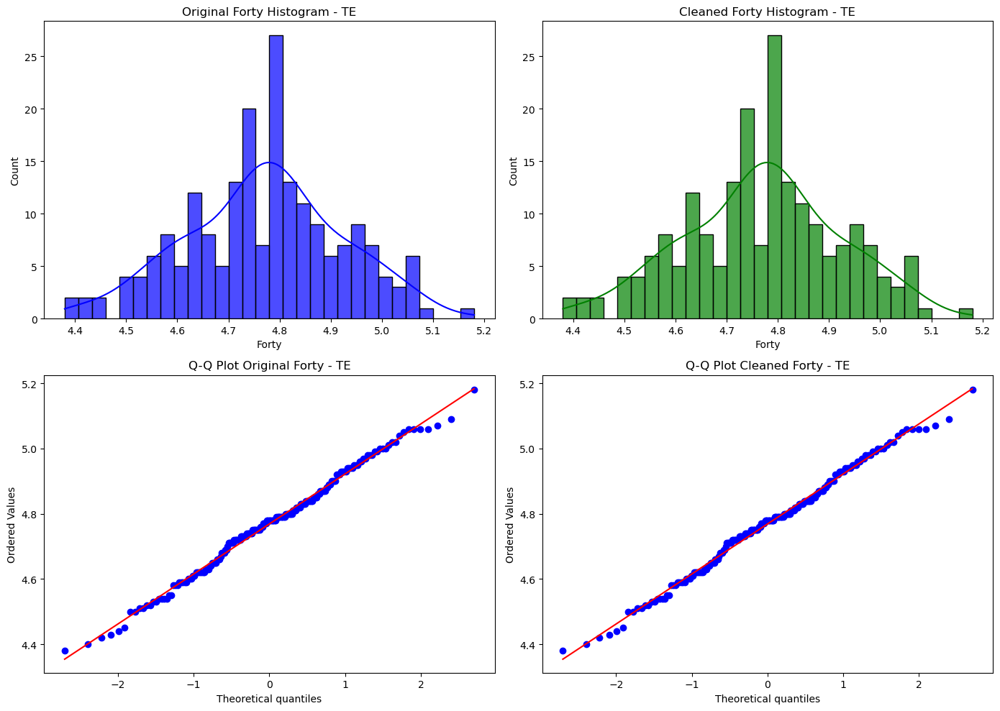

Forty - TE (Original): Mean=4.7689, Std Dev=0.1525
Forty - TE (Cleaned): Mean=4.7689, Std Dev=0.1525


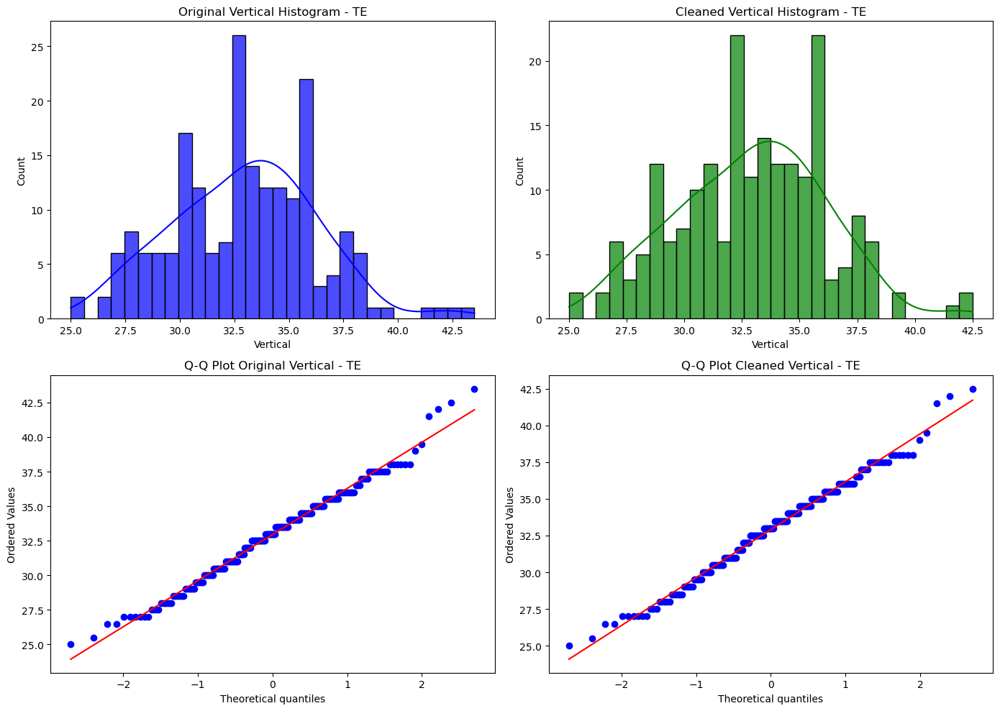

Vertical - TE (Original): Mean=32.9530, Std Dev=3.3262
Vertical - TE (Cleaned): Mean=32.9005, Std Dev=3.2496


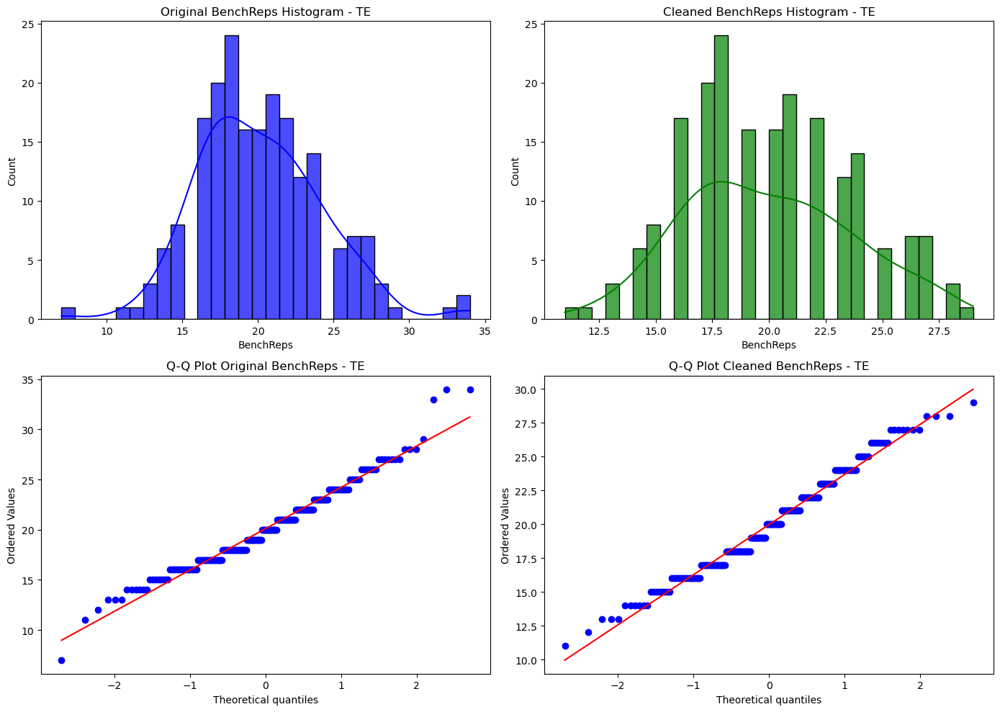

BenchReps - TE (Original): Mean=20.1040, Std Dev=4.1350
BenchReps - TE (Cleaned): Mean=19.9646, Std Dev=3.7081


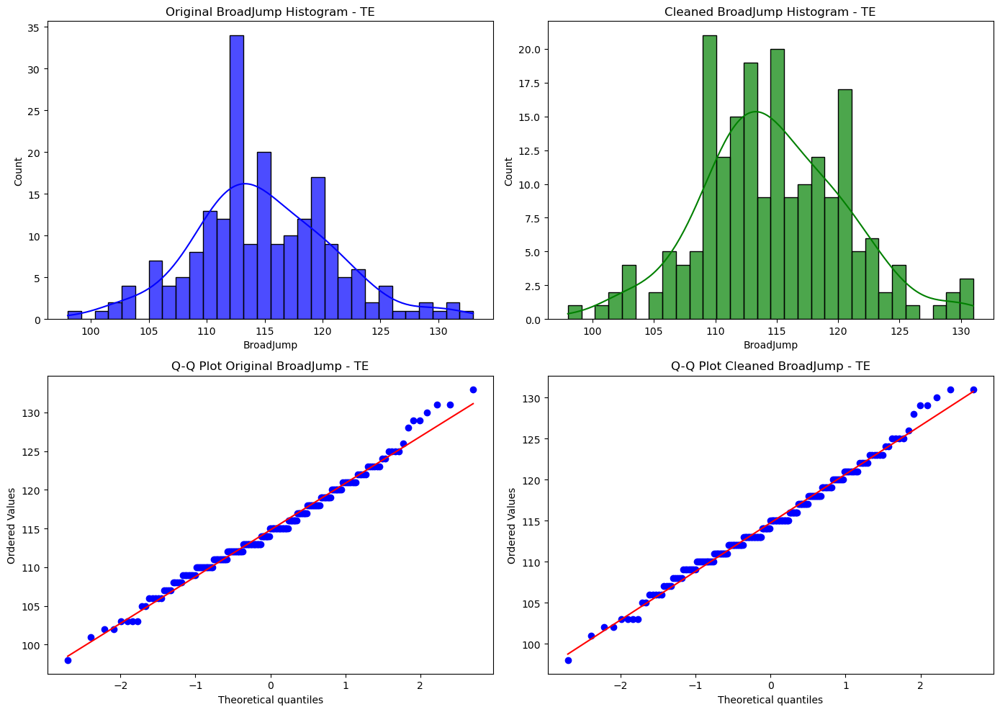

BroadJump - TE (Original): Mean=114.8168, Std Dev=6.0191
BroadJump - TE (Cleaned): Mean=114.7264, Std Dev=5.8949


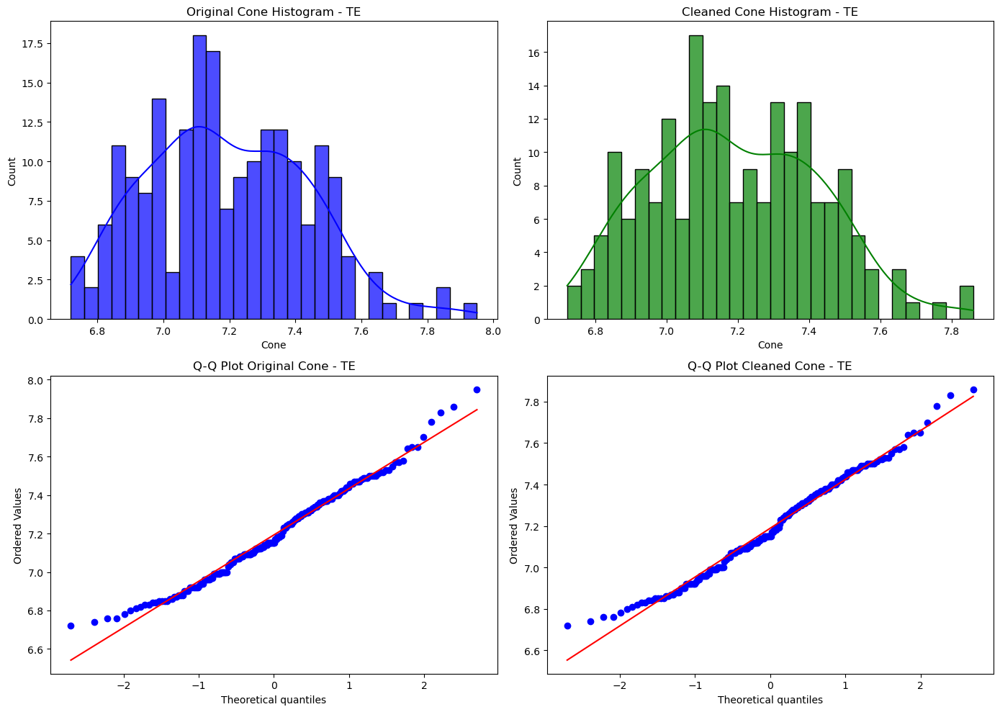

Cone - TE (Original): Mean=7.1928, Std Dev=0.2405
Cone - TE (Cleaned): Mean=7.1891, Std Dev=0.2351


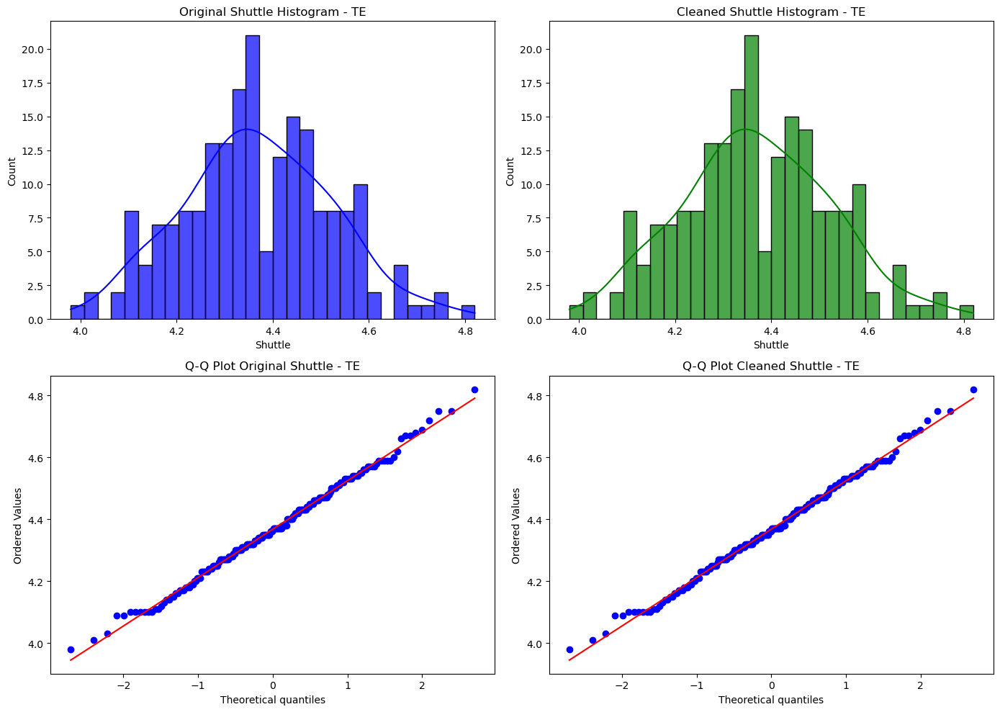

Shuttle - TE (Original): Mean=4.3680, Std Dev=0.1554
Shuttle - TE (Cleaned): Mean=4.3680, Std Dev=0.1554


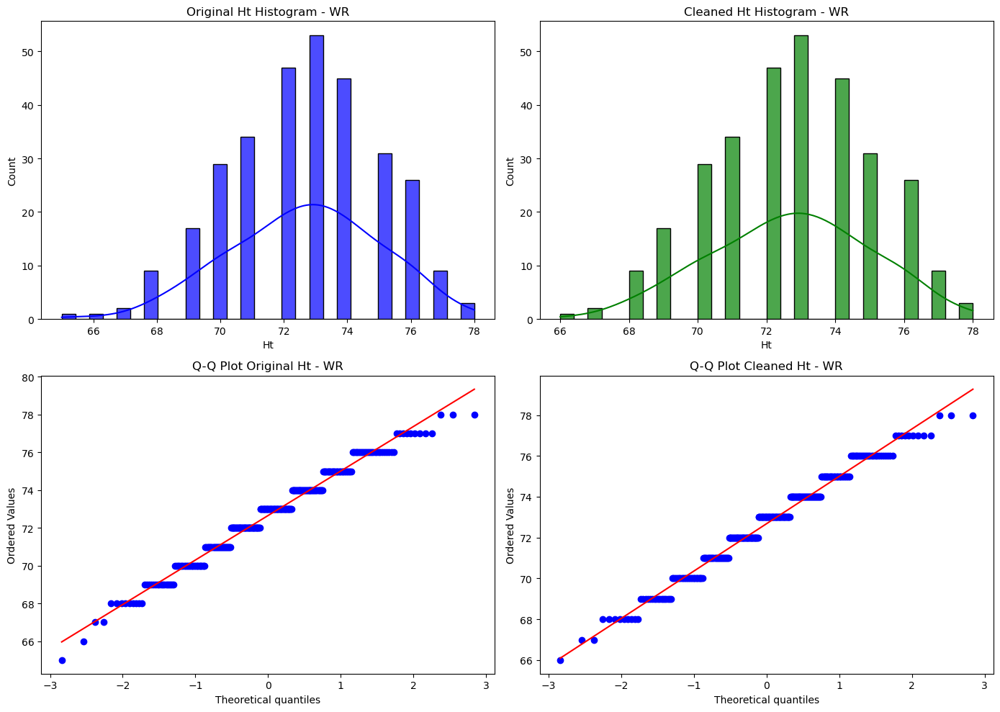

Ht - WR (Original): Mean=72.6547, Std Dev=2.3649
Ht - WR (Cleaned): Mean=72.6797, Std Dev=2.3277


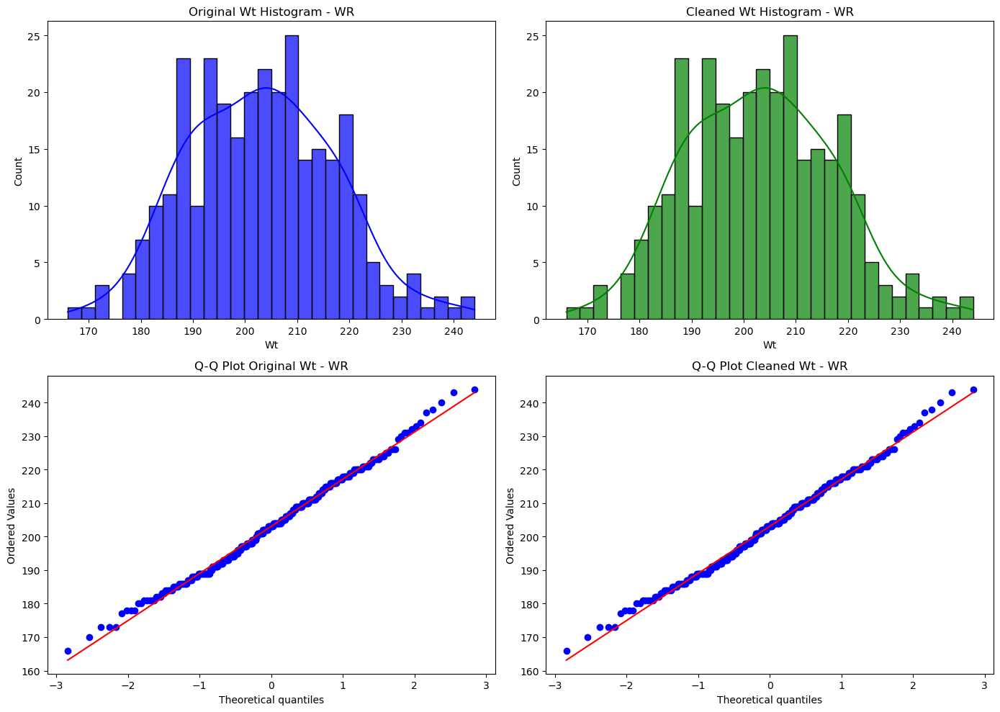

Wt - WR (Original): Mean=203.0814, Std Dev=14.0162
Wt - WR (Cleaned): Mean=203.0814, Std Dev=14.0162


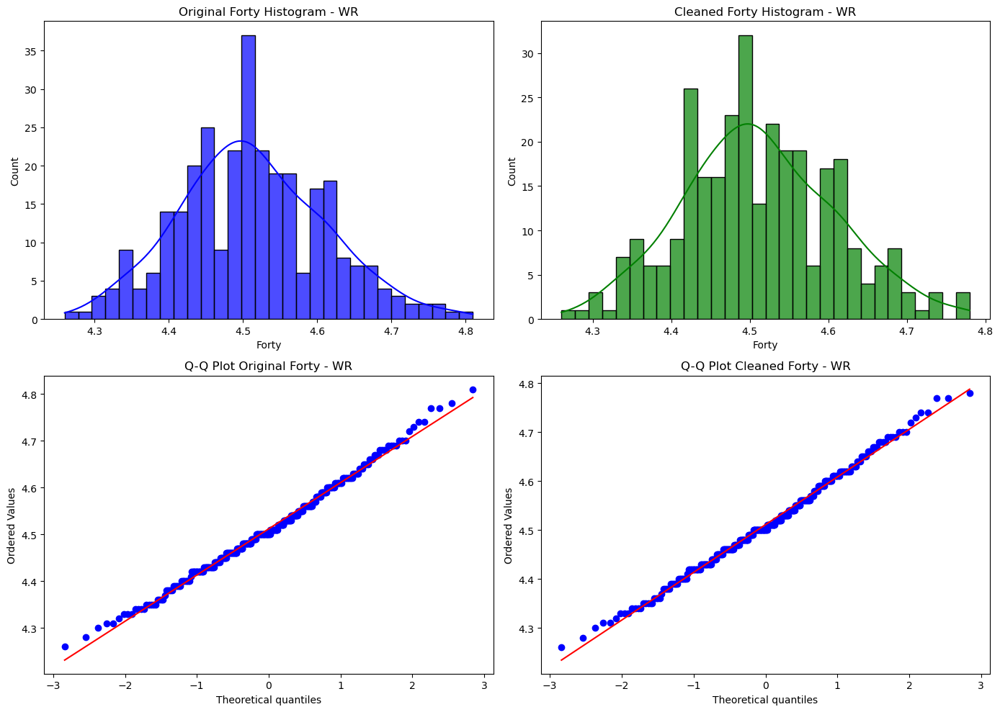

Forty - WR (Original): Mean=4.5119, Std Dev=0.0984
Forty - WR (Cleaned): Mean=4.5109, Std Dev=0.0970


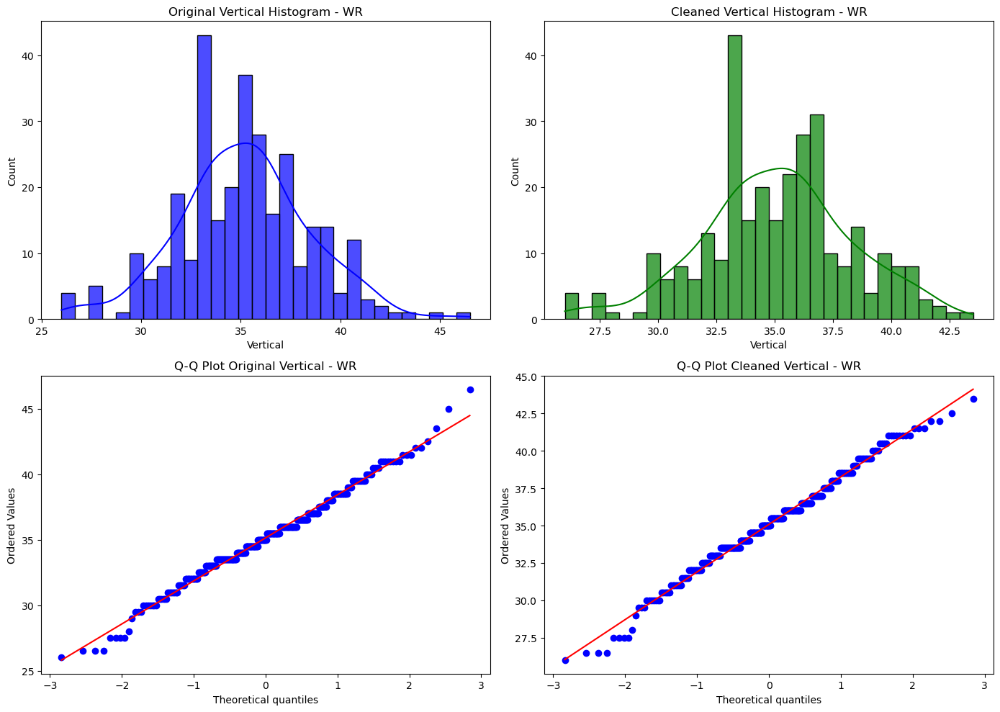

Vertical - WR (Original): Mean=35.1498, Std Dev=3.2843
Vertical - WR (Cleaned): Mean=35.0803, Std Dev=3.1795


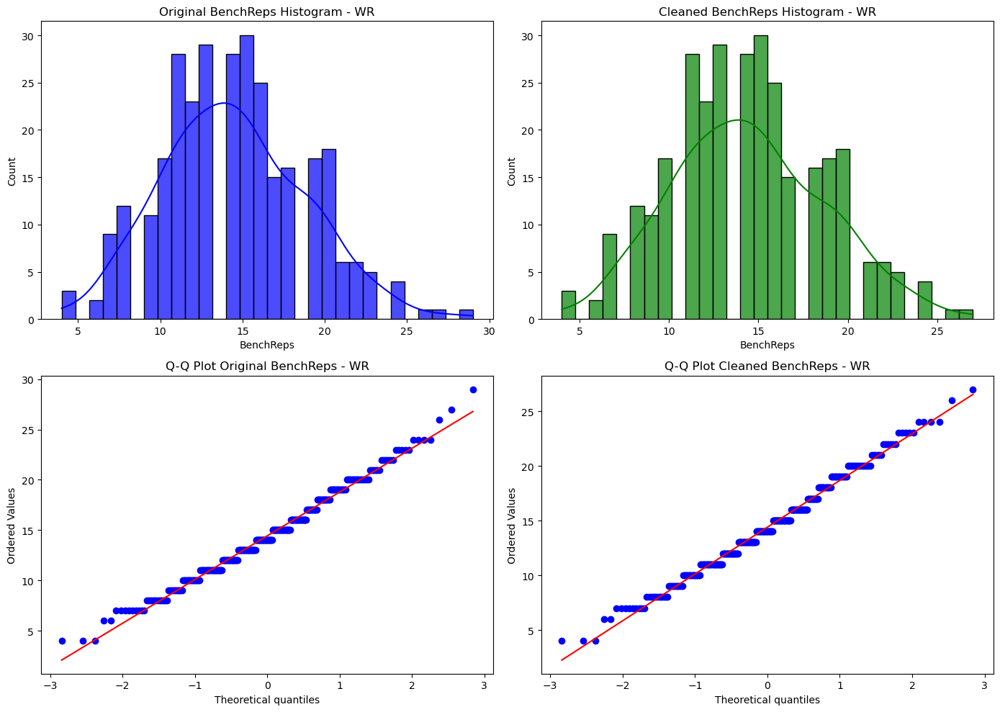

BenchReps - WR (Original): Mean=14.4365, Std Dev=4.3452
BenchReps - WR (Cleaned): Mean=14.3889, Std Dev=4.2714


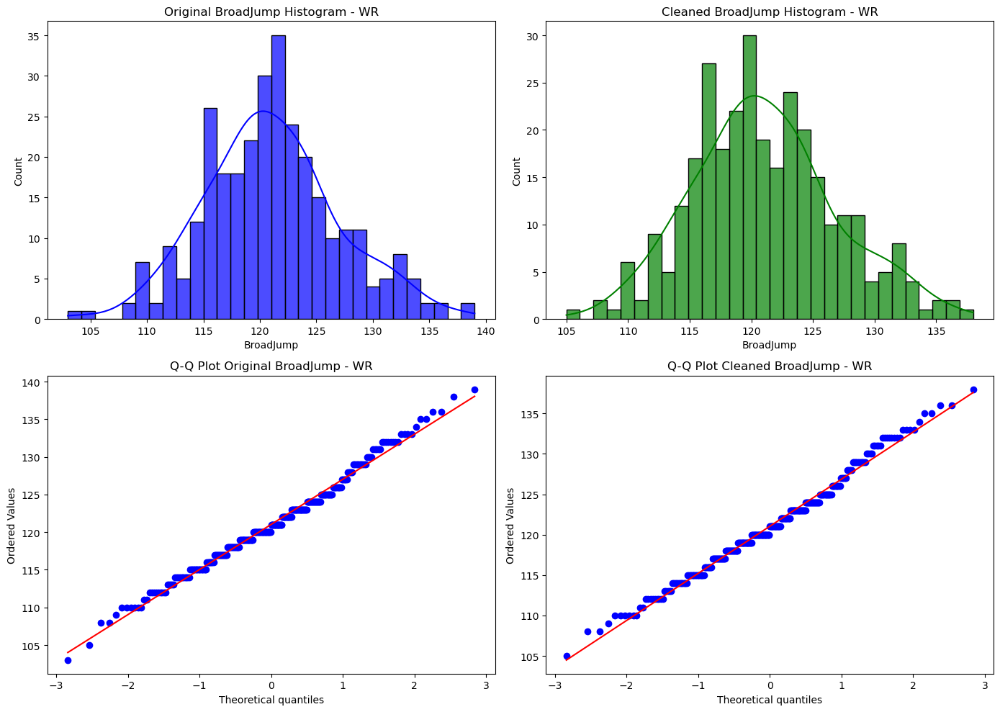

BroadJump - WR (Original): Mean=121.0358, Std Dev=5.9871
BroadJump - WR (Cleaned): Mean=121.0361, Std Dev=5.8266


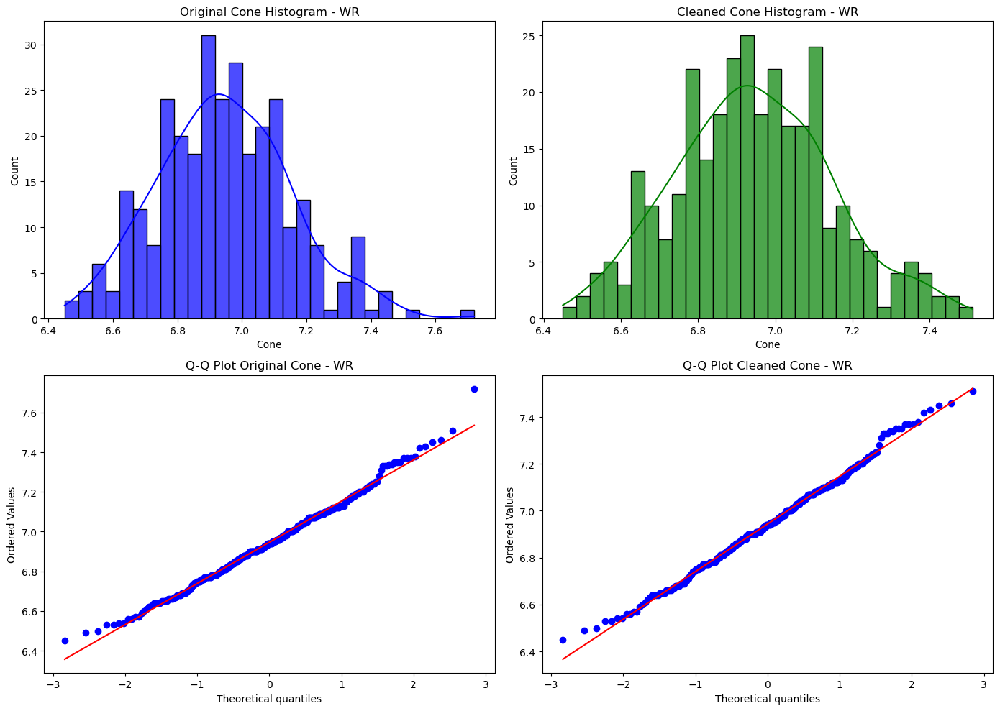

Cone - WR (Original): Mean=6.9464, Std Dev=0.2069
Cone - WR (Cleaned): Mean=6.9439, Std Dev=0.2025


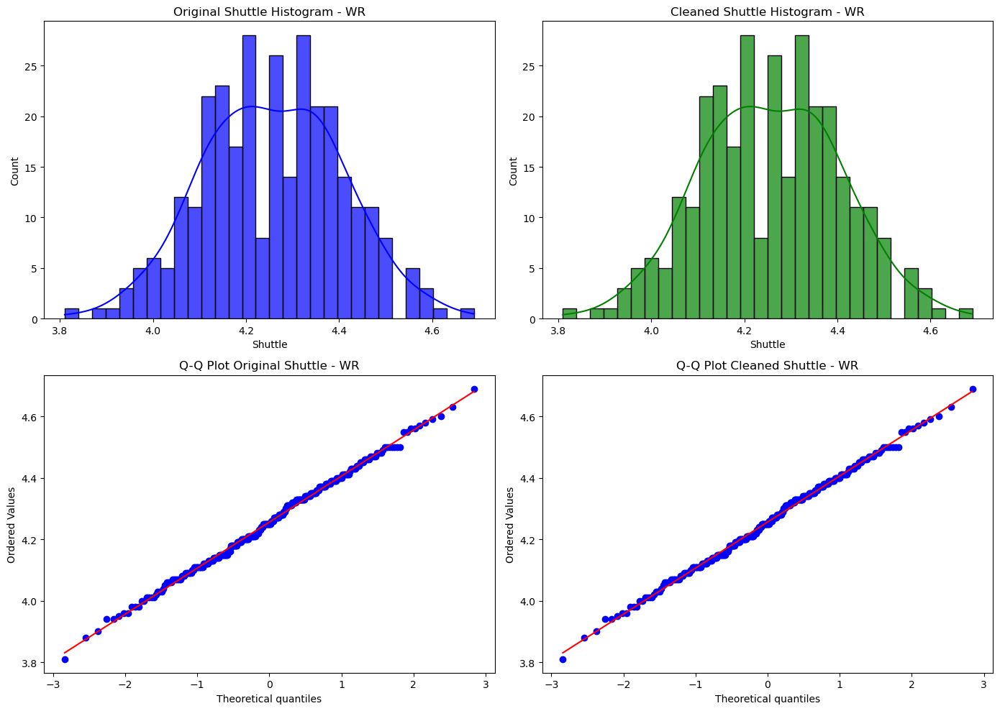

Shuttle - WR (Original): Mean=4.2561, Std Dev=0.1490
Shuttle - WR (Cleaned): Mean=4.2561, Std Dev=0.1490


In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore, probplot, shapiro

def remove_outliers(series, threshold=3):
    """
    Remove outliers from a series based on Z-score.

    Parameters:
    series (Series): The pandas Series from which to remove outliers.
    threshold (float): The Z-score threshold to use for identifying outliers.

    Returns:
    Series: A series with outliers removed.

    Explanation:
    The function calculates the Z-scores, which are normalized to the mean and standard deviation of
    the data, for the series and removes the outliers based on the specified threshold. It returns a 
    new series with the outliers removed. This is useful for data cleaning and preprocessing to ensure
    that the data is not skewed by extreme values.
    
    """
    z_scores = zscore(series)
    abs_z_scores = np.abs(z_scores)
    return series[abs_z_scores < threshold]

def plot_histograms_and_qq(dataframe, columns, position):
    """
    Plot histograms and Q-Q plots for original and cleaned data for specified columns.

    Parameters:
    dataframe (DataFrame): The DataFrame containing the data.
    columns (list): List of columns to plot.
    position (str): The position (e.g., player position) for which the plots are being generated.

    Explanation:
    The function plots histograms and Q-Q plots for the original and cleaned data for the specified columns.
    It first removes outliers from the data using the remove_outliers function and then generates the plots.
    The function also prints the mean and standard deviation of the original and cleaned data for comparison.

    Q-Q plots are used to visually assess whether the data follows a normal distribution. This is accomplished by 
    plotting the quantiles of the data against the quantiles of a theoretical normal distribution. If the data points
    fall approximately along a straight line, it indicates that the data is normally distributed.

    Histograms provide a visual representation of the distribution of the data, showing the frequency of values in
    different bins. The histograms are plotted for both the original and cleaned data to compare the distributions.
    Adding kernel density estimation (KDE) to the histograms provides a smoothed representation of the data distribution.

    This is valuable information for understanding the data and identifying potential issues such as outliers.
    """
    for column in columns:
        if dataframe[column].dtype in [np.float64, np.int64]:
            cleaned_column = remove_outliers(dataframe[column])
            
            fig, axes = plt.subplots(2, 2, figsize=(14, 10))
            
            # Original data histogram
            sns.histplot(dataframe[column].dropna(), bins=30, kde=True, color='blue', edgecolor='k', alpha=0.7, ax=axes[0, 0])
            axes[0, 0].set_title(f'Original {column} Histogram - {position}')
            
            # Cleaned data histogram
            sns.histplot(cleaned_column.dropna(), bins=30, kde=True, color='green', edgecolor='k', alpha=0.7, ax=axes[0, 1])
            axes[0, 1].set_title(f'Cleaned {column} Histogram - {position}')
            
            # Q-Q plot for original data
            probplot(dataframe[column].dropna(), dist="norm", plot=axes[1, 0])
            axes[1, 0].set_title(f'Q-Q Plot Original {column} - {position}')
            
            # Q-Q plot for cleaned data
            probplot(cleaned_column.dropna(), dist="norm", plot=axes[1, 1])
            axes[1, 1].set_title(f'Q-Q Plot Cleaned {column} - {position}')
            
            plt.tight_layout()
            plt.show()

            # Comparison of original and cleaned data
            original_mean = dataframe[column].mean()
            original_std = dataframe[column].std()
            cleaned_mean = cleaned_column.mean()
            cleaned_std = cleaned_column.std()

            print(f'{column} - {position} (Original): Mean={original_mean:.4f}, Std Dev={original_std:.4f}')
            print(f'{column} - {position} (Cleaned): Mean={cleaned_mean:.4f}, Std Dev={cleaned_std:.4f}')

# Split df_train into separate dataframes for each position
position_dfs = {position: data for position, data in df_train.groupby('Pos')}

# Display the keys of the position_dfs dictionary to verify the split
print("Positions in training set:", position_dfs.keys())

# Perform Shapiro-Wilk test for normality on each column in each position's dataframe
'''
The Shapiro-Wilk test is a statistical test that assesses whether a given 
sample of data comes from a normally distributed population. The test is 
based on the correlation between the data and the corresponding normal scores. 
The null hypothesis of the test is that the data is normally distributed. If the 
p-value is less than a chosen alpha level (e.g., 0.05), the null hypothesis is 
rejected, indicating that the data is not normally distributed.

In this case, we perform the Shapiro-Wilk test for normality on each column in
each position's dataframe to assess whether the data is normally distributed.

The p-value represents the probability that the data is normally distributed.
A low p-value indicates that the data is not normally distributed, while a high
p-value suggests that the data is normally distributed. It is derived from the
test statistic, which is a measure of the difference between the observed data
and the expected data under the null hypothesis.
'''
normality_results = {}

for position, dataframe in position_dfs.items():
    normality_results[position] = {}
    for column in dataframe.columns:
        if dataframe[column].dtype in [np.float64, np.int64]:
            stat, p_value = shapiro(dataframe[column])
            normality_results[position][column] = {'statistic': stat, 'p_value': p_value}

# Display the results of the Shapiro-Wilk test
for position, results in normality_results.items():
    print(f"\nPosition: {position}")
    for column, result in results.items():
        print(f"  Column: {column}, Statistic: {result['statistic']:.4f}, P-value: {result['p_value']:.4f}")

# Convert the results dictionary to a DataFrame for easier inspection
results_df = pd.DataFrame.from_dict({(i,j): normality_results[i][j] 
                                    for i in normality_results.keys() 
                                    for j in normality_results[i].keys()},
                                    orient='index')

# Define columns to check for outliers
columns_to_check_for_outliers = ['Ht', 'Wt', 'Forty', 'Vertical', 'BenchReps', 'BroadJump', 'Cone', 'Shuttle']

# Plot histograms and Q-Q plots for each position's dataframe
for position, dataframe in position_dfs.items():
    plot_histograms_and_qq(dataframe, columns_to_check_for_outliers, position)


In [7]:
#=============================================================================#
''' This section processes the data and builds the synthetic dataset. '''
#=============================================================================#

' This section processes the data and builds the synthetic dataset. '

In [8]:
import numpy as np

def create_synthetic_data(df, continuous_columns, discrete_columns, num_samples):
    """
    Create synthetic data based on the distribution of given data.

    Parameters:
    df (DataFrame): Original DataFrame containing the data.
    continuous_columns (list): List of continuous columns to generate synthetic data for.
    discrete_columns (list): List of discrete columns to generate synthetic data for.
    num_samples (int): Number of synthetic samples to generate.

    Returns:
    DataFrame: DataFrame containing synthetic data.

    Explanation:
    This function generates synthetic dataset based on the distribution of the given data.
    It generates synthetic data for continuous variables by sampling from a normal distribution
    with the same mean and standard deviation as the original data. For discrete variables,
    it samples from the original data with replacement. The function returns a DataFrame
    containing the synthetic data.
    """
    synthetic_data = pd.DataFrame()

    # Generate synthetic data for continuous variables
    for column in continuous_columns:
        mean = df[column].mean()
        std = df[column].std()
        synthetic_data[column] = np.random.normal(mean, std, num_samples)
    
    # Generate synthetic data for discrete variables
    for column in discrete_columns:
        synthetic_data[column] = np.random.choice(df[column].dropna(), num_samples, replace=True)
    
    return synthetic_data

# Define the columns for synthetic data generation
'''
We differentiate between continuous and discrete columns in the dataset based on the type
of data being represented. Continuous columns typically contain numerical data that can
take on any value within a range, while discrete columns contain categorical or numerical
data that can only take on specific values. In this case, the three continuous variables
are all time measurements (e.g., 40-yard dash time), while the discrete variables represent
physical measurements (e.g., height, weight). While vertical jump and broad jump can also be
continuous variables, we treat them as discrete to align with the data gathering standard
set forth by the NFL.

By separating the columns into these categories, we can generate synthetic data that is 
representative of the original dataset.
'''
continuous_columns = ['Forty', 'Cone', 'Shuttle']
discrete_columns = ['Ht', 'Wt', 'Vertical', 'BenchReps', 'BroadJump']

# Initialize an empty DataFrame to hold synthetic data for all positions
synthetic_data_all_positions = pd.DataFrame()

# Calculate the count of players per position in the training set
position_counts_train = df_train['Pos'].value_counts()
print(f'Players per position (training set): {position_counts_train}')

# Calculate the count of players per position in the test set
position_counts_test = df_test['Pos'].value_counts()
print(f'Players per position (testing set): {position_counts_test}')

# Calculate the total number of players in the training set
total_players = len(df_train)

# Calculate the relative frequency of players per position in the training and test sets
relative_frequency_train = position_counts_train / total_players
relative_frequency_test = position_counts_test / position_counts_test.sum()

# Set the total number of synthetic players to generate
total_synthetic_players = 100000

# Calculate the number of synthetic players to generate for each position based on relative frequency
num_players_per_position = (relative_frequency_train * total_synthetic_players).astype(int)

# Dictionary to store DataFrames for each position
position_dfs = {position: df_train[df_train['Pos'] == position] for position in position_counts_train.index}

# Generate synthetic data for each position and combine into a single DataFrame
for position, num_players in num_players_per_position.items():
    df_position = position_dfs[position]
    synthetic_data_position = create_synthetic_data(df_position, continuous_columns, discrete_columns, num_players)
    synthetic_data_position['Pos'] = position  # Add the position column
    synthetic_data_all_positions = pd.concat([synthetic_data_all_positions, synthetic_data_position], ignore_index=True)

# Reorder columns to match the desired order
ordered_columns = ['Ht', 'Wt', 'Forty', 'Vertical', 'BenchReps', 'BroadJump', 'Cone', 'Shuttle', 'Pos']
training_data = synthetic_data_all_positions[ordered_columns]

# Round continuous variables to two decimal places
training_data['Forty'] = training_data['Forty'].round(2)
training_data['Cone'] = training_data['Cone'].round(2)
training_data['Shuttle'] = training_data['Shuttle'].round(2)

# Add label-encoded mapping for positions
pos_label_mapping = dict(zip(df_train['Pos'], df_train['Pos_Label']))
training_data['Pos_Label'] = training_data['Pos'].map(pos_label_mapping)

print("Synthetic data for all positions:\n", training_data.head())

Players per position (training set): Pos
OL    612
DL    521
LB    395
DB    346
RB    322
WR    307
S     225
TE    202
QB     12
Name: count, dtype: int64
Players per position (testing set): Pos
OL    79
DL    69
RB    42
DB    34
LB    32
WR    26
S     25
TE    19
QB     1
Name: count, dtype: int64
Synthetic data for all positions:
    Ht   Wt  Forty  Vertical  BenchReps  BroadJump  Cone  Shuttle Pos  \
0  76  307   5.36      25.0       21.0      109.0  7.56     4.90  OL   
1  75  311   5.21      28.5       29.0      105.0  7.78     4.69  OL   
2  77  305   5.15      25.0       22.0      104.0  7.92     4.71  OL   
3  77  291   5.14      25.0       34.0      102.0  8.28     4.75  OL   
4  78  301   5.17      26.0       33.0      107.0  8.00     4.58  OL   

   Pos_Label  
0          3  
1          3  
2          3  
3          3  
4          3  


In [9]:
#============================================================#
''' This section trains and tests various ML models. '''
#============================================================#

' This section trains and tests various ML models. '

In [10]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, adjusted_rand_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Function to perform grid search for kNN and XGBoost classifiers
def perform_grid_search(X_train, y_train):
    """
    Perform grid search to find the best parameters for kNN and XGBoost classifiers.

    Parameters:
    X_train (array-like): Training features.
    y_train (array-like): Training labels.

    Returns:
    dict: A dictionary containing the best estimators for each classifier.

    Explanation:
    k-Nearest Neighbor (kNN) and XGBoost classifiers are popular supervised machine learning models
    used for classification tasks. This function performs grid search to find the best
    hyperparameters for each classifier using cross-validation. The function returns a
    dictionary containing the best estimators for each classifier based on the grid search results.

    k-Nearest Neighbors works by finding the k-nearest data points to a given input point and predicting
    the majority class among those neighbors. XGBoost is an ensemble learning method that uses a collection
    of weak learners (decision trees) to make predictions and combines their outputs to improve performance.
    Other popular classifiers include Random Forest, Support Vector Machines, and Logistic Regression.

    Grid search is a technique used to find the best hyperparameters for a machine learning model.
    It involves searching through a specified parameter grid and evaluating the model's performance
    using cross-validation. The best hyperparameters are selected based on a specified scoring metric,
    such as accuracy or F1 score.

    The difference between a parameter and a hyperparameter is that parameters are learned from the data
    during the training process, while hyperparameters are set before the learning process begins.
    """
    classifiers = {
        'kNN': KNeighborsClassifier(),
        'XGBoost': XGBClassifier(eval_metric='mlogloss'),
    }

    param_grids = {
        'kNN': {
            'n_neighbors': [3, 5, 7, 9, 11, 13],
            'weights': ['uniform', 'distance'],
            'metric': ['euclidean', 'manhattan', 'minkowski']
        },
        'XGBoost': {
            'n_estimators': [50, 100, 200],
            'learning_rate': [0.001, 0.01, 0.1, 0.2],
            'max_depth': [3, 5, 7, 9, 11, 13]
        }
    }

    best_estimators = {}

    for name, clf in classifiers.items():
        print(f"Performing grid search for {name}...")
        grid_search = GridSearchCV(clf, param_grids[name], cv=5, scoring='accuracy', n_jobs=-1)
        grid_search.fit(X_train, y_train)
        best_estimators[name] = grid_search.best_estimator_
        print(f"Best parameters for {name}: {grid_search.best_params_}")
        print(f"Best score for {name}: {grid_search.best_score_}")

    return best_estimators

def plot_confusion_matrix(y_true, y_pred, labels, title):
    """
    Plot a confusion matrix for the given true and predicted labels.

    Parameters:
    y_true (array-like): True labels.
    y_pred (array-like): Predicted labels.
    labels (list): List of label indices to display.
    title (str): Title for the plot.

    Explanation:
    A confusion matrix is a table that is often used to describe the performance of a classification model
    on a set of test data for which the true values are known. The confusion matrix shows the number of true
    positive, true negative, false positive, and false negative predictions made by the model. It is a useful
    tool for evaluating the performance of a classification model and identifying areas for improvement.

    This function plots a confusion matrix for the given true and predicted labels. It uses the confusion_matrix
    function from the Scikit Learn library to calculate the confusion matrix and the ConfusionMatrixDisplay class
    to display the matrix as a heatmap. The function also maps the label indices to label names for better readability.

    True positive (TP): The number of true positive predictions (predicted true, actually true)
    True negative (TN): The number of true negative predictions (predicted false, actually false)
    False positive (FP): The number of false positive predictions (predicted true, actually false)
    False negative (FN): The number of false negative predictions (predicted false, actually true)

    The diagonal elements of the confusion matrix represent the number of correct predictions, while the off-diagonal
    elements represent incorrect predictions. The goal is to have high values on the diagonal and low values off-diagonal.

    Four values derived from the confusion matrix are commonly used to evaluate the performance of a classification model:
    - Accuracy: The proportion of correct predictions out of all predictions.
    - Precision: The proportion of true positive predictions out of all positive predictions.
    - Recall: The proportion of true positive predictions out of all actual positives.
    - F1 Score: The harmonic mean of precision and recall, providing a balance between the two metrics.

    Further, we can define two types of errors commonly used in binary classification:
    - Type I Error (False Positive): The model predicts the positive class when the actual class is negative.
    - Type II Error (False Negative): The model predicts the negative class when the actual class is positive.
    """
    label_names = {v: k for k, v in pos_label_mapping.items()}  # Invert the mapping to get label names
    cm_labels = [label_names[label] for label in labels]
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=cm_labels)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(title)
    plt.show()

# Function to perform k-Means clustering and visualize the results
def perform_kmeans_clustering(X, y, labels):
    """
    Perform k-Means clustering and visualize the clusters using PCA.

    Parameters:
    X (array-like): Features to cluster.
    y (array-like): True labels.
    labels (list): List of label names.

    Explanation:
    k-Means clustering is an unsupervised machine learning algorithm that partitions the data into
    k clusters based on the similarity of data points. The algorithm aims to minimize the sum of squared
    distances between data points and the centroids of the clusters. In this function, we perform k-Means
    clustering on the features X and visualize the clusters using Principal Component Analysis (PCA).

    Principal Component Analysis (PCA) is a dimensionality reduction technique that transforms the data into
    a lower-dimensional space while preserving the variance in the data. By reducing the data to two dimensions,
    we can visualize the clusters in a 2D plot. The function uses the KMeans class from the Scikit Learn library
    to perform k-Means clustering and the PCA class to reduce the data to two dimensions.
    """
    X_train, x_val, y_train, y_val = train_test_split(X, y, test_size=0.05)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_scaled = scaler.transform(X)

    kmeans = KMeans(n_clusters=len(np.unique(y_train)))
    kmeans.fit(X_train_scaled)
    clusters = kmeans.predict(X_train_scaled)
    centroids = kmeans.cluster_centers_

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_train_scaled)

    plt.figure(figsize=(12, 8))
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=clusters, palette='deep', legend='full')
    for i, centroid in enumerate(centroids):
        centroid_pca = pca.transform(centroid.reshape(1, -1))
        plt.scatter(centroid_pca[0, 0], centroid_pca[0, 1], s=300, c='red', marker='x', edgecolor='black')
        plt.text(centroid_pca[0, 0], centroid_pca[0, 1], labels[i], fontsize=12, weight='bold', ha='center', va='center', color='white', bbox=dict(facecolor='black', alpha=0.5))

    plt.title('k-Means Clustering with PCA')
    plt.xlabel('PCA1')
    plt.ylabel('PCA2')
    plt.legend()
    plt.show()

# Function to evaluate k-Means clustering numerically
def evaluate_kmeans_clustering(X, y):
    """
    Evaluate k-Means clustering using silhouette score and adjusted Rand index.

    Parameters:
    X (array-like): Features to cluster.
    y (array-like): True labels.
    """

    scaler = StandardScaler()
    X_test_scaled = scaler.fit_transform(X)
    kmeans = KMeans(n_clusters=len(np.unique(y)))
    clusters = kmeans.fit_predict(X_test_scaled)
    
    silhouette_avg = silhouette_score(X_test_scaled, clusters)
    ari = adjusted_rand_score(y, clusters)
    
    print(f"Silhouette Score: {silhouette_avg}")
    print(f"Adjusted Rand Index: {ari}")

In [11]:
#=============================================================================#
''' This section trains and tests dense neural networks of varying complexity. '''
#=============================================================================#

' This section trains and tests dense neural networks of varying complexity. '

In [12]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Add, Input, Dense, Dropout, BatchNormalization, LeakyReLU
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score

# Define a dense block for neural network layers
def dense_block(x, units, dropout_rate=0.1, l2_reg=0.001, alpha=0.01):
    """
    Create a dense block consisting of Dense, LeakyReLU, BatchNormalization, and Dropout layers.

    Parameters:
    x (Tensor): Input tensor.
    units (int): Number of units for the Dense layer.
    dropout_rate (float): Dropout rate for Dropout layer.
    l2_reg (float): L2 regularization factor.
    alpha (float): Negative slope coefficient for LeakyReLU.

    Returns:
    Tensor: Output tensor.

    Explanation:
    A dense block is a sequence of layers that are commonly used in neural network architectures.
    It consists of a Dense layer, followed by a LeakyReLU activation function, BatchNormalization,
    and Dropout. The Dense layer performs the linear transformation of the input data, the LeakyReLU
    introduces non-linearity, the BatchNormalization normalizes the activations, and the Dropout layer
    helps prevent overfitting by randomly setting a fraction of input units to zero.
    """
    x = Dense(units, kernel_regularizer=l2(l2_reg))(x)
    x = LeakyReLU(alpha=alpha)(x)
    x = BatchNormalization()(x)
    x = Dropout(dropout_rate)(x)
    return x

# Define a residual block for neural network layers
def resnet_block(x, units, dropout_rate=0.1, l2_reg=0.001, alpha=0.01):
    """
    Create a residual block with two dense blocks and a shortcut connection.

    Parameters:
    x (Tensor): Input tensor.
    units (int): Number of units for the Dense layer.
    dropout_rate (float): Dropout rate for Dropout layer.
    l2_reg (float): L2 regularization factor.
    alpha (float): Negative slope coefficient for LeakyReLU.

    Returns:
    Tensor: Output tensor.

    Explanation:
    A residual block is a common building block in neural network architectures, particularly in
    deep convolutional neural networks. It consists of two dense blocks with a shortcut connection
    that bypasses one or more layers. The shortcut connection allows the model to learn residual
    functions, making it easier to train deep networks. In this function, we implement a residual
    block using two dense blocks with a shortcut connection that adds the input to the output of
    the second dense block.
    """
    shortcut = Dense(units, kernel_regularizer=l2(l2_reg))(x)  # Adjust the shortcut to match the shape
    shortcut = BatchNormalization()(shortcut)
    
    x = Dense(units, kernel_regularizer=l2(l2_reg))(x)
    x = LeakyReLU(alpha=alpha)(x)
    x = BatchNormalization()(x)
    x = Dropout(dropout_rate)(x)
    
    x = Dense(units, kernel_regularizer=l2(l2_reg))(x)
    x = LeakyReLU(alpha=alpha)(x)
    x = BatchNormalization()(x)
    x = Dropout(dropout_rate)(x)
    
    x = Add()([x, shortcut])
    x = LeakyReLU(alpha=alpha)(x)
    return x

# Build the first neural network model
def build_first_nn_model(input_shape, num_classes):
    """
    Build a simple feedforward neural network model.

    Parameters:
    input_shape (int): Number of input features.
    num_classes (int): Number of output classes.

    Returns:
    Model: Compiled Keras model.

    Explanation:
    This function builds a simple feed-forward neural network model with multiple dense layers.
    The model consists of several dense layers with ReLU activation functions, followed by a
    batch normalization layer and a final dense layer with a softmax activation function. The
    model is compiled with the RMSprop optimizer, sparse categorical crossentropy loss function,
    and accuracy metric. This architecture is a basic example of a neural network model for
    classification tasks.
    """
    inputs = Input(shape=(input_shape,))
    x = Dense(64, activation='relu', kernel_regularizer=l2(0.001))(inputs)
    x = Dense(64, activation='relu', kernel_regularizer=l2(0.001))(x)
    x = Dense(32, activation='relu', kernel_regularizer=l2(0.001))(x)
    x = Dense(32, activation='relu', kernel_regularizer=l2(0.001))(x)
    x = BatchNormalization()(x)
    outputs = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs, outputs)
    model.compile(optimizer=RMSprop(learning_rate=0.001), 
                  loss='sparse_categorical_crossentropy', 
                  metrics=['accuracy'])
    return model

# Build the second neural network model using dense blocks
def build_second_nn_model(input_shape, num_classes):
    """
    Build a feedforward neural network model using dense blocks.

    Parameters:
    input_shape (int): Number of input features.
    num_classes (int): Number of output classes.

    Returns:
    Model: Compiled Keras model.

    Explanation:
    This function builds a feed-forward neural network model using dense blocks. The model consists
    of multiple dense blocks, each containing a dense layer, LeakyReLU activation function, batch
    normalization layer, and dropout layer. The model architecture is designed to improve the learning
    process and prevent overfitting by introducing non-linearity, normalizing activations, and adding
    dropout regularization. The model is compiled with the RMSprop optimizer, sparse categorical
    crossentropy loss function, and accuracy metric. This architecture is a more advanced example of
    a neural network model for classification tasks and is more complex than the simple feed-forward model.
    """
    inputs = Input(shape=(input_shape,))
    x = dense_block(inputs, 256)
    x = dense_block(x, 128)
    x = dense_block(x, 64)
    x = dense_block(x, 32)
    x = dense_block(x, 16)
    outputs = Dense(num_classes, activation='softmax')(x)
    
    model = Model(inputs, outputs)
    model.compile(optimizer=RMSprop(learning_rate=0.001), 
                  loss='sparse_categorical_crossentropy', 
                  metrics=['accuracy'])
    return model

# Build the third neural network model using residual blocks
def build_third_nn_model(input_shape, num_classes):
    """
    Build a neural network model using residual blocks.

    Parameters:
    input_shape (int): Number of input features.
    num_classes (int): Number of output classes.

    Returns:
    Model: Compiled Keras model.

    Explanation:
    This function builds a neural network model using residual blocks. The model consists of multiple
    residual blocks, each containing two dense blocks with a shortcut connection. The shortcut connection
    allows the model to learn residual functions, making it easier to train deep networks. The model architecture
    is designed to improve the learning process and prevent overfitting by introducing non-linearity, normalizing
    activations, and adding dropout regularization. The model is compiled with the RMSprop optimizer, sparse
    categorical crossentropy loss function, and accuracy metric. This architecture is a more advanced example
    of a neural network model for classification tasks and is more complex than both the simple feed-forward model
    and the model using dense blocks.
    """
    inputs = Input(shape=(input_shape,))
    x = Dense(256, kernel_regularizer=l2(0.001))(inputs)
    x = LeakyReLU(alpha=0.01)(x)
    x = BatchNormalization()(x)
    x = Dropout(0.1)(x)
    
    x = resnet_block(x, 256)
    x = resnet_block(x, 128)
    x = resnet_block(x, 64)
    x = resnet_block(x, 32)
    x = resnet_block(x, 16)
    
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs, outputs)
    model.compile(optimizer=Adam(learning_rate=0.001), 
                  loss='sparse_categorical_crossentropy', 
                  metrics=['accuracy'])

    return model

# Train and evaluate a neural network model
def train_and_evaluate_nn_model(model_builder, X_train, y_train, X_val, y_val, X_test, y_test, label_names, run_number, model_name, misclassification_threshold):
    """
    Train and evaluate a neural network model.

    Parameters:
    model_builder (function): Function to build the model.
    X_train (array-like): Training features.
    y_train (array-like): Training labels.
    X_val (array-like): Validation features.
    y_val (array-like): Validation labels.
    X_test (array-like): Test features.
    y_test (array-like): Test labels.
    label_names (list): List of label names.
    run_number (int): Run number for tracking.
    model_name (str): Name of the model.
    misclassification_threshold (float): Threshold for identifying misclassified classes.

    Returns:
    tuple: Accuracy, precision, recall, and misclassified classes.

    Explanation:
    This function trains and evaluates a neural network model using the specified model builder function.
    The model is trained on the training data and evaluated on the validation and test data. The function
    plots the training and validation loss and accuracy, calculates the test accuracy, and displays the
    confusion matrix for the test data. The function also calculates the misclassification rates for each
    class and identifies classes with misclassification rates above the specified threshold.

    The misclassification rate is the proportion of misclassified instances in a class relative to the total
    number of instances in that class. It is a useful metric for evaluating the performance of a classification
    model and identifying classes that are difficult to predict. The function returns the accuracy, precision,
    recall, and misclassified classes for the model.

    Early stopping is a technique used to prevent overfitting by monitoring the model's performance on a validation
    set and stopping training when the performance starts to degrade. Reducing the learning rate once it has 
    plateaued (ReduceLROnPlateau) is a callback that reduces the learning rate when the validation loss stops 
    improving. These techniques help improve the model's generalization performance and prevent overfitting.

    The basic flow is as follows:
    - Build the model using the specified model builder function.
    - Train the model on the training data and validate on the validation data.
    - Plot the training and validation loss and accuracy.
    - Evaluate the model on the test data and calculate the test accuracy.
    - Display the confusion matrix for the test data.
    - Calculate the misclassification rates for each class and identify classes with rates above the threshold.

    """
    input_shape = X_train.shape[1]
    num_classes = len(label_names)
    
    model = model_builder(input_shape, num_classes)
    
    early_stopping = EarlyStopping(monitor='val_loss', 
                                   patience=35, 
                                   restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', 
                                     factor=0.1, 
                                     patience=15, 
                                     verbose=0, 
                                     mode='auto', 
                                     min_lr=1e-6)
    
    history = model.fit(X_train, 
                        y_train, 
                        validation_data=(X_val, y_val), 
                        epochs=100, 
                        batch_size=32, 
                        verbose=0, 
                        callbacks=[early_stopping, lr_scheduler])
    
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.show()
    
    test_loss, test_accuracy = model.evaluate(X_test, y_test)
    print(f'{model_name} Test Accuracy: {test_accuracy}')
    print(f'{model_name} Test Loss: {test_loss}')
    
    y_pred_test = model.predict(X_test)
    y_pred_labels = y_pred_test.argmax(axis=1)
    
    conf_matrix_test = confusion_matrix(y_test, y_pred_labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=label_names)
    disp.plot(cmap='Blues')
    plt.title(f'{model_name} Confusion Matrix (Run {run_number})')
    plt.show()
    
    # Calculate misclassification rates
    misclassification_rates = 1 - np.diag(conf_matrix_test) / np.sum(conf_matrix_test, axis=1)
    
    # Identify classes with misclassification rate above the threshold
    misclassified_classes = [(label_names[i], rate) for i, rate in enumerate(misclassification_rates) if rate > misclassification_threshold]
    
    if misclassified_classes:
        print(f"Classes with misclassification rate above {misclassification_threshold * 100}%:")
        for class_name, rate in misclassified_classes:
            print(f"  {class_name}: {rate * 100:.2f}%")
    else:
        print(f"No classes with misclassification rate above {misclassification_threshold * 100}%")
    
    return accuracy_score(y_test, y_pred_labels), precision_score(y_test, y_pred_labels, average='weighted'), recall_score(y_test, y_pred_labels, average='weighted'), misclassified_classes


In [13]:
#=============================================================================#
''' This section defines the experiment. '''
#=============================================================================#

' This section defines the experiment. '

In [14]:
# Function to run experiments for classification models
def run_classification_experiments(run, best_estimators, X_train_scaled, y_train, X_val_scaled, y_val, X_test_scaled, y_test):
    """
    Run experiments for classification models using the best estimators.

    Parameters:
    n_runs (int): Number of runs to perform.
    best_estimators (dict): Dictionary containing the best estimators for each classifier.
    X (array-like): Features.
    y (array-like): Labels.
    X_test_scaled (array-like): Scaled test features.
    y_test (array-like): Test labels.

    Returns:
    tuple: Results for kNN, XGBoost, and Voting Classifier models.
    """
    knn_results = {'accuracy': [], 'precision': [], 'recall': []}
    xgb_results = {'accuracy': [], 'precision': [], 'recall': []}
    voting_results = {'accuracy': [], 'precision': [], 'recall': []}

    # Run test data through kNN
    best_knn = best_estimators['kNN']
    y_test_pred_knn = best_knn.predict(X_test_scaled)
    knn_results['accuracy'].append(accuracy_score(y_test, y_test_pred_knn))
    knn_results['precision'].append(precision_score(y_test, y_test_pred_knn, average='weighted'))
    knn_results['recall'].append(recall_score(y_test, y_test_pred_knn, average='weighted'))
    plot_confusion_matrix(y_test, y_test_pred_knn, labels=best_knn.classes_, title=f'Confusion Matrix for kNN on Test Set (Run {run})')

    # Run test data through XGBoost
    best_xgb = best_estimators['XGBoost']
    y_test_pred_xgb = best_xgb.predict(X_test_scaled)
    xgb_results['accuracy'].append(accuracy_score(y_test, y_test_pred_xgb))
    xgb_results['precision'].append(precision_score(y_test, y_test_pred_xgb, average='weighted'))
    xgb_results['recall'].append(recall_score(y_test, y_test_pred_xgb, average='weighted'))
    plot_confusion_matrix(y_test, y_test_pred_xgb, labels=best_xgb.classes_, title=f'Confusion Matrix for XGBoost on Test Set (Run {run})')

    # Create and evaluate a Voting Classifier
    voting_clf = VotingClassifier(estimators=[
        ('knn', best_estimators['kNN']),
        ('xgb', best_estimators['XGBoost'])
    ], voting='soft')

    voting_clf.fit(X_train_scaled, y_train)
    y_test_pred_voting = voting_clf.predict(X_test_scaled)
    voting_results['accuracy'].append(accuracy_score(y_test, y_test_pred_voting))
    voting_results['precision'].append(precision_score(y_test, y_test_pred_voting, average='weighted'))
    voting_results['recall'].append(recall_score(y_test, y_test_pred_voting, average='weighted'))
    plot_confusion_matrix(y_test, y_test_pred_voting, labels=voting_clf.classes_, title=f'Confusion Matrix for Voting Classifier on Test Set (Run {run})')

    return knn_results, xgb_results, voting_results


# Function to run experiments for neural networks
def run_nn_experiments(run, X_train_scaled, y_train, X_val_scaled, y_val, X_test_scaled, y_test, label_names, misclassification_threshold):
    """
    Run experiments for neural network models.

    Parameters:
    n_runs (int): Number of runs to perform.
    X (array-like): Features.
    y (array-like): Labels.
    X_test_scaled (array-like): Scaled test features.
    y_test (array-like): Test labels.
    label_names (list): List of label names.
    misclassification_threshold (float): Threshold for identifying misclassified classes.

    Returns:
    dict: Results for each neural network model.
    """
    nn_models = {
        'First NN': build_first_nn_model,
        'Second NN': build_second_nn_model,
        'Third NN': build_third_nn_model
    }
    
    results = {name: {'accuracy': [], 'precision': [], 'recall': [], 'misclassified_classes': []} for name in nn_models}

    for model_name, model_builder in nn_models.items():
        accuracy, precision, recall, misclassified_classes = train_and_evaluate_nn_model(model_builder, X_train_scaled, y_train, X_val_scaled, y_val, X_test_scaled, y_test, label_names, run, model_name, misclassification_threshold)
        results[model_name]['accuracy'].append(accuracy)
        results[model_name]['precision'].append(precision)
        results[model_name]['recall'].append(recall)
        results[model_name]['misclassified_classes'].append(misclassified_classes)

    return results


# Calculate and display statistical measurements
def print_stats(results, model_name):
    print(f"Statistics for {model_name}:")
    for metric in results:
        if metric != 'misclassified_classes':
            print(f"{metric.capitalize()}:")
            print(f"  Mean: {np.mean(results[metric])}")
            print(f"  Median: {np.median(results[metric])}")
            print(f"  Std Dev: {np.std(results[metric])}")
            print(f"  Min: {np.min(results[metric])}")
            print(f"  Max: {np.max(results[metric])}")
        else:
            print("Classes with misclassification rate above threshold:")
            for run, misclassified in enumerate(results[metric], 1):
                print(f"  Run {run}: {misclassified}")

In [15]:
#====================================================#
''' This section defines and runs the experiment. '''
#====================================================#

' This section defines and runs the experiment. '

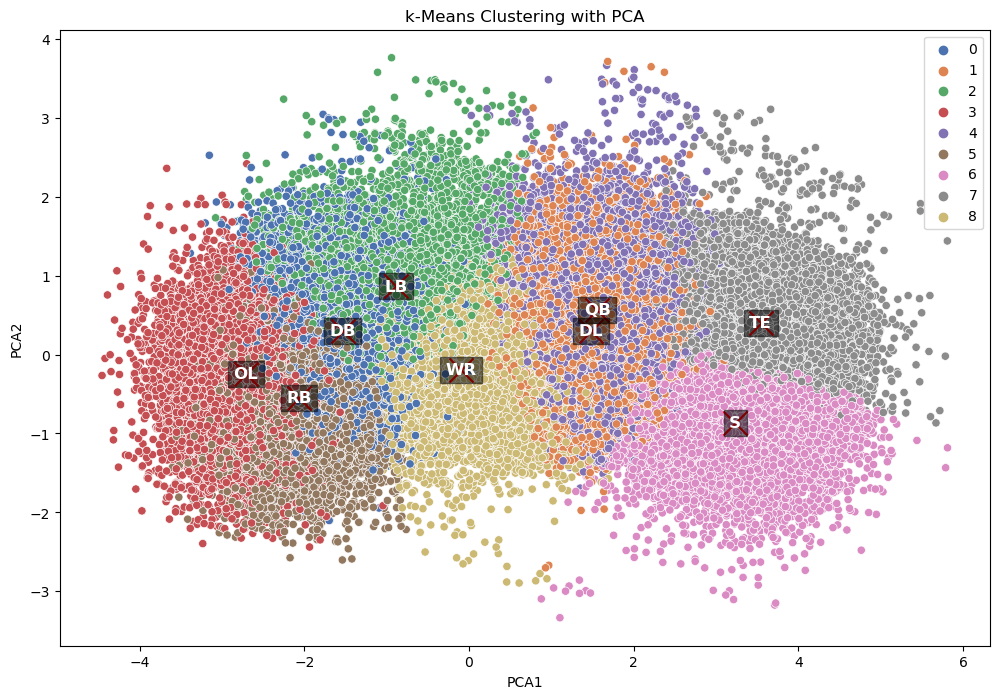

Silhouette Score: 0.10893684424613613
Adjusted Rand Index: 0.3638360484541471


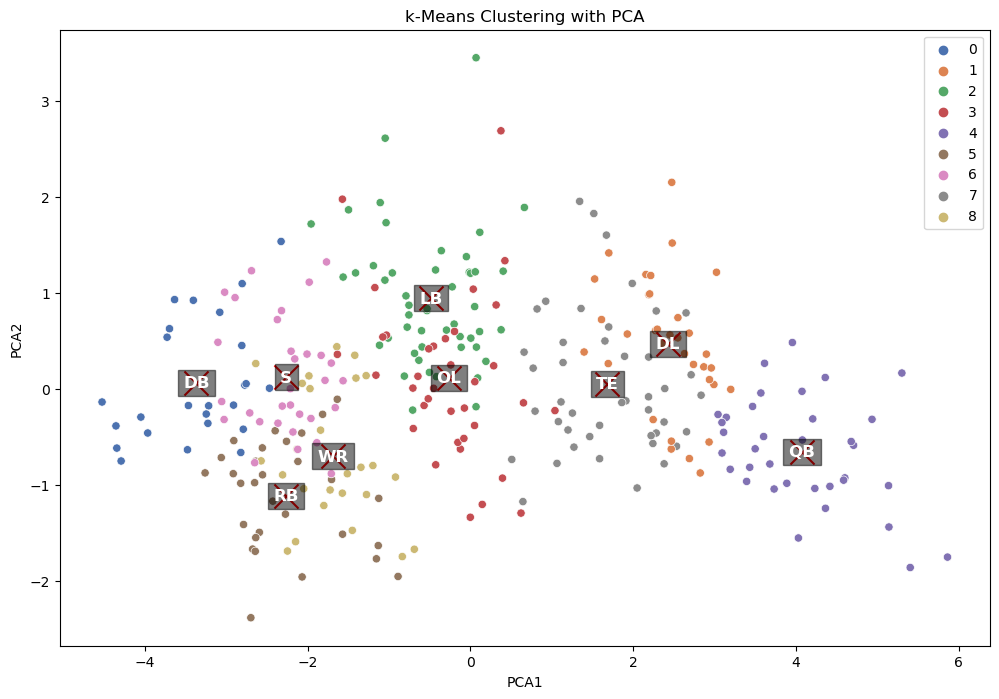

Silhouette Score: 0.1697360289164406
Adjusted Rand Index: 0.2388805225866998
Performing grid search for kNN...
Best parameters for kNN: {'metric': 'manhattan', 'n_neighbors': 13, 'weights': 'distance'}
Best score for kNN: 0.7316592709635482
Performing grid search for XGBoost...
Best parameters for XGBoost: {'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200}
Best score for XGBoost: 0.8157626661333065
Run 1/5


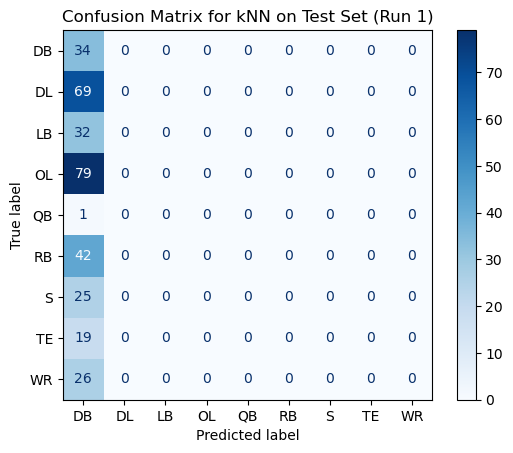

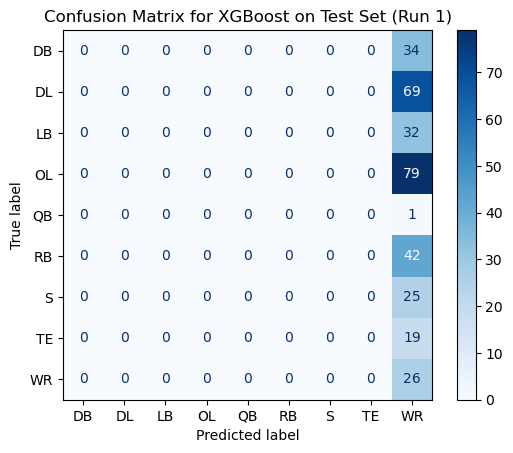

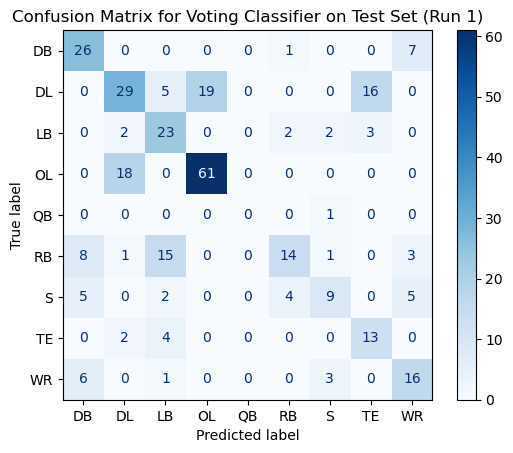

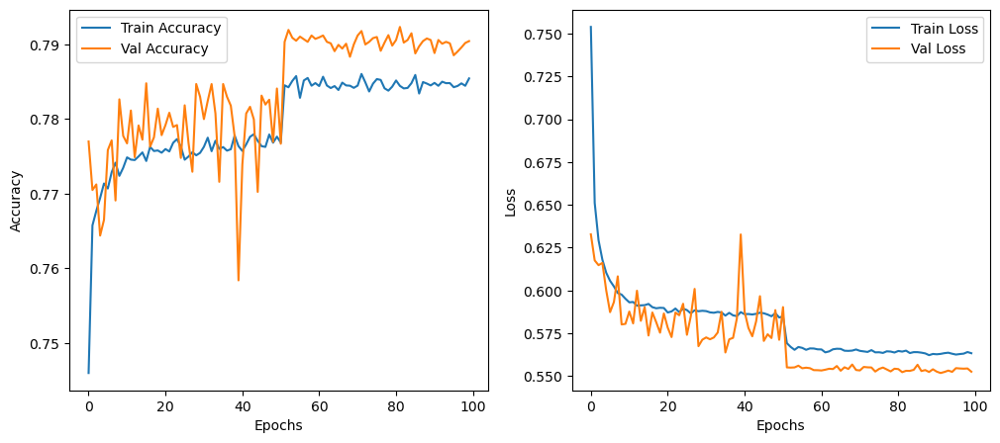

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - accuracy: 0.5918 - loss: 1.2343
First NN Test Accuracy: 0.5932721495628357
First NN Test Loss: 1.2308934926986694
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


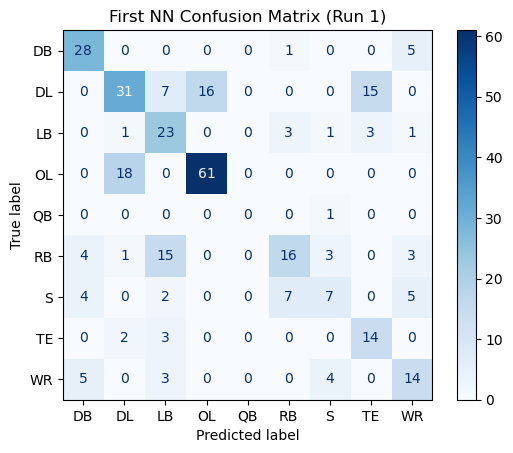

Classes with misclassification rate above 25.0%:
  DL: 55.07%
  LB: 28.12%
  QB: 100.00%
  RB: 61.90%
  S: 72.00%
  TE: 26.32%
  WR: 46.15%


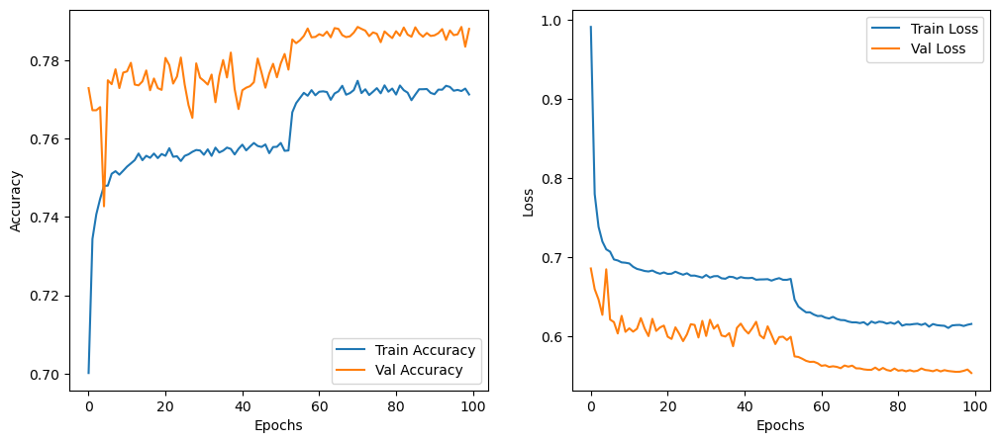

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 951us/step - accuracy: 0.5879 - loss: 1.1742
Second NN Test Accuracy: 0.5902140736579895
Second NN Test Loss: 1.1693897247314453
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


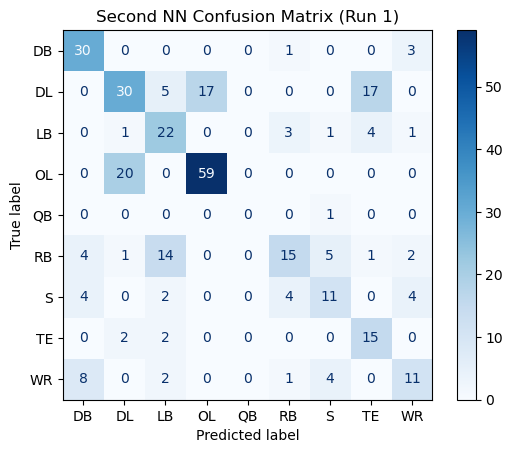

Classes with misclassification rate above 25.0%:
  DL: 56.52%
  LB: 31.25%
  OL: 25.32%
  QB: 100.00%
  RB: 64.29%
  S: 56.00%
  WR: 57.69%


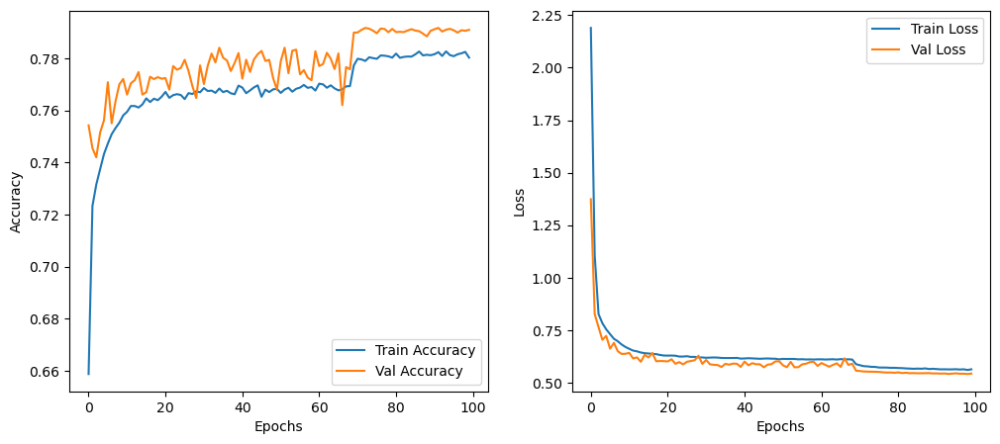

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5869 - loss: 1.2325  
Third NN Test Accuracy: 0.5932721495628357
Third NN Test Loss: 1.2012152671813965
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


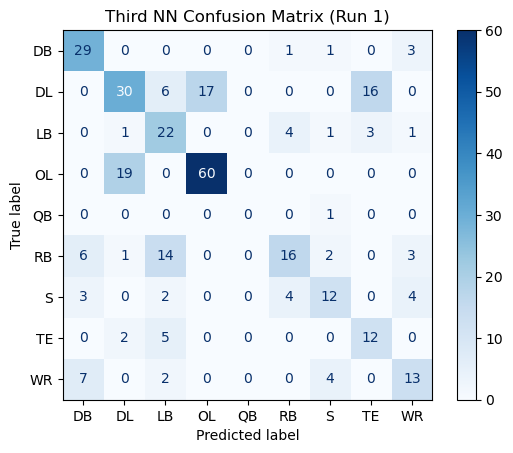

Classes with misclassification rate above 25.0%:
  DL: 56.52%
  LB: 31.25%
  QB: 100.00%
  RB: 61.90%
  S: 52.00%
  TE: 36.84%
  WR: 50.00%
Run 2/5


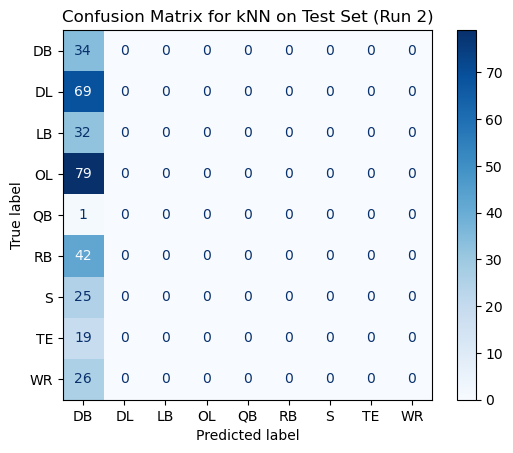

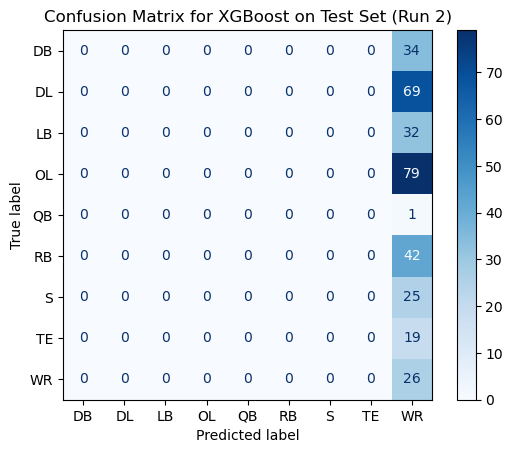

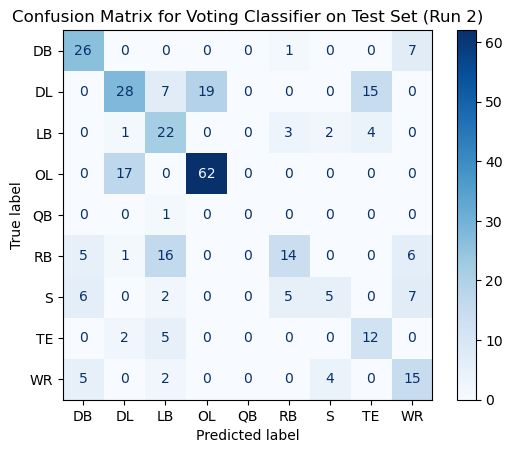

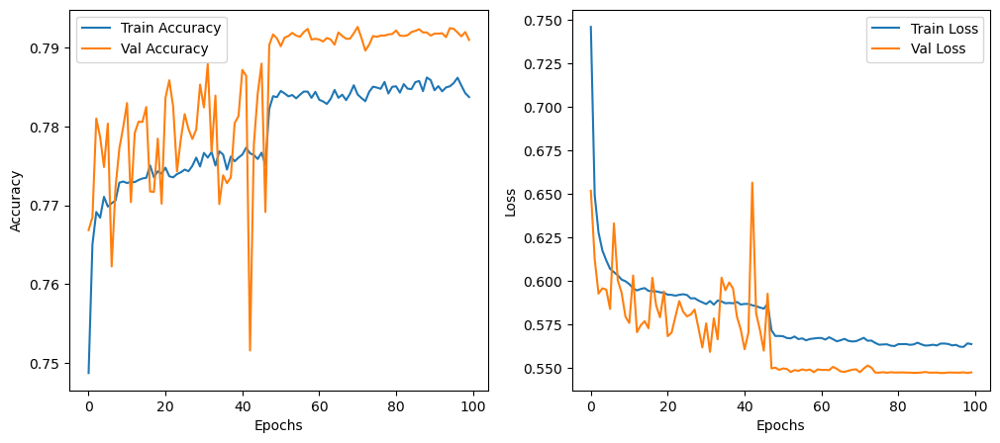

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 872us/step - accuracy: 0.5856 - loss: 1.2331
First NN Test Accuracy: 0.5963302850723267
First NN Test Loss: 1.218348741531372
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


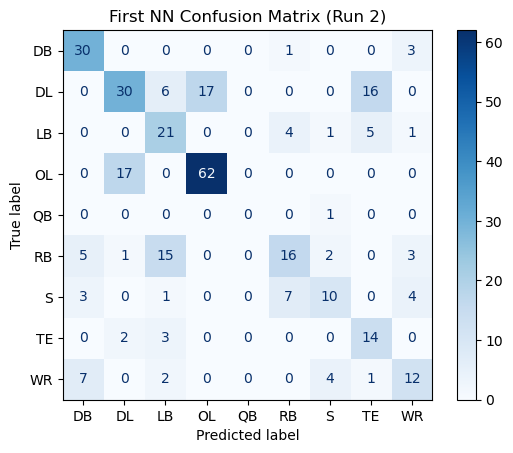

Classes with misclassification rate above 25.0%:
  DL: 56.52%
  LB: 34.38%
  QB: 100.00%
  RB: 61.90%
  S: 60.00%
  TE: 26.32%
  WR: 53.85%


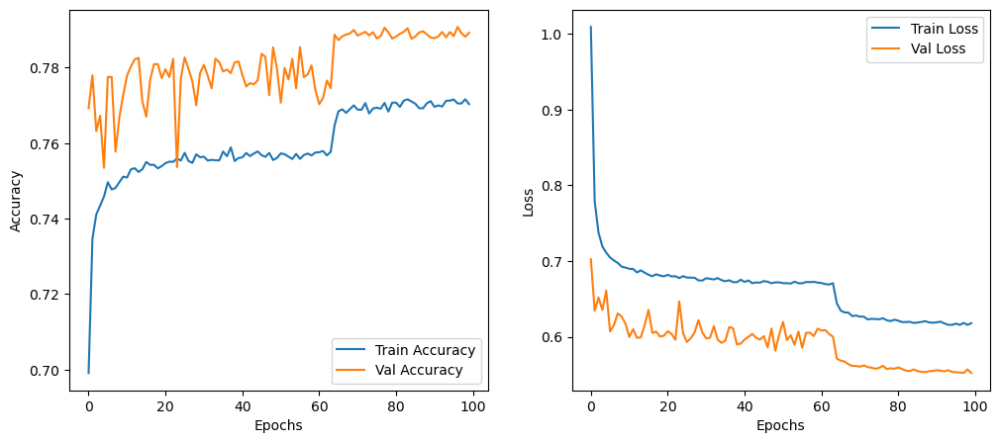

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 867us/step - accuracy: 0.6000 - loss: 1.1939
Second NN Test Accuracy: 0.5932721495628357
Second NN Test Loss: 1.189404010772705
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


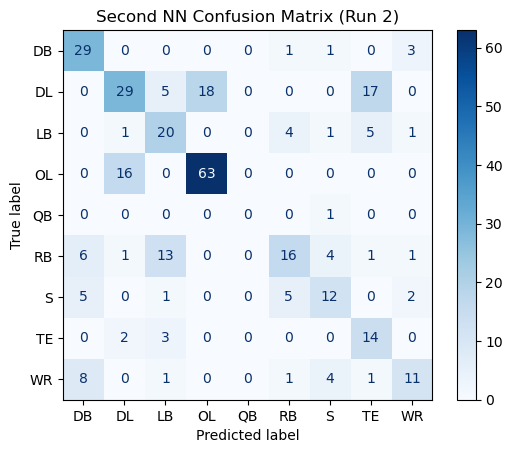

Classes with misclassification rate above 25.0%:
  DL: 57.97%
  LB: 37.50%
  QB: 100.00%
  RB: 61.90%
  S: 52.00%
  TE: 26.32%
  WR: 57.69%


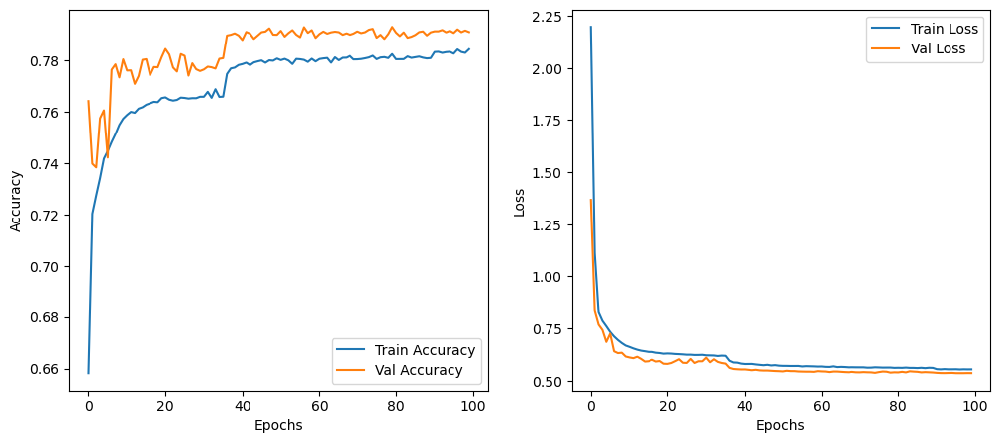

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5937 - loss: 1.2091  
Third NN Test Accuracy: 0.5902140736579895
Third NN Test Loss: 1.1944199800491333
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


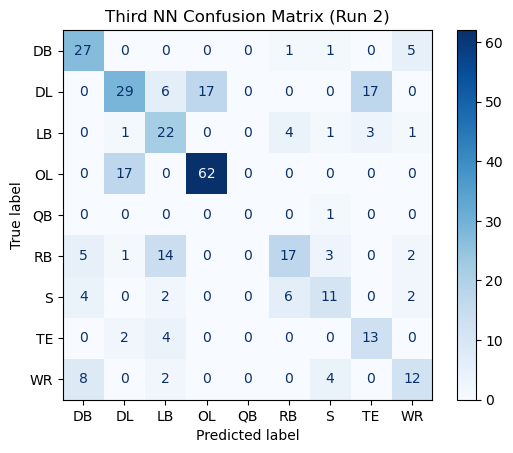

Classes with misclassification rate above 25.0%:
  DL: 57.97%
  LB: 31.25%
  QB: 100.00%
  RB: 59.52%
  S: 56.00%
  TE: 31.58%
  WR: 53.85%
Run 3/5


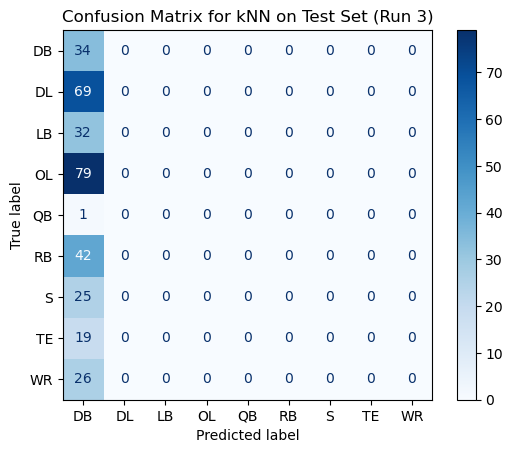

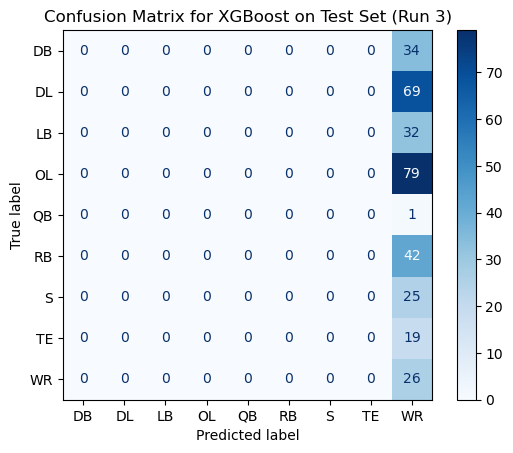

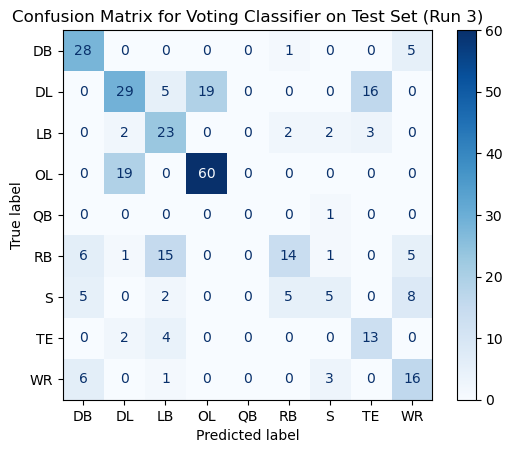

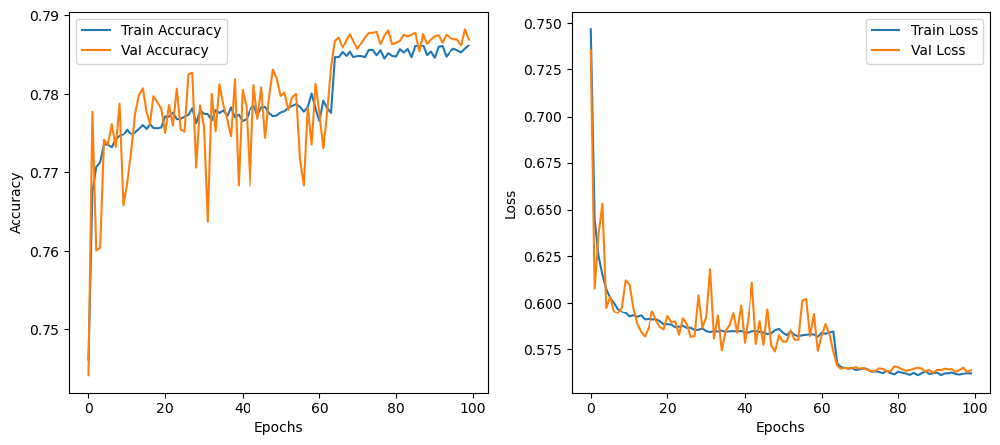

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5950 - loss: 1.2186  
First NN Test Accuracy: 0.60550457239151
First NN Test Loss: 1.2032968997955322
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


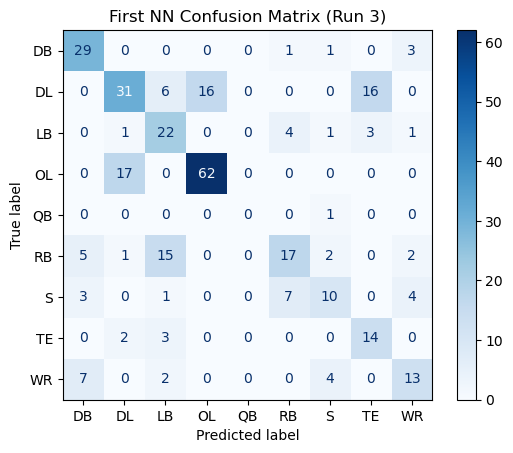

Classes with misclassification rate above 25.0%:
  DL: 55.07%
  LB: 31.25%
  QB: 100.00%
  RB: 59.52%
  S: 60.00%
  TE: 26.32%
  WR: 50.00%


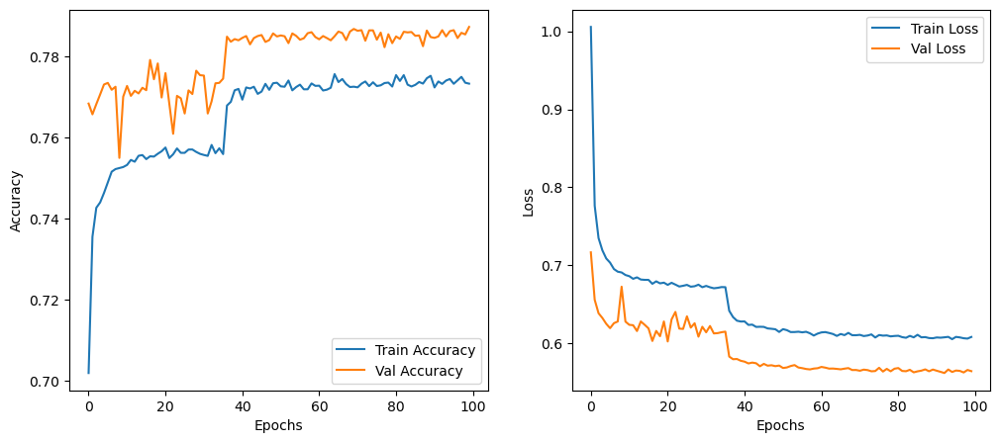

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 852us/step - accuracy: 0.5684 - loss: 1.1813
Second NN Test Accuracy: 0.571865439414978
Second NN Test Loss: 1.1852226257324219
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


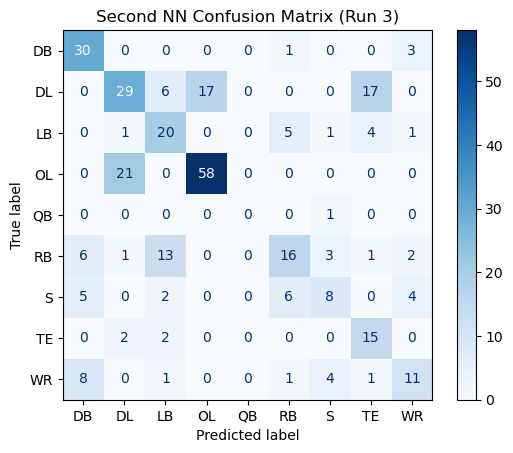

Classes with misclassification rate above 25.0%:
  DL: 57.97%
  LB: 37.50%
  OL: 26.58%
  QB: 100.00%
  RB: 61.90%
  S: 68.00%
  WR: 57.69%


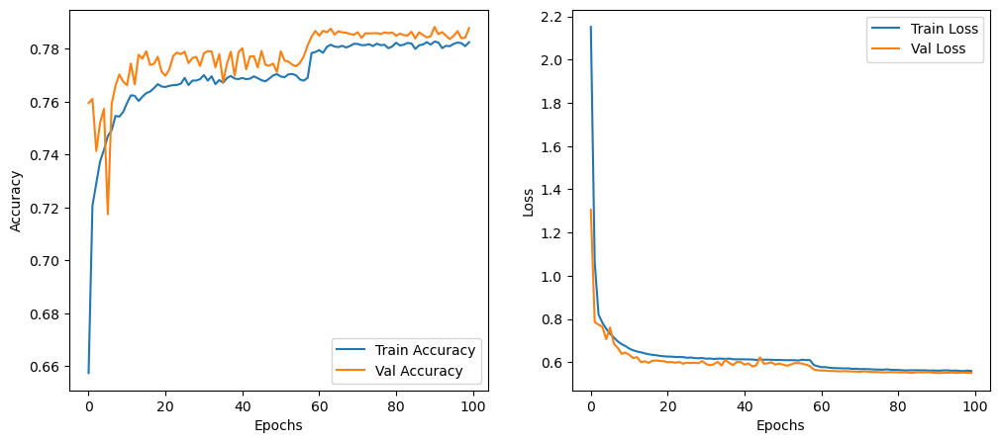

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5934 - loss: 1.1609  
Third NN Test Accuracy: 0.6024464964866638
Third NN Test Loss: 1.1561723947525024
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


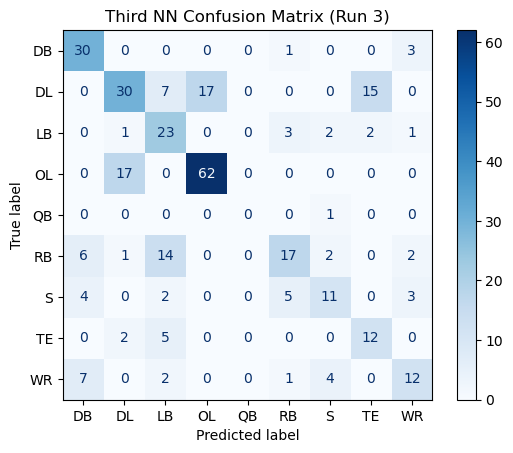

Classes with misclassification rate above 25.0%:
  DL: 56.52%
  LB: 28.12%
  QB: 100.00%
  RB: 59.52%
  S: 56.00%
  TE: 36.84%
  WR: 53.85%
Run 4/5


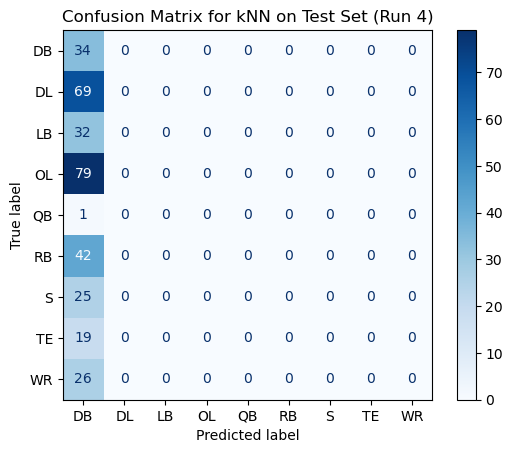

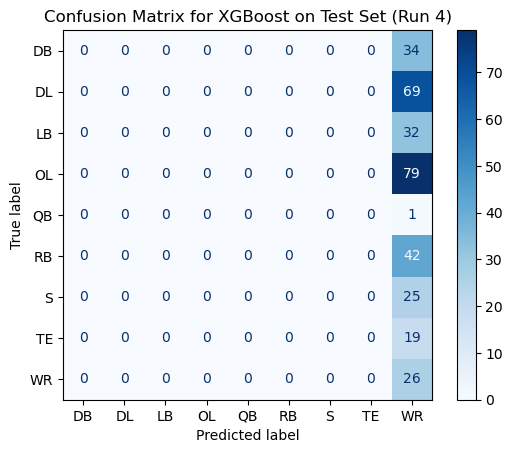

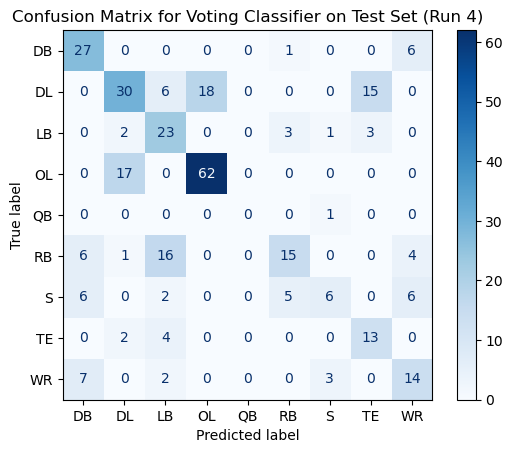

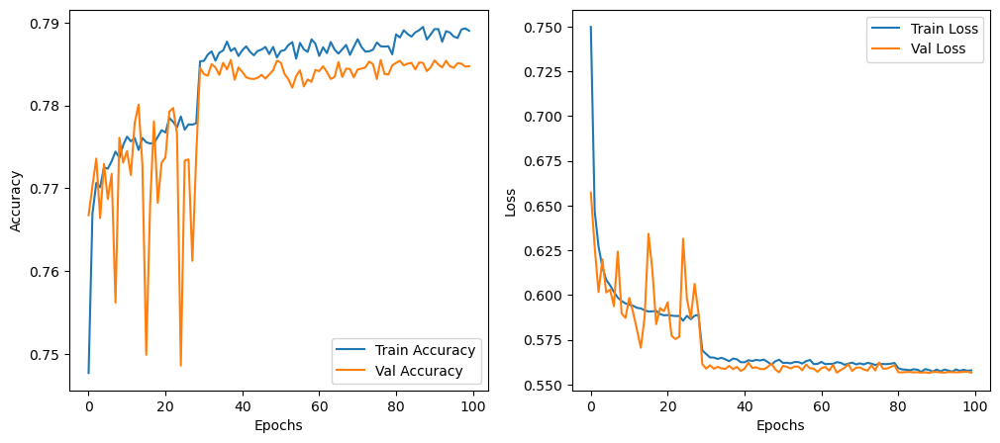

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 750us/step - accuracy: 0.5833 - loss: 1.2309
First NN Test Accuracy: 0.5871559381484985
First NN Test Loss: 1.2209453582763672
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


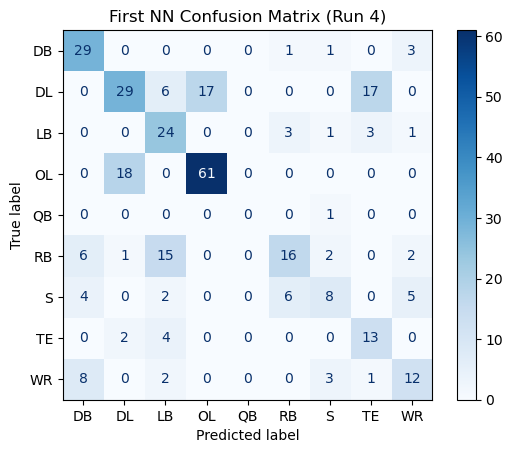

Classes with misclassification rate above 25.0%:
  DL: 57.97%
  QB: 100.00%
  RB: 61.90%
  S: 68.00%
  TE: 31.58%
  WR: 53.85%


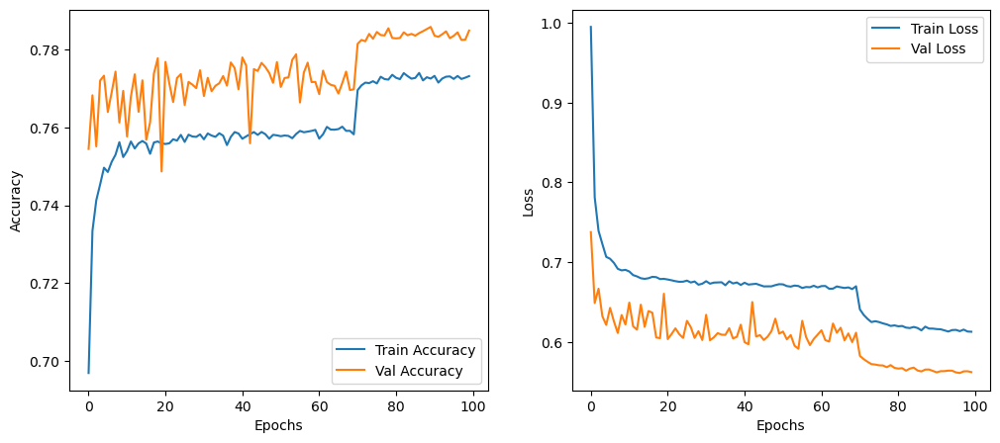

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 814us/step - accuracy: 0.5885 - loss: 1.1537
Second NN Test Accuracy: 0.5840978622436523
Second NN Test Loss: 1.1458568572998047
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


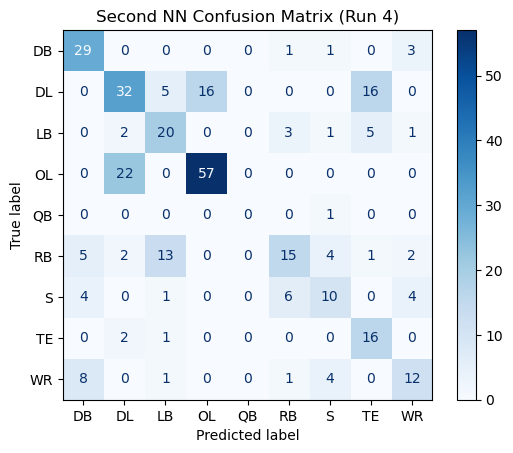

Classes with misclassification rate above 25.0%:
  DL: 53.62%
  LB: 37.50%
  OL: 27.85%
  QB: 100.00%
  RB: 64.29%
  S: 60.00%
  WR: 53.85%


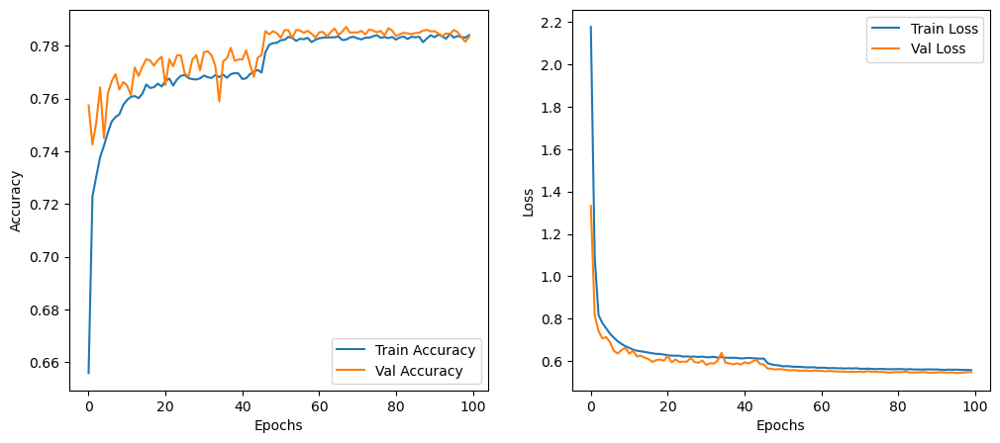

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5948 - loss: 1.1537  
Third NN Test Accuracy: 0.5871559381484985
Third NN Test Loss: 1.1625086069107056
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


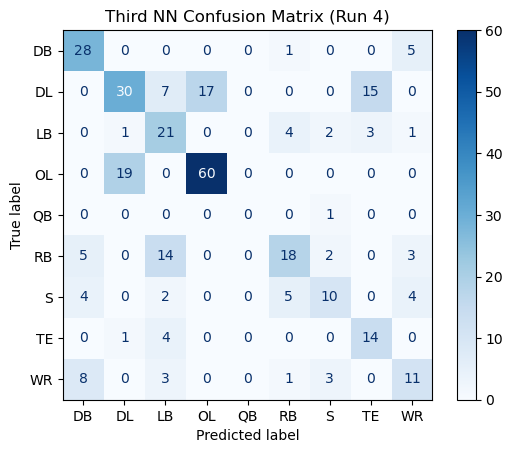

Classes with misclassification rate above 25.0%:
  DL: 56.52%
  LB: 34.38%
  QB: 100.00%
  RB: 57.14%
  S: 60.00%
  TE: 26.32%
  WR: 57.69%
Run 5/5


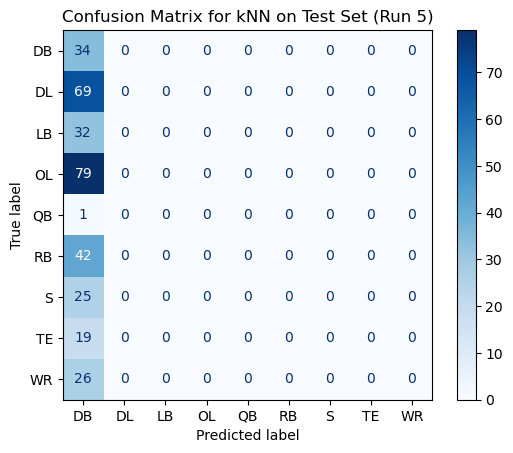

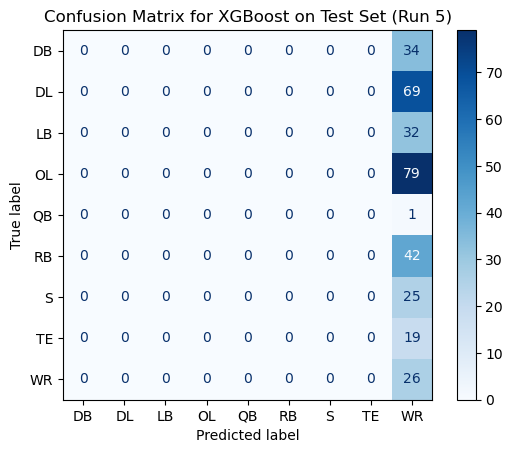

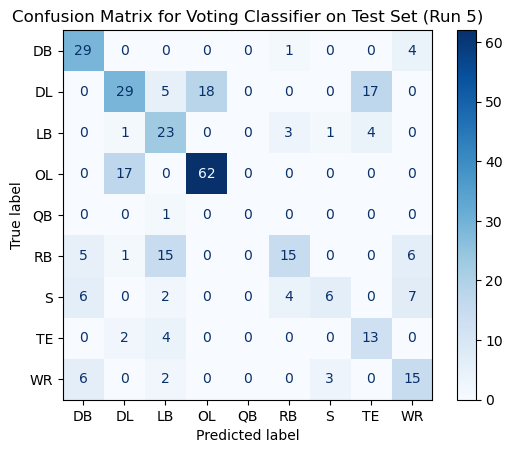

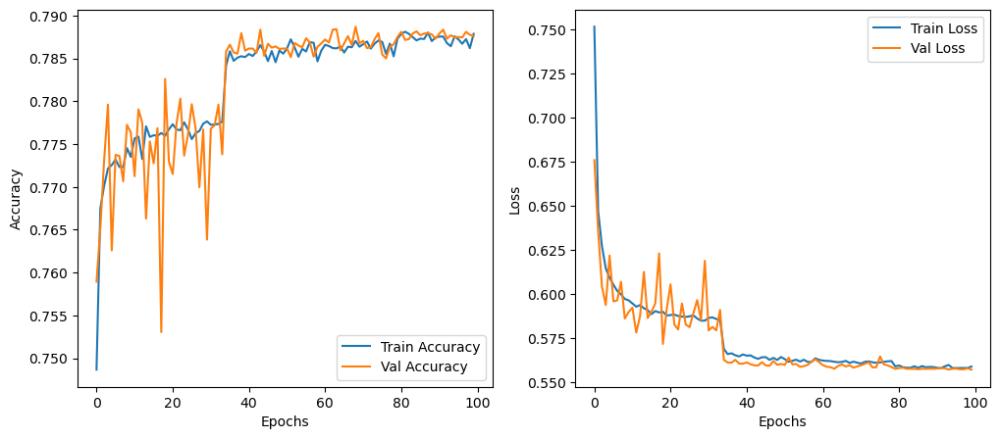

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 633us/step - accuracy: 0.5835 - loss: 1.2211
First NN Test Accuracy: 0.5902140736579895
First NN Test Loss: 1.1959084272384644
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


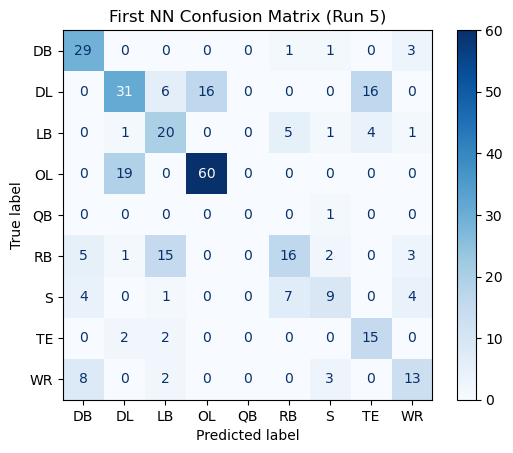

Classes with misclassification rate above 25.0%:
  DL: 55.07%
  LB: 37.50%
  QB: 100.00%
  RB: 61.90%
  S: 64.00%
  WR: 50.00%


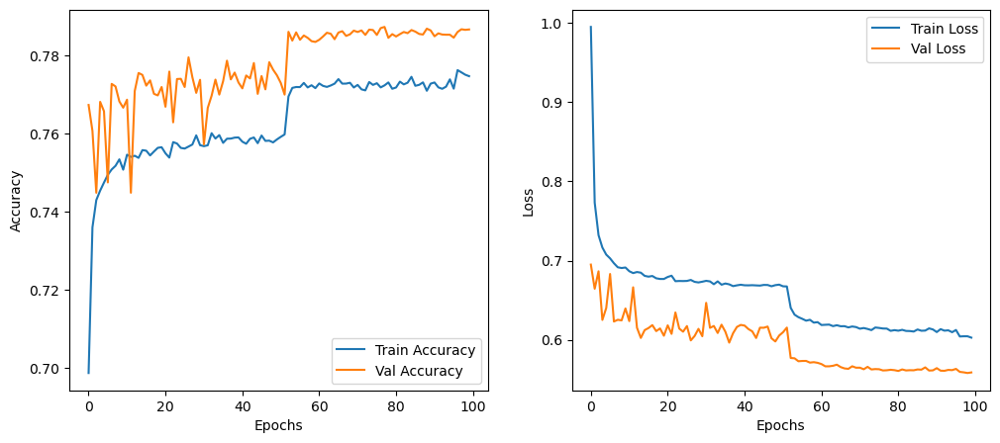

11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 892us/step - accuracy: 0.5820 - loss: 1.1834
Second NN Test Accuracy: 0.5840978622436523
Second NN Test Loss: 1.1752859354019165
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


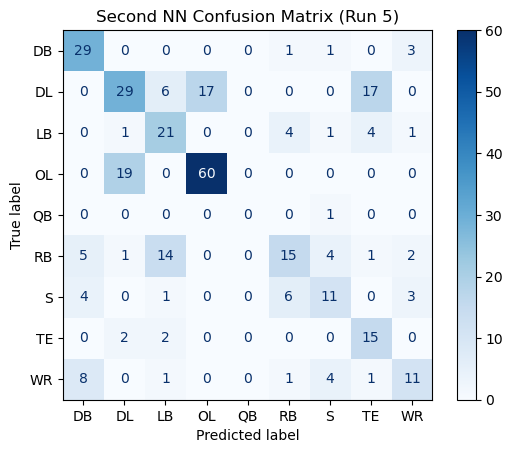

Classes with misclassification rate above 25.0%:
  DL: 57.97%
  LB: 34.38%
  QB: 100.00%
  RB: 64.29%
  S: 56.00%
  WR: 57.69%


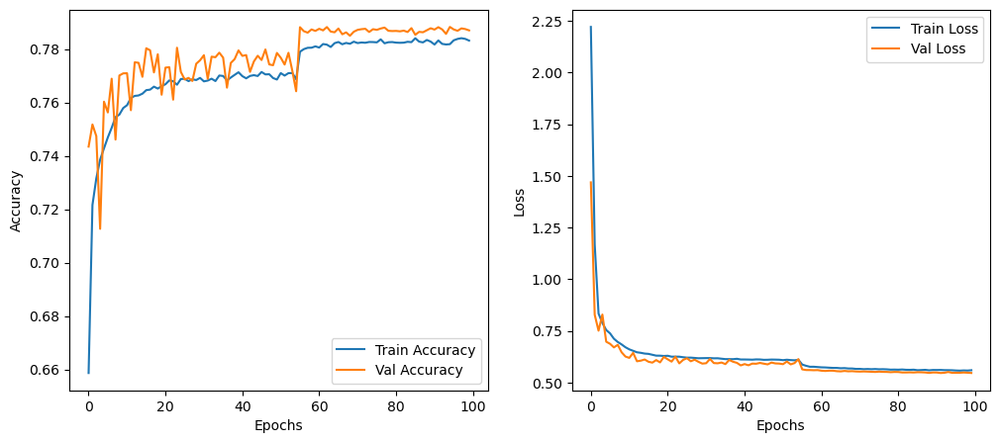

11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5947 - loss: 1.1995  
Third NN Test Accuracy: 0.5932721495628357
Third NN Test Loss: 1.1780835390090942
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


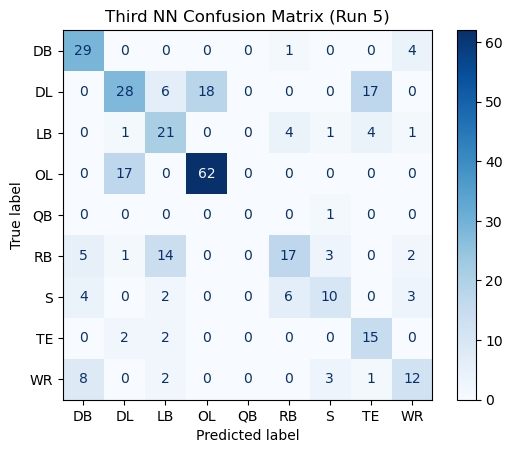

Classes with misclassification rate above 25.0%:
  DL: 59.42%
  LB: 34.38%
  QB: 100.00%
  RB: 59.52%
  S: 60.00%
  WR: 53.85%
Statistics for kNN:
Accuracy:
  Mean: 0.10397553516819572
  Median: 0.10397553516819572
  Std Dev: 0.0
  Min: 0.10397553516819572
  Max: 0.10397553516819572
Precision:
  Mean: 0.010810911913512704
  Median: 0.010810911913512704
  Std Dev: 0.0
  Min: 0.010810911913512704
  Max: 0.010810911913512704
Recall:
  Mean: 0.10397553516819572
  Median: 0.10397553516819572
  Std Dev: 0.0
  Min: 0.10397553516819572
  Max: 0.10397553516819572
Statistics for XGBoost:
Accuracy:
  Mean: 0.07951070336391437
  Median: 0.07951070336391437
  Std Dev: 0.0
  Min: 0.07951070336391437
  Max: 0.07951070336391437
Precision:
  Mean: 0.006321951949424384
  Median: 0.006321951949424385
  Std Dev: 8.673617379884035e-19
  Min: 0.006321951949424385
  Max: 0.006321951949424385
Recall:
  Mean: 0.07951070336391437
  Median: 0.07951070336391437
  Std Dev: 0.0
  Min: 0.07951070336391437
  Max: 0.0

In [16]:
from sklearn.preprocessing import StandardScaler

# Define the features to be scaled
features = ['Ht', 
            'Wt', 
            'Forty', 
            'Vertical', 
            'BenchReps', 
            'BroadJump', 
            'Cone', 
            'Shuttle']

# Check if 'Pos' column exists and drop it if it does
if 'Pos' in training_data.columns:
    training_data = training_data.drop(columns=['Pos'])

# Separate features (X) and labels (y)
X = training_data.drop(columns=['Pos_Label'])
y = training_data['Pos_Label']

''' 
This function is used within the 'run_classification_experiments()' and 'run_nn_experiments()' functions.

The StandardScaler library from Scikit Learn is used to scale the features in the dataset.
Scaling the features ensures that each feature contributes equally to the analysis and prevents
features with larger scales from dominating the model. In this case, the StandardScaler scales
the features to have a mean of 0 and a standard deviation of 1. This normalization process is
commonly used in machine learning to improve the performance of models that rely on distance-based
metrics or gradient descent optimization.

An alternative to using StandardScaler is MinMaxScaler, which scales the features to a specified
range (e.g., 0 to 1). This is typically used when the data is not normally distributed and the
outliers are important to the analysis.

The difference between fitting and transforming data is an important concept in machine learning.
Fitting a model or a scaler involves learning the parameters of the model or the scaling factors
from the data. In this case, fitting the scaler on the training data calculates the mean and standard
deviation of each feature in the training set. Transforming the data applies the learned scaling factors
to the data, resulting in scaled features with a mean of 0 and a standard deviation of 1.

The scaler is first fitted on the training data using the fit_transform method, which calculates the
mean and standard deviation of each feature and scales the data accordingly. The transformed data is
then stored in X_train_scaled. The validation data is then scaled using the transform method, which
applies the same scaling factors learned from the training data to the validation data. The scaled
validation data is stored in X_val_scaled.
'''

# Preprocess df_test to align with training and validation sets
# Remove 'Pos' column since we have 'Pos_Label'
df_test_processed = df_test.drop(columns=['Pos'])

# Ensure the columns are in the correct order
df_test_processed = df_test_processed[ordered_columns[:-1] + ['Pos_Label']]

# Separate features (X_test) and labels (y_test)
X_test = df_test_processed.drop(columns=['Pos_Label'])
y_test = df_test_processed['Pos_Label']

# Number of times to run the program and gather data
n_runs = 5

'''
If we run the program multiple times, our expectation would be to see some variation in the results due to
the random initialization of the models, the random shuffling of the data, and the random selection of the validation
set. By doing that and collecting statistics on the results, we can gain insights into the
variability of the models' performance and the robustness of the results, essentially bounding the expected
performance of the models. This can help us understand the stability of the models and the generalization
performance across different runs.
'''

# Initialize the StandardScaler and fit on the entire training data (to prevent data leakage)
scaler = StandardScaler().fit(X)

# Transform the test data using the fitted scaler
X_test_scaled = scaler.transform(X_test)

# Threshold for identifying misclassified classes (i.e. wide receiver as a defensive back)
misclassification_threshold = 0.25

# Extract label names from the position mapping
label_names = [k for k, v in sorted(pos_label_mapping.items(), key=lambda item: item[1])]

# Run k-Means clustering on the training and test data
k_means_train = perform_kmeans_clustering(X, y, label_names)
k_means_train_eval = evaluate_kmeans_clustering(X, y)
k_means_test = perform_kmeans_clustering(X_test, y_test, label_names)
k_means_test_eval = evaluate_kmeans_clustering(X_test, y_test)

# Perform grid search once and use the best estimators for subsequent runs
best_estimators = perform_grid_search(X, y)

# Initialize results containers
knn_results_all = {'accuracy': [], 'precision': [], 'recall': []}
xgb_results_all = {'accuracy': [], 'precision': [], 'recall': []}
voting_results_all = {'accuracy': [], 'precision': [], 'recall': []}
nn_results_all = {'First NN': {'accuracy': [], 'precision': [], 'recall': [], 'misclassified_classes': []},
                  'Second NN': {'accuracy': [], 'precision': [], 'recall': [], 'misclassified_classes': []},
                  'Third NN': {'accuracy': [], 'precision': [], 'recall': [], 'misclassified_classes': []}}

# Loop for n_runs to perform classification and neural network experiments
for run in range(1, n_runs + 1):
    print(f"Run {run}/{n_runs}")
    
    # Split the data into training and validation sets
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=None)
    
    # Scale the training and validation sets
    X_train_scaled = scaler.transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    # Run classification experiments
    knn_results, xgb_results, voting_results = run_classification_experiments(run, best_estimators, X_train_scaled, y_train, X_val_scaled, y_val, X_test_scaled, y_test)
    knn_results_all['accuracy'].extend(knn_results['accuracy'])
    knn_results_all['precision'].extend(knn_results['precision'])
    knn_results_all['recall'].extend(knn_results['recall'])
    xgb_results_all['accuracy'].extend(xgb_results['accuracy'])
    xgb_results_all['precision'].extend(xgb_results['precision'])
    xgb_results_all['recall'].extend(xgb_results['recall'])
    voting_results_all['accuracy'].extend(voting_results['accuracy'])
    voting_results_all['precision'].extend(voting_results['precision'])
    voting_results_all['recall'].extend(voting_results['recall'])

    # Run neural network experiments
    nn_results = run_nn_experiments(run, X_train_scaled, y_train, X_val_scaled, y_val, X_test_scaled, y_test, label_names, misclassification_threshold)
    for model_name, metrics in nn_results.items():
        nn_results_all[model_name]['accuracy'].extend(metrics['accuracy'])
        nn_results_all[model_name]['precision'].extend(metrics['precision'])
        nn_results_all[model_name]['recall'].extend(metrics['recall'])
        nn_results_all[model_name]['misclassified_classes'].extend(metrics['misclassified_classes'])

# Print statistics
print_stats(knn_results_all, 'kNN')
print_stats(xgb_results_all, 'XGBoost')
print_stats(voting_results_all, 'Voting Classifier')